Britton Lab - 06/09/2023 <br>

Early Polarization - Allan Deviation Plots


<font color='red'>Author: Evan McClintock

In [1]:
import numpy as np
#from numpy import linalg as la
import matplotlib.pyplot as plt
import pandas as pd
#from datetime import timedelta
import allantools #https://allantools.readthedocs.io/en/latest/functions.html
import os
#import scipy
#import copy
#import math
#import time
#import pypolar.jones as jones #https://pypolar.readthedocs.io/en/latest/05-Jones-Examples.html
#import pypolar.mueller as mueller
#import pypolar.visualization as vis
#import py_pol
#from py_pol.jones_vector import Jones_vector, degrees #https://py-pol.readthedocs.io/en/master/source/tutorial/Drawing_docs.html
#from py_pol.stokes import Stokes, create_Stokes, degrees
#import seaborn as sns
#import plotly.graph_objs as go   # For plotting 3D vectors
#from plotly.offline import iplot
#import warnings

In [5]:
import importlib
import data_manager.dataset
import data_manager.stationary
import data_manager.switch
import data_manager.plotting
import data_manager.pairs
importlib.reload(data_manager.dataset)
importlib.reload(data_manager.stationary)
importlib.reload(data_manager.switch)
importlib.reload(data_manager.plotting)
importlib.reload(data_manager.pairs)
from data_manager.dataset import Dataset
from data_manager.stationary import StationarySet
from data_manager.switch import SwitchSet
from data_manager.plotting import plot_rot_angle
from data_manager.pairs import IOPair

In [6]:
# plt.ioff() #https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.ioff.html
# plt.close('all')
BOLD_ON = "\033[1m"
BOLD_OFF = "\033[0m"
LAB = "/mnt/c/Users/2020n/Documents/Career/Locations/Britton Lab/"
DATA = LAB + "QWDM_Project/H1_Datasets/"

In [7]:
import sys
print(sys.executable)
print(sys.version)
print(sys.version_info)

/home/evanshaped/anaconda3/envs/britton2024envWSL/bin/python
3.12.2 | packaged by conda-forge | (main, Feb 16 2024, 20:50:58) [GCC 12.3.0]
sys.version_info(major=3, minor=12, micro=2, releaselevel='final', serial=0)


# Individual Datasets

### Displaying datasets

In [108]:
folder_path = 'Datasets/Whole_setup/Initial_runs'
datasets = []
i=0
print(BOLD_ON + '===== Datasets =====' + BOLD_OFF)
for file_name in os.listdir(folder_path):
    if file_name.endswith('.csv'):
        file_path = os.path.join(folder_path, file_name)
        #display(file_path)
        ds = SwitchSet(file_path)
        datasets.append(ds)
        print('{:d}: {:s}'.format(i, ds.title))
        i+=1
print(BOLD_ON + '========================' + BOLD_OFF)
# for ds in datasets:
#     rate_hist_fig = ds.rate_hist(bins=80, xmax=0.08)
#     display(rate_hist_fig); plt.close(rate_hist_fig)

===== Datasets =====
0: PAX_1345_2Hz_DC_stability_1
1: PAX_1345_entire_30m
2: PAX_1345_entire_30m_stab_1
3: PAX_1345_fast_1
4: PAX_1345_fast_2
5: PAX_1345_stab_2
6: PAX_1545_2Hz_DC_stability_1
7: PAX_1545_stab_2


### Stable dataset (Switching)

In [32]:
plt.ioff()
plt.close('all')

In [38]:
filename = 'Datasets/Whole_setup/08-01/PAX_1345_stab_2.csv'
ds = SwitchSet(filename)
ds.find_switches(nominal_switch_rate=2, print_process=False)
ds.average_data(print_process=True)

Time range: min=20.003, max=300.008
=== starting average_data ===
averaging data... Done
Dropped 28 observations with <4 points (out of total 1118 observations)

--- interpolating data ---
length before: 545
length after: 559
14 total added
--- end interpolating data ---

--- interpolating data ---
length before: 545
length after: 559
14 total added
--- end interpolating data ---
Signal 1 size=559	Signal 1 range: t=(20.66,299.66)
Signal 2 size=559	Signal 2 range: t=(20.41,299.41)
=== end average_data ===


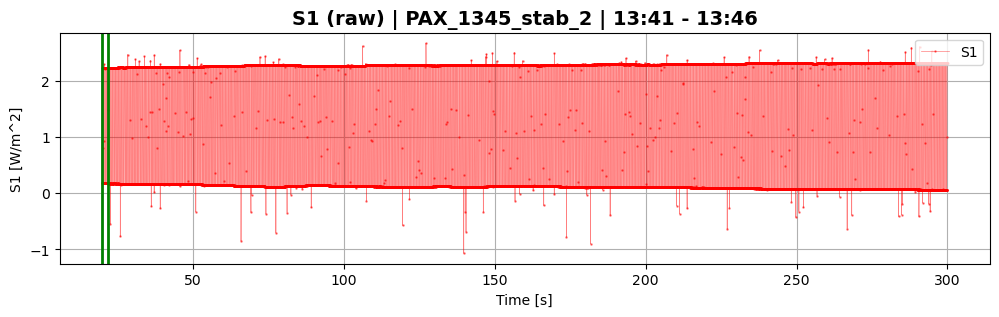

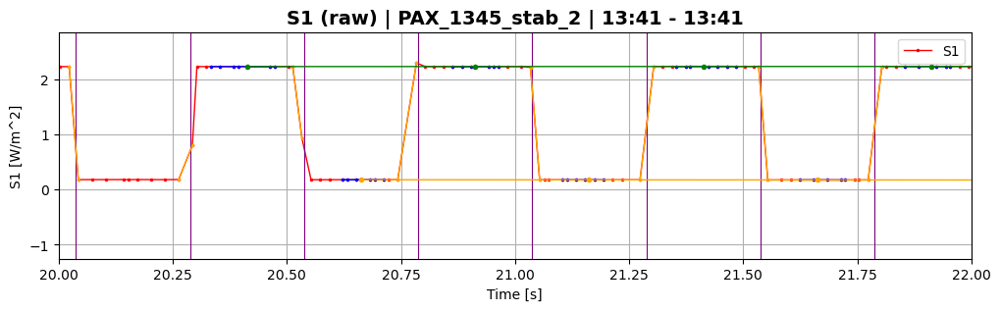

In [37]:
ds.plot_raw(plot_param='S1', sample_range=(20,22),plot_switch=True,plot_jumps=True,plot_valid=True,plot_avg=True)
#ds.rate_hist(bins=80)

### Sectioned stable dataset (switching)

updating NCP_fig
updating CP_fig


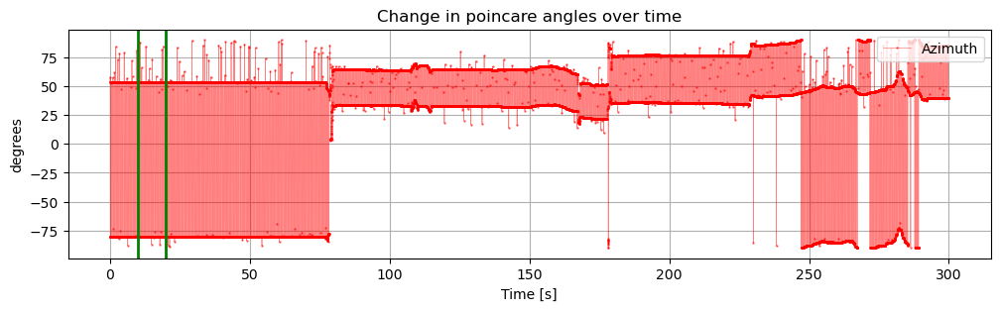

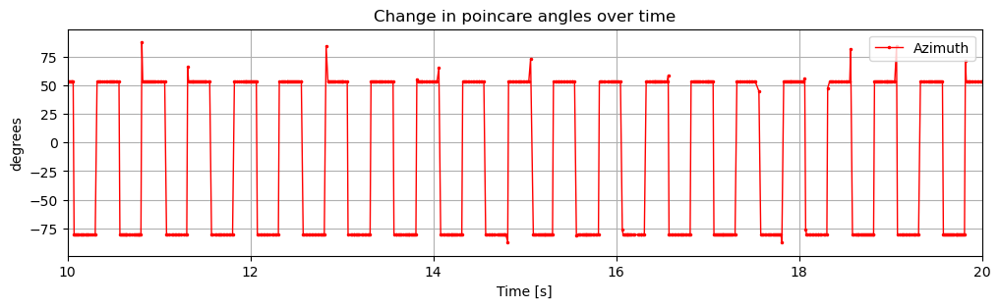

In [84]:
plt.ioff()
plt.close('all')
filename = 'Datasets/Whole_setup/PAX_1345_entire_30m.csv'
ds = SwitchSet(filename)
ds.plot(sample_range=(10,20),plot_param='Azimuth')
#ds.plot(sample_range=(250,260),plot_param='Ellipticity')
#rate_hist_fig = ds.rate_hist(bins=80); display(rate_hist_fig); plt.close(rate_hist_fig)

degree_tolerance = 3.0
first_tolerance = 1.0
second_tolerance = 0.5

jump_fig for: switch parameter = Azimuth



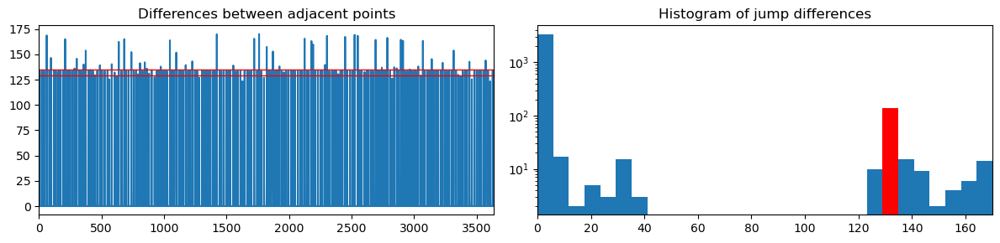



jump_fig for: switch parameter = Ellipticity



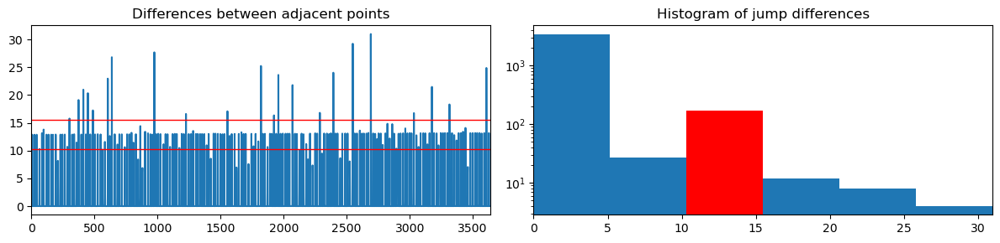



switch parameter = Azimuth

Jump points detected: 140
out of total: ~200.0



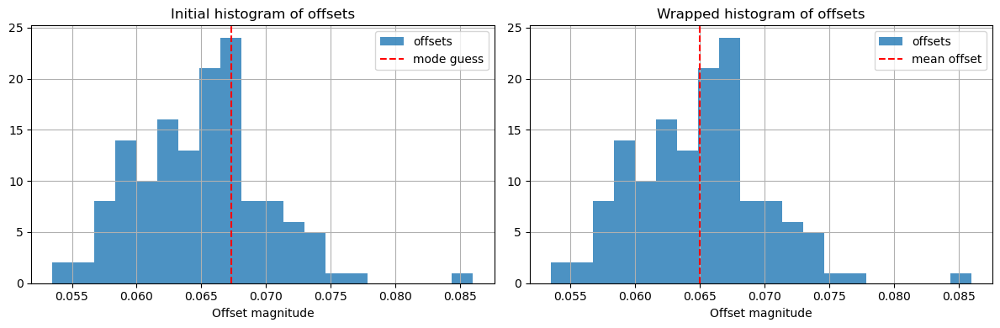

False    20260
True      1200
Name: IsStartPoint, dtype: int64

Int64Index([], dtype='int64')

In [85]:
nominal_switch_rate = 2   # 2 Hz
change_point_range = (10,60)
ds.change_point(nominal_switch_rate, change_point_range, n_exclude=3, print_process=True)
avg_df_arr = ds.average_data()

updating CP_fig
plotting jumps


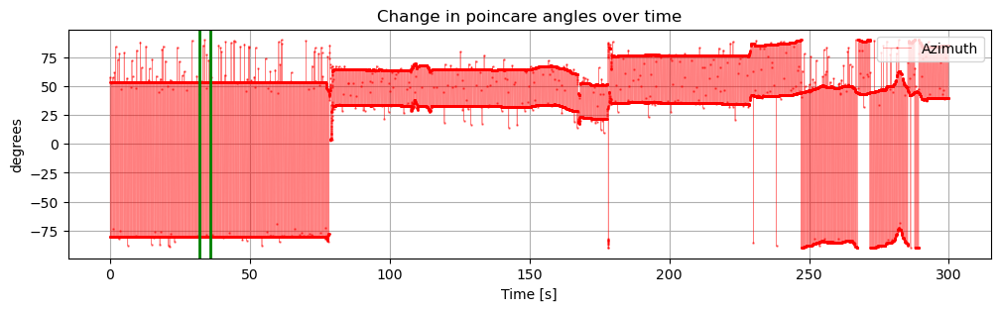

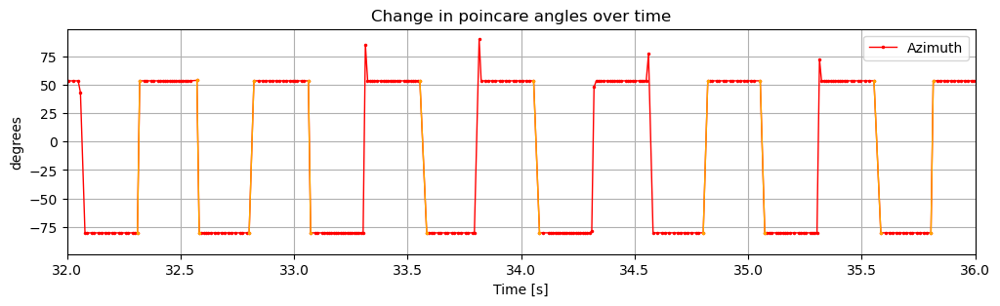

updating CP_fig


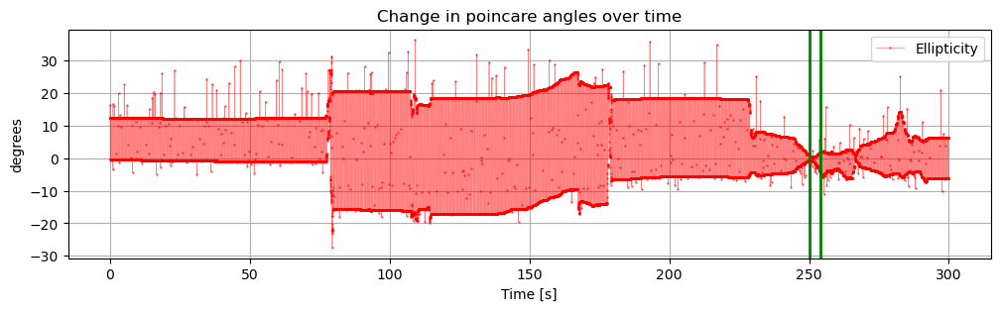

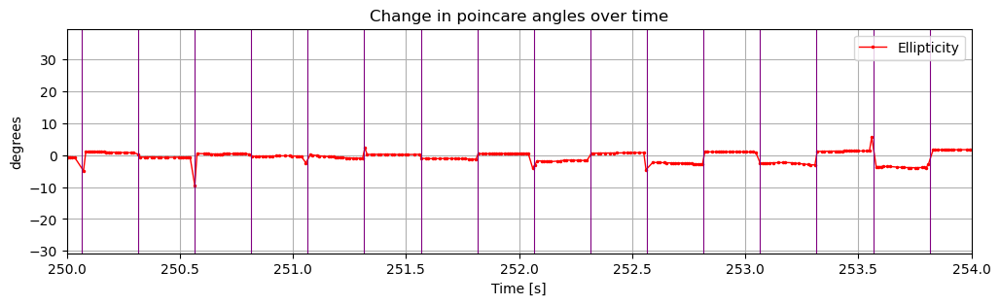

In [164]:
ds.plot(sample_range=(32,36),plot_param='Azimuth',plot_switch=False,plot_jumps=True,plot_valid=False,plot_avg=False)
ds.plot(sample_range=(250,254),plot_param='Ellipticity',plot_switch=True,plot_jumps=False,plot_valid=False,plot_avg=False)

updating CP_fig
plotting jumps


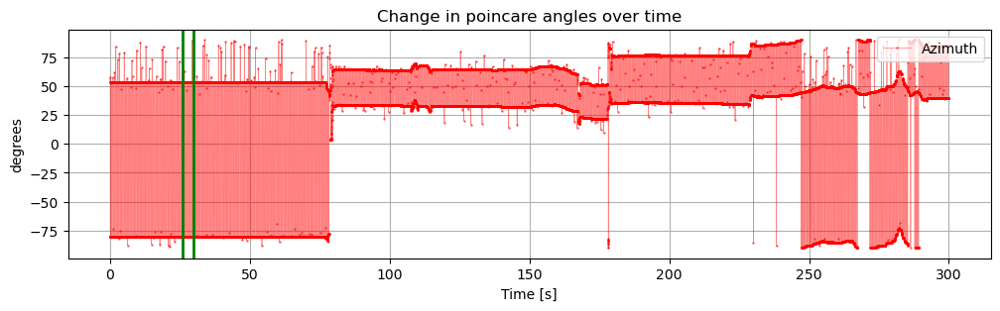

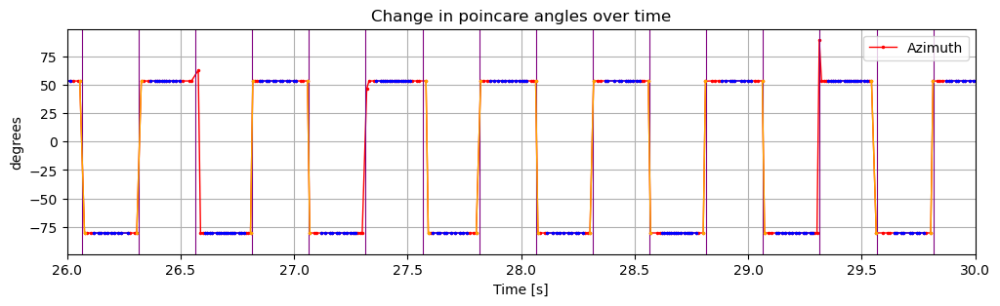

updating CP_fig


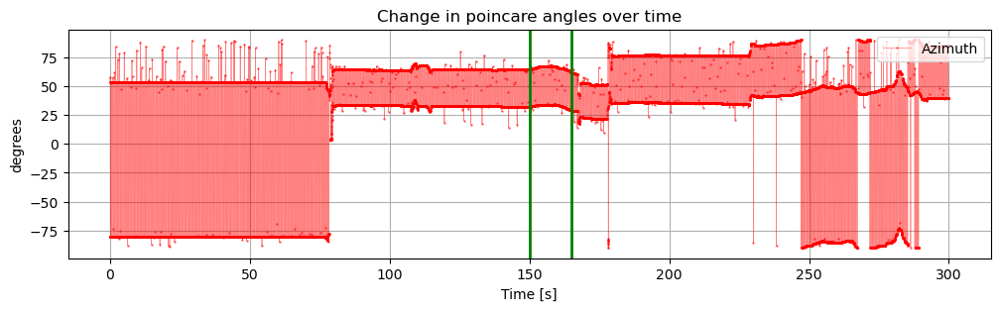

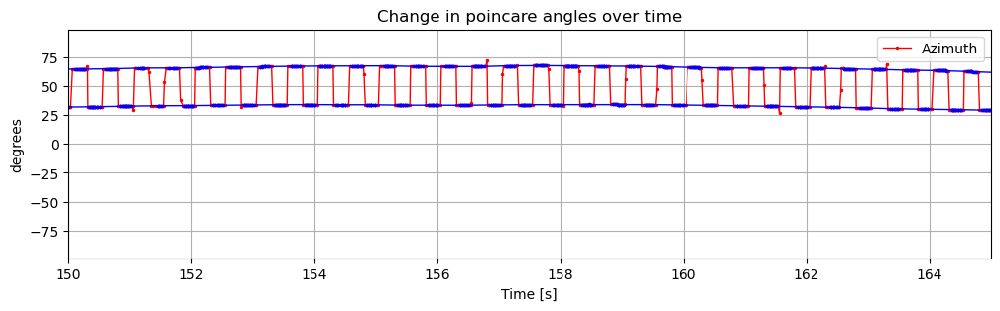

updating CP_fig


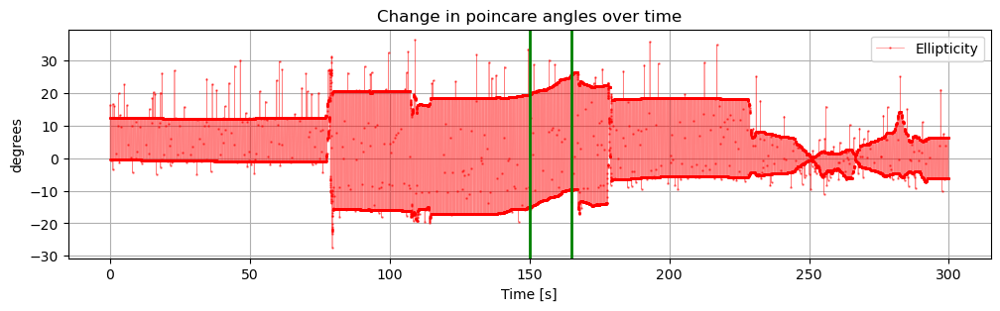

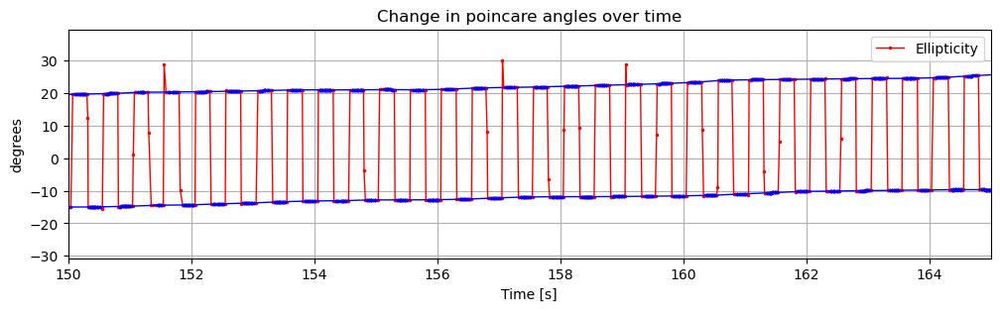

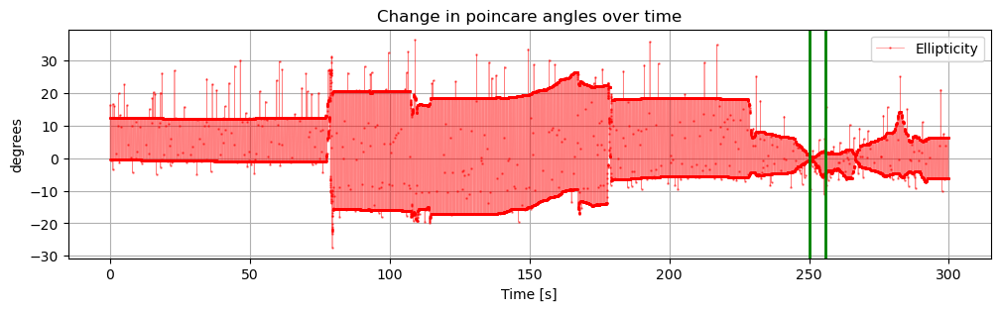

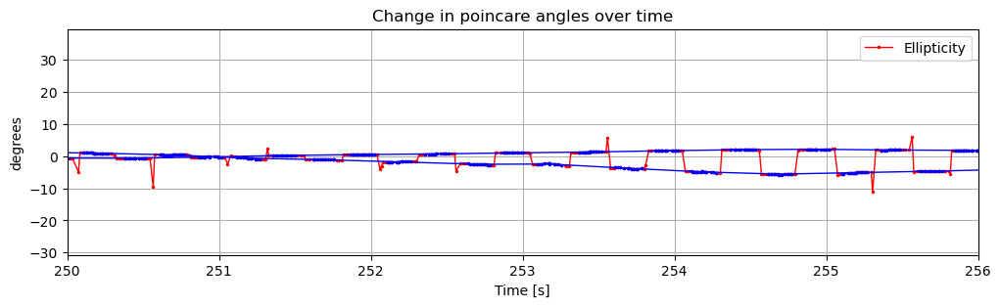

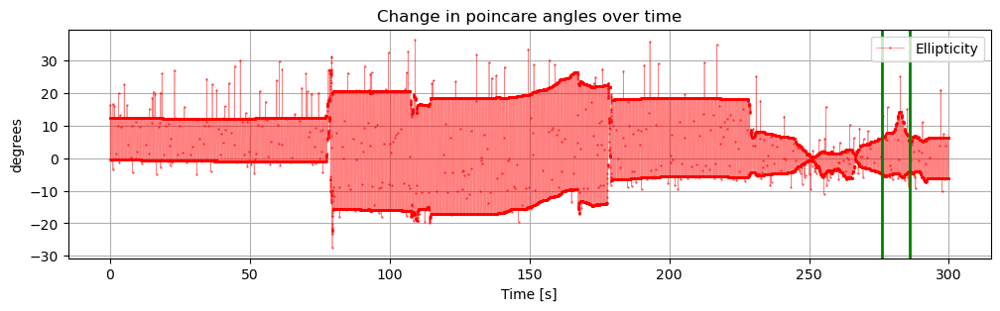

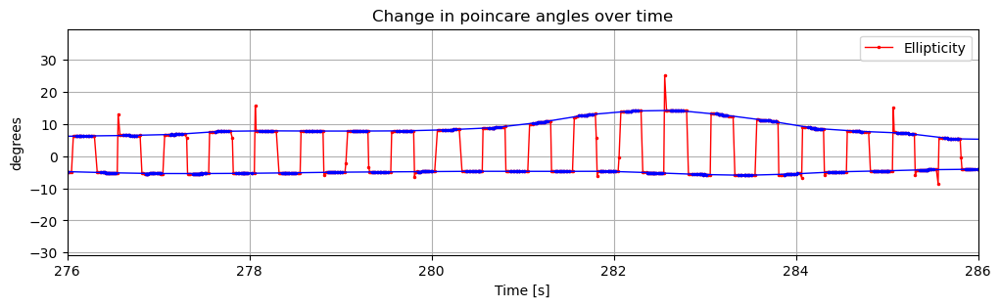

In [165]:
ds.plot(sample_range=(26,30),plot_param='Azimuth',plot_switch=True,plot_jumps=True,plot_valid=True,plot_avg=False)
ds.plot(sample_range=(150,165),plot_param='Azimuth',plot_switch=False,plot_jumps=False,plot_valid=True,plot_avg=True)
ds.plot(sample_range=(150,165),plot_param='Ellipticity',plot_switch=False,plot_jumps=False,plot_valid=True,plot_avg=True)
ds.plot(sample_range=(250,256),plot_param='Ellipticity',plot_switch=False,plot_jumps=False,plot_valid=True,plot_avg=True)
ds.plot(sample_range=(276,286),plot_param='Ellipticity',plot_switch=False,plot_jumps=False,plot_valid=True,plot_avg=True)

In [176]:
avg_df_arr[0].loc[150:170]

,StartTime,EndTime,AvgTime,Length,NumPoints,AvgSampleRate,AzimuthAvg,AzimuthStd,EllipticityAvg,EllipticityStd
150,75.101,75.252,75.173643,0.151,14,92.715232,-80.052857,0.008254,12.410714,0.002673
151,75.622,75.783,75.716231,0.161,13,80.745342,-80.053077,0.008549,12.410769,0.002774
152,76.140,76.281,76.214308,0.141,13,92.198582,-80.055385,0.007763,12.416154,0.005064
153,76.621,76.762,76.696400,0.141,10,70.921986,-80.055000,0.005270,12.419000,0.003162
154,77.124,77.264,77.203000,0.140,10,71.428571,-81.139000,0.372065,13.003000,0.174868
155,77.646,77.776,77.717111,0.130,9,69.230769,-82.076667,0.381182,16.153333,0.115109
156,78.107,78.258,78.186000,0.151,12,79.470199,-78.219167,0.410154,17.755833,0.079825
157,78.619,78.760,78.691900,0.141,10,70.921986,52.478000,8.414404,23.184000,2.889768
158,79.121,79.251,79.194750,0.130,8,61.538462,19.028750,6.490750,28.115000,2.164994
159,79.602,79.752,79.679273,0.150,11,73.333333,63.142727,0.439888,20.328182,0.248669


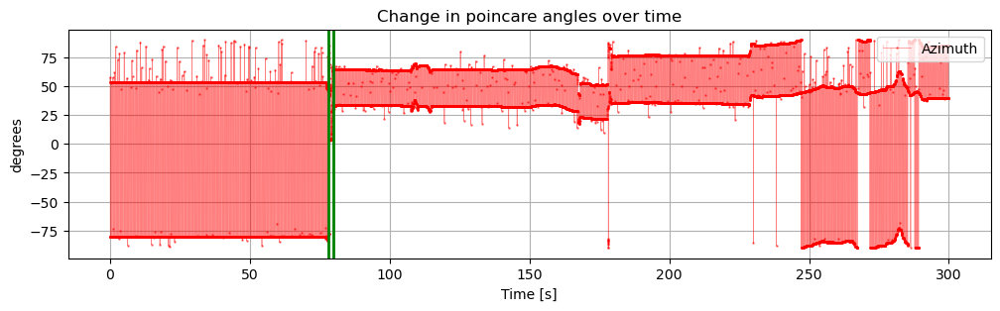

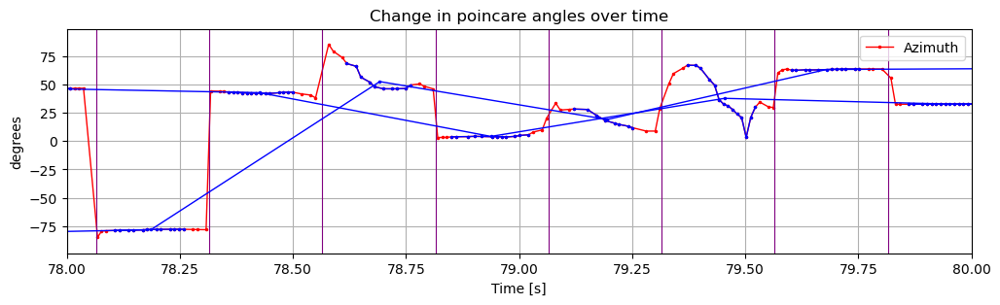

In [172]:
ds.plot(sample_range=(78,80),plot_param='Azimuth',plot_switch=True,plot_jumps=False,plot_valid=True,plot_avg=True)

updating CP_fig


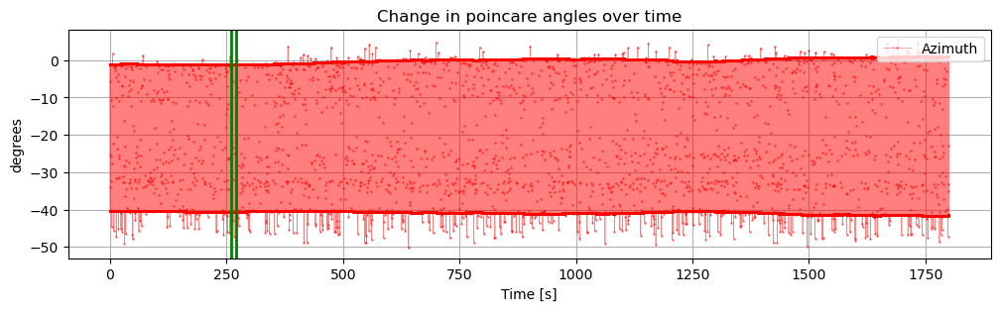

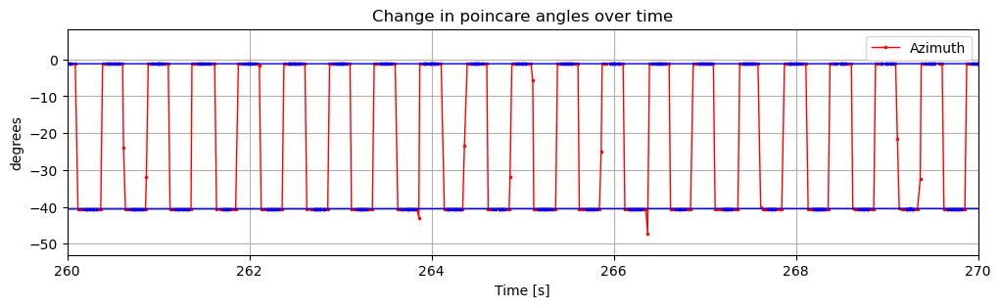

In [60]:
sample_range = (260,270)
#times = ds.df.nlargest(5, 'TimeDiff')['TimeElapsed']   # Timestamps of largest 5 time diffs
#sample_offset = times.iloc[0]-(sample_length/2)
ds.plot(sample_range=sample_range,plot_param='Azimuth',plot_switch=False,plot_jumps=False,plot_avg=True)

### Unstable dataset (switching)

Time range: min=20.014, max=1800.004


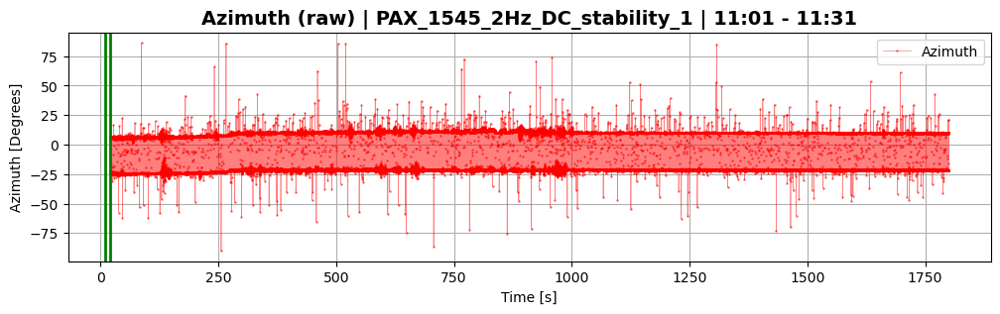

KeyError: nan

In [60]:
plt.ioff()
plt.close('all')
filename = 'Datasets/Whole_setup/08-01/PAX_1545_2Hz_DC_stability_1.csv'
#ds = datasets[0]
ds = SwitchSet(filename)
ds.plot_raw(sample_range=(10,20),plot_param='Azimuth')

degree_tolerance = 3.0
first_tolerance = 1.0
second_tolerance = 0.5

jump_fig for: switch parameter = Azimuth



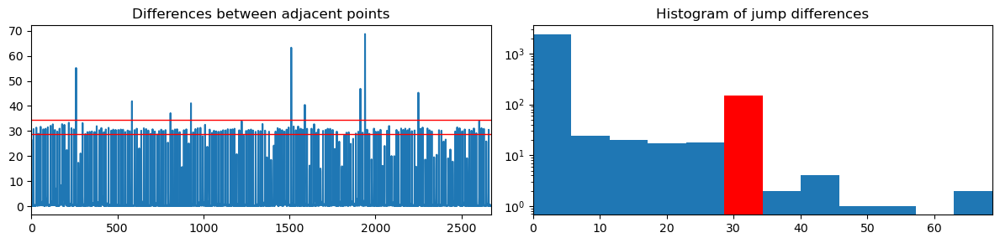



Error in Second Tolerance: difference=0.25 < tolerance=0.50
Likely cause: FPCs moved during setup OR high variability in dataset
jump_fig for: switch parameter = Ellipticity



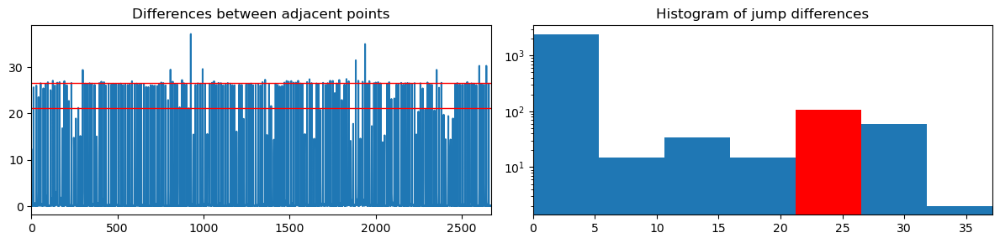



switch parameter = Azimuth

Jump points detected: 152
out of total: ~200.0



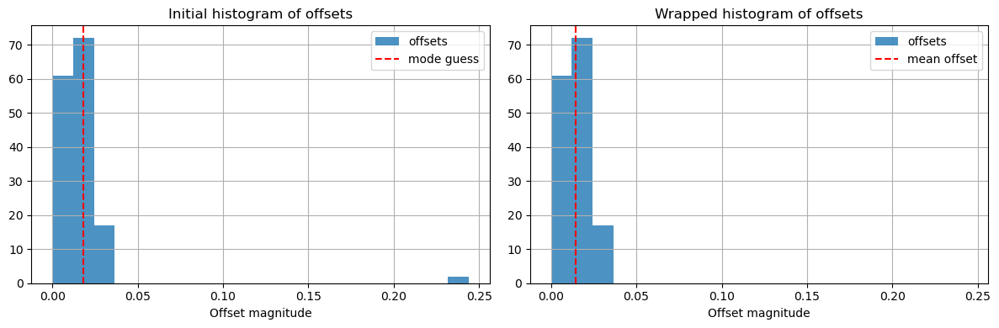

In [127]:
nominal_switch_rate = 2   # 2 Hz
change_point_range = (10,60)
ds.change_point(nominal_switch_rate, change_point_range, n_exclude=3, print_process=False)
avg_df_arr = ds.average_data()

updating CP_fig


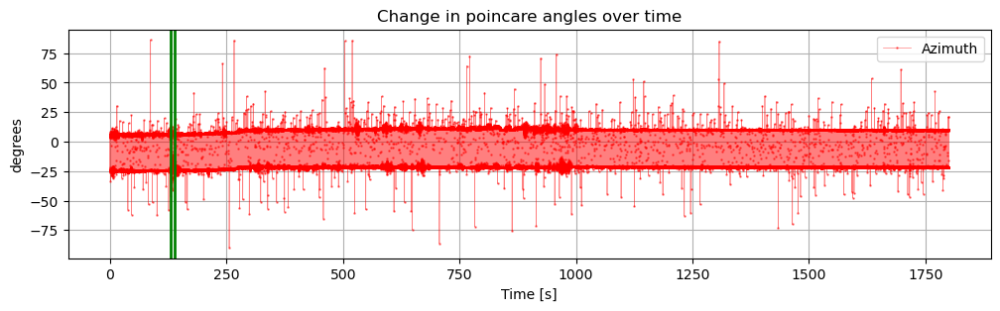

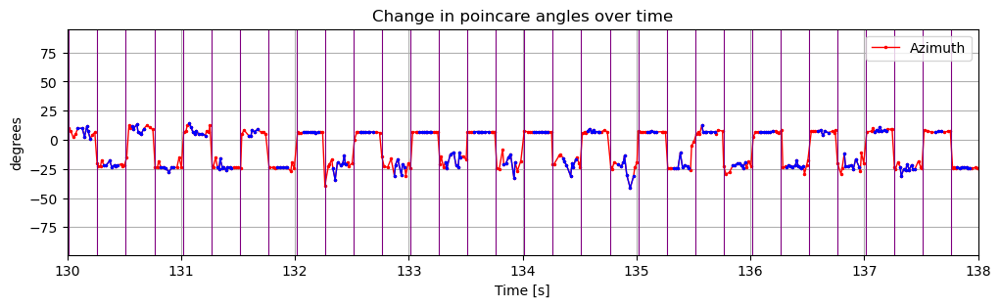

updating NCP_fig
updating CP_fig


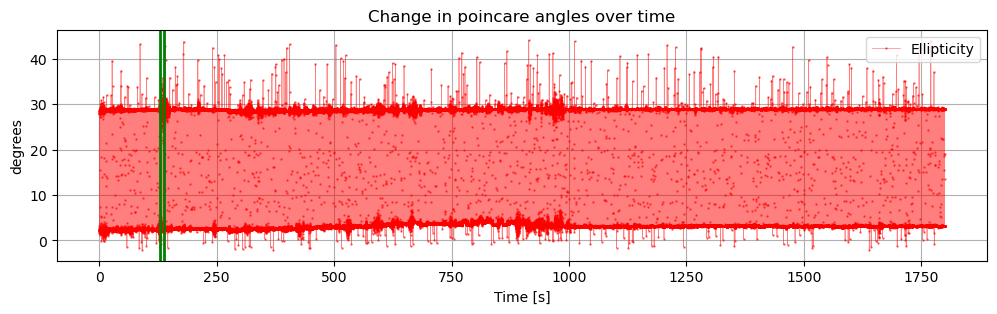

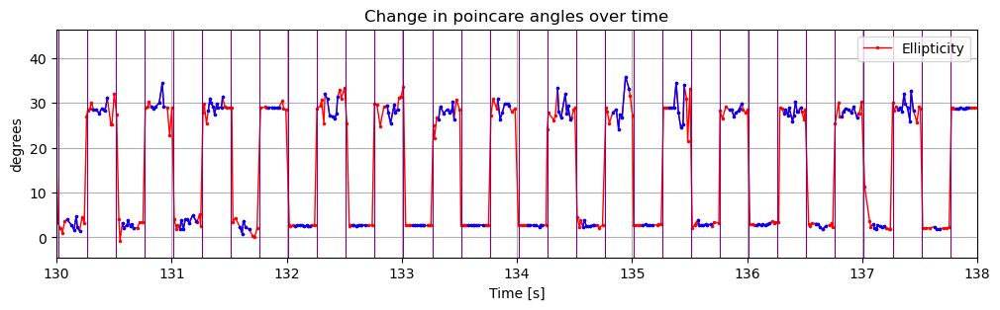

In [128]:
ds.plot(sample_range=(130,138),plot_param='Azimuth',plot_switch=True,plot_jumps=False,plot_valid=True,plot_avg=False)
ds.plot(sample_range=(130,138),plot_param='Ellipticity',plot_switch=True,plot_jumps=False,plot_valid=True,plot_avg=False)

### Slowly varying dataset (switching)

In [61]:
plt.ioff()
plt.close('all')

In [62]:
filename = 'Datasets/Whole_setup/08-01/PAX_1345_2Hz_DC_stability_1.csv'
ds = SwitchSet(filename)

Time range: min=20.025, max=1800.018


In [66]:
nominal_switch_time = 2   # 2 Hz
change_point_range = (10,60)
ds.change_point(nominal_switch_time=nominal_switch_time, change_point_range=change_point_range, n_exclude=3, print_process=False)
ds.average_data()

TypeError: SwitchSet.change_point() missing 1 required positional argument: 'main_df'

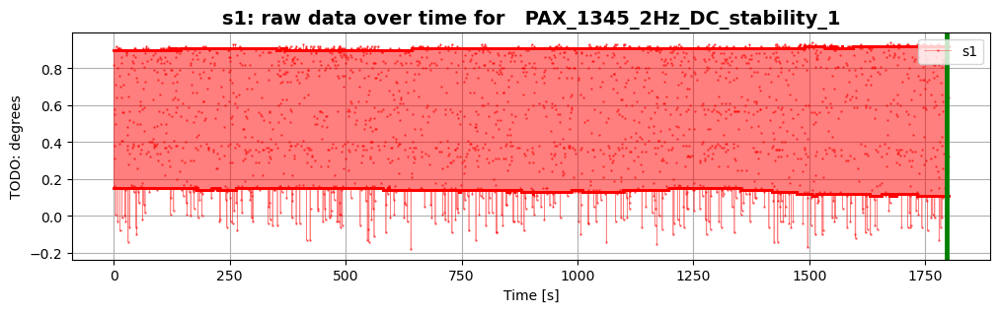

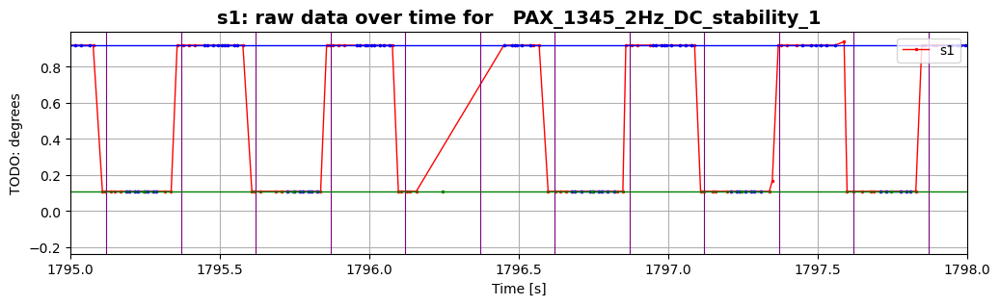

In [33]:
ds.plot_raw(sample_range=(1795,1798),plot_param='s1',plot_avg=True,plot_switch=True,plot_valid=True)

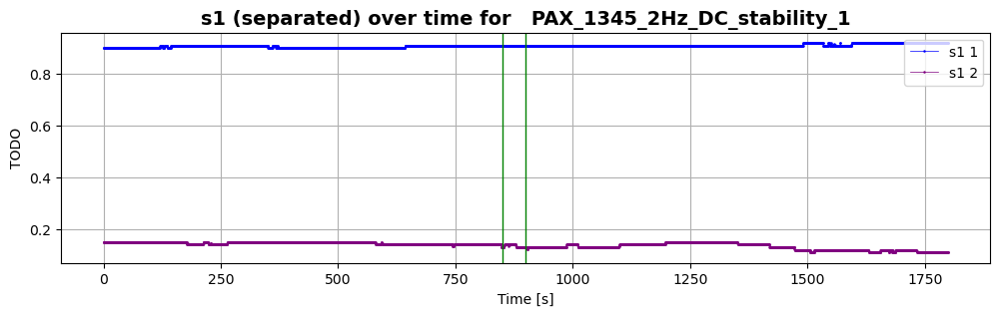

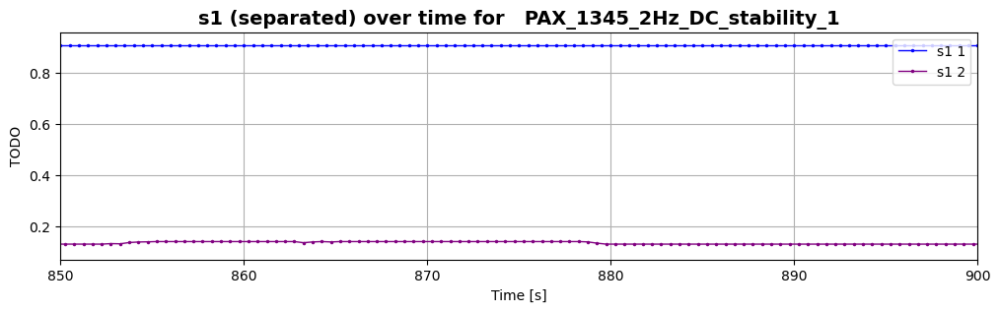

In [55]:
ds.plot_separated(sample_range=(850,900),plot_param='s1')

### Manually varying dataset (switching)

In [63]:
plt.ioff()
plt.close('all')

Time range: min=14.001, max=603.946
Using change_point_range_1=(15, 50)
Using change_point_range_2=None
=== performing change point detection ===
cp range: (15.0, 50.0)
using 2034 data entries
skipping 57 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (2034,)
computing range... ---> range = (0.89,0.95)
displaying jump_fig for switch parameter = s1



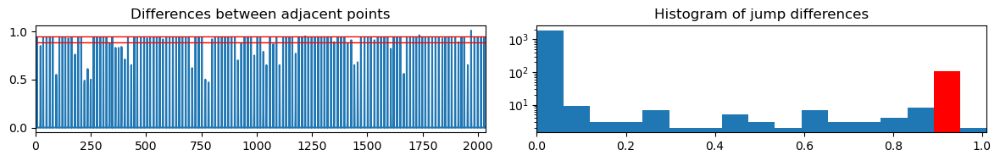



found width of 0.059 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (2034,)
computing range... ---> range = (0.99,1.05)
displaying jump_fig for switch parameter = s2



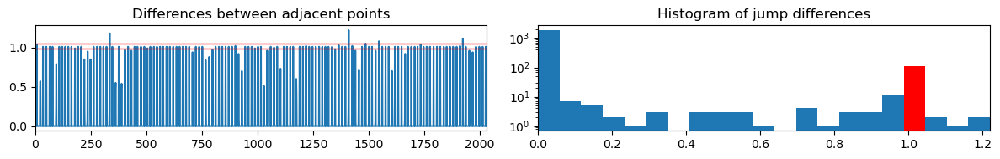



--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (2034,)
computing range... ---> range = (0.30,0.36)
displaying jump_fig for switch parameter = s3



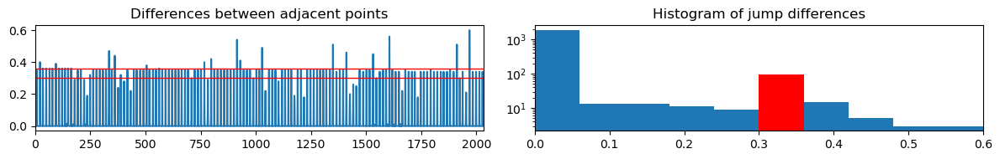



found width of 0.060 for s3
greater than prev width of 0.059 for s1
--- end of switch param: s3 ---

---> switch parameter found: s3 <---
finding differences within range = (0.30,0.36)
Jump points detected: 107
out of total: ~139.9

computing offset...


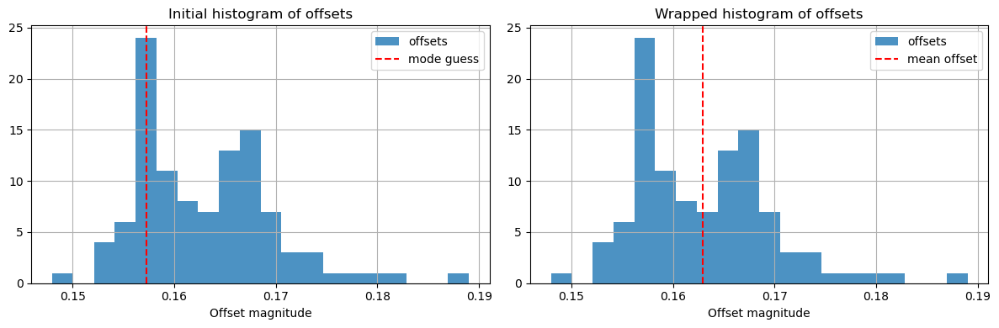



offset = 0.163 seconds
=== end change point detection ===


In [69]:
filename = 'Datasets/Whole_setup/11-15/PAX_11-15_Manual_Orth_1345_desktop.csv'
ds = SwitchSet(filename, skip_default_signal_baseline=14)
ds.find_switches(nominal_switch_rate=2, change_point_range_1=(15,50), print_process=True)

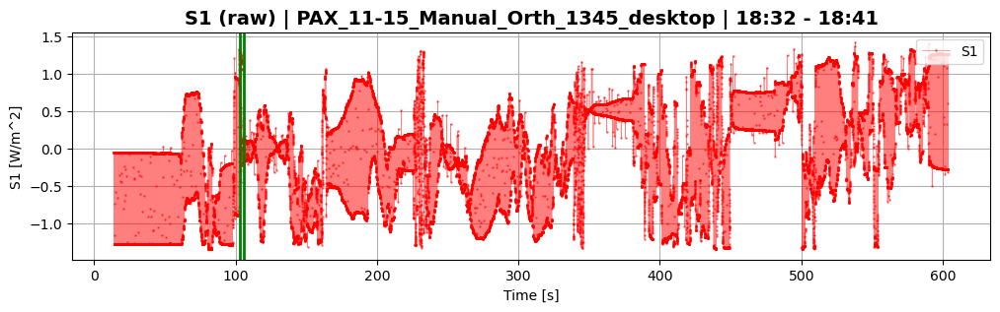

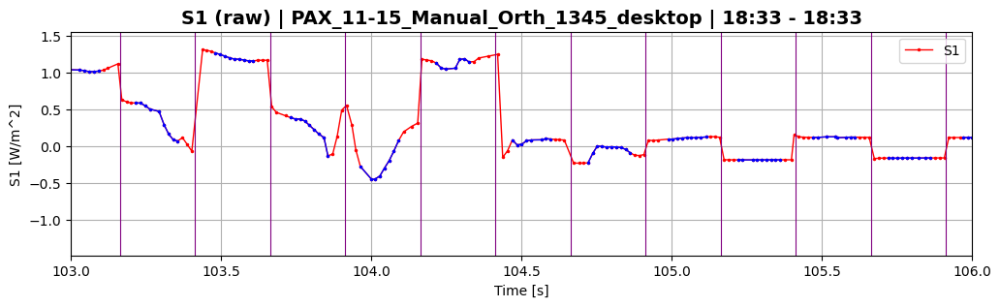

In [70]:
ds.plot_raw(plot_param='S1', sample_range=(103,106),plot_switch=True,plot_jumps=True,plot_valid=True,plot_avg=True)

In [71]:
ds.average_data(print_process=True)

=== starting average_data ===
averaging data... Done
Dropped 10 observations with <4 points (out of total 2356 observations)

--- interpolating data ---
length before: 1171
length after: 1179
8 total added
--- end interpolating data ---

--- interpolating data ---
length before: 1175
length after: 1179
4 total added
--- end interpolating data ---
Signal 1 size=1179	Signal 1 range: t=(14.29,603.29)
Signal 2 size=1179	Signal 2 range: t=(14.54,603.54)
=== end average_data ===


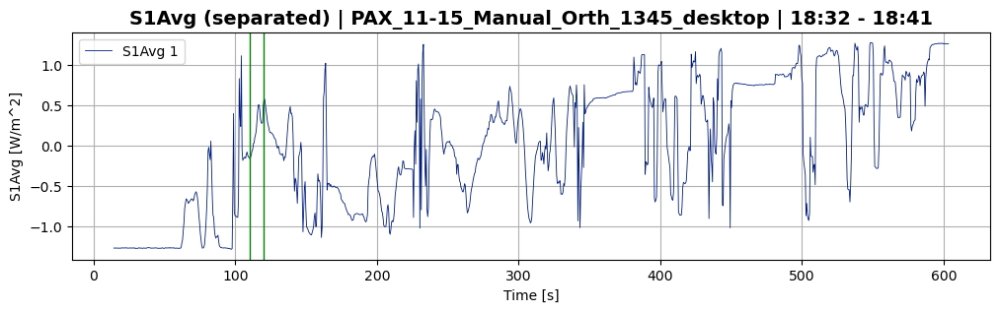

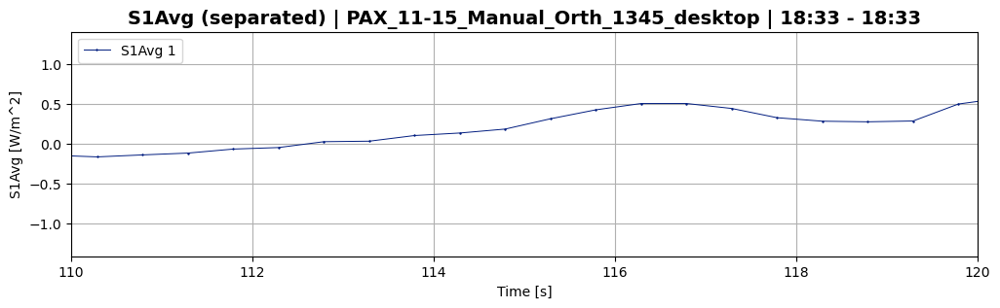

In [72]:
ds.plot_separated(plot_param='S1Avg',plot_signal=1,sample_range=(110,120))

In [73]:
ds.calc_stokes_ptf(input_stokes=None, angle_threshold_deg=np.deg2rad(10))

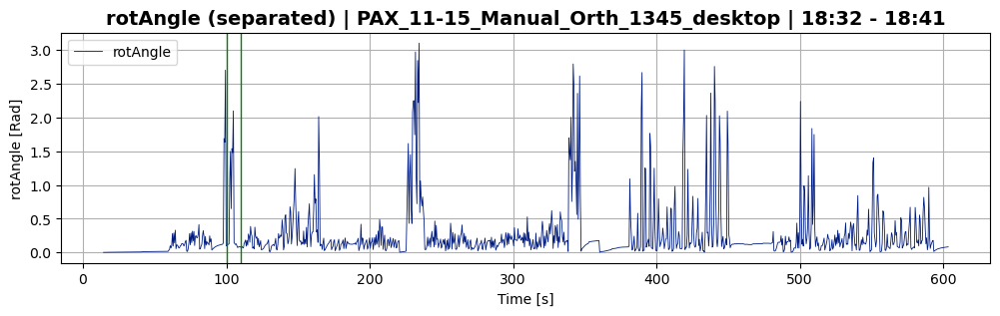

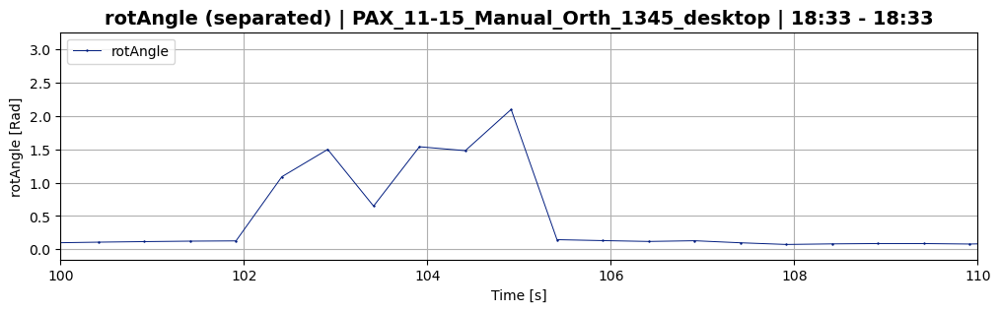

In [75]:
ds.plot_separated(plot_param='rotAngle',plot_signal=1,sample_range=(100,110))

### Adev (stationary)

#### Init

===== Datasets =====
0: PAX_08-16_30m_ADev_1_1345
1: PAX_08-16_30m_ADev_1_1560
2: PAX_08-16_30m_ADev_2_1345
3: PAX_08-16_30m_ADev_2_1560
4: PAX_08-16_30m_ADev_3_1345
5: PAX_08-16_30m_ADev_3_1560
6: PAX_08-16_ARL_ADev_1_1345
7: PAX_08-16_ARL_ADev_1_1560
8: PAX_08-16_ARL_ADev_2_1345
9: PAX_08-16_ARL_ADev_2_1560
10: PAX_08-16_DC_ADev_1_1345
11: PAX_08-16_DC_ADev_1_1560
12: PAX_08-16_DC_ADev_2_1345
13: PAX_08-16_DC_ADev_2_1560


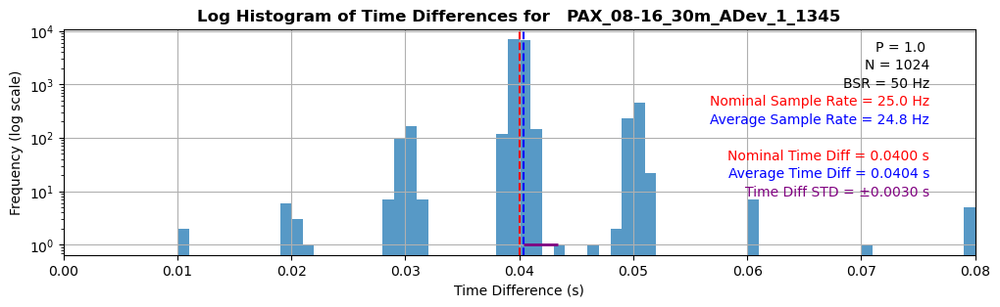

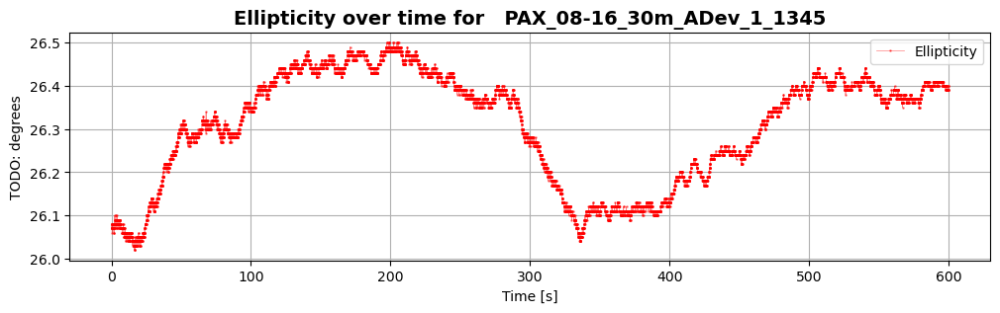

KeyboardInterrupt: 

In [73]:
folder_path = 'Datasets/Whole_setup/08-16'
datasets = []
i=0
print(BOLD_ON + '===== Datasets =====' + BOLD_OFF)
for file_name in os.listdir(folder_path):
    if file_name.endswith('.csv'):
        file_path = os.path.join(folder_path, file_name)
        #display(file_path)
        ds = StationarySet(file_path)
        datasets.append(ds)
        print('{:d}: {:s}'.format(i, ds.title))
        i+=1
print(BOLD_ON + '========================' + BOLD_OFF)
for ds in datasets:
    ds.rate_hist(bins=80, xmax=0.08)
    ds.plot(plot_param='Ellipticity')

#### rate hist bad even when slow

       TimeElapsed  TimeDiff
0            0.000     0.000
1            0.010     0.010
25           0.961     0.010
8655       348.256     0.019
6048       243.014     0.020
8616       346.695     0.020
9043       363.850     0.020
13294      536.359     0.020
14           0.511     0.020
11           0.391     0.020


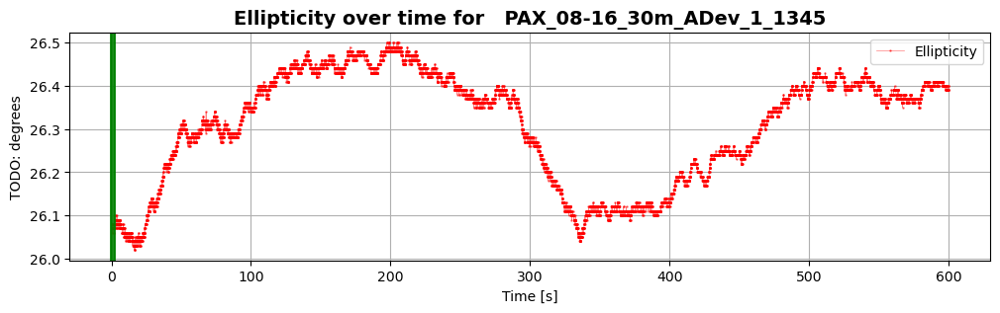

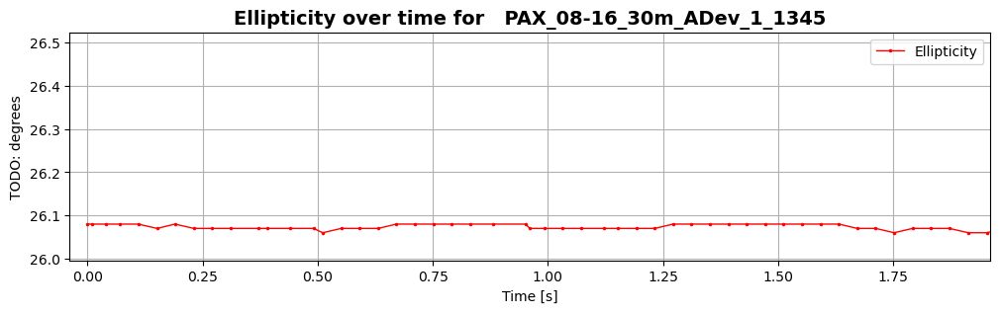

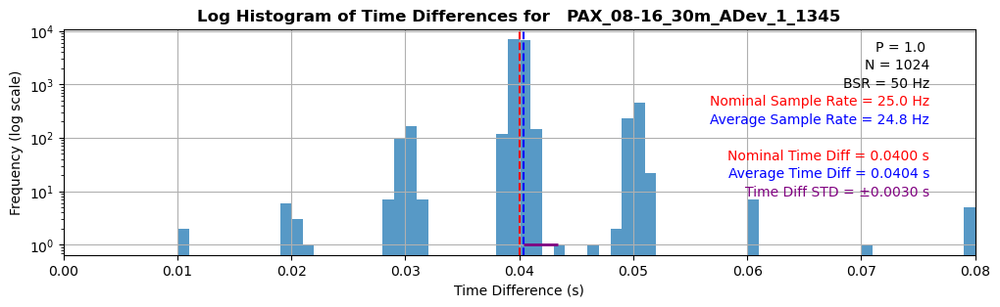

In [72]:
# Just looking at one of the datasets
filename = 'Datasets/Whole_setup/08-16/PAX_08-16_30m_ADev_1_1345.csv'
ds = StationarySet(filename)

times = ds.df.nlargest(10, 'TimeDiff')   # Timestamps and values of largest spacings
times = ds.df.nsmallest(10, 'TimeDiff')   # Timestamps and values of smallest spacings
print(times[['TimeElapsed','TimeDiff']])
sample_length = 2
sample_offset = times['TimeElapsed'].iloc[2]-(sample_length/2)
sample_range = (sample_offset, sample_offset+sample_length)
#sample_range = (100,105)

ds.plot(sample_range=sample_range,plot_param='Ellipticity')
ds.rate_hist(bins=80,xmax=0.08)

#### ADEV: stationary DC 8-16

===== Datasets =====
Time range: min=0.111, max=599.997
0 | PAX_08-16_DC_ADev_1_1345 | bsr = 400.00 | nom rate = 200.00 | avg rate = 71.11
Number of taus used: 2257
Time range: min=0.086, max=533.205
1 | PAX_08-16_DC_ADev_1_1560 | bsr = 400.00 | nom rate = 200.00 | avg rate = 55.24
Number of taus used: 2142
Time range: min=0.061, max=600.0
2 | PAX_08-16_DC_ADev_2_1345 | bsr = 400.00 | nom rate = 200.00 | avg rate = 70.60
Number of taus used: 2255
Time range: min=0.049, max=600.007
3 | PAX_08-16_DC_ADev_2_1560 | bsr = 200.00 | nom rate = 100.00 | avg rate = 63.44
Number of taus used: 2223


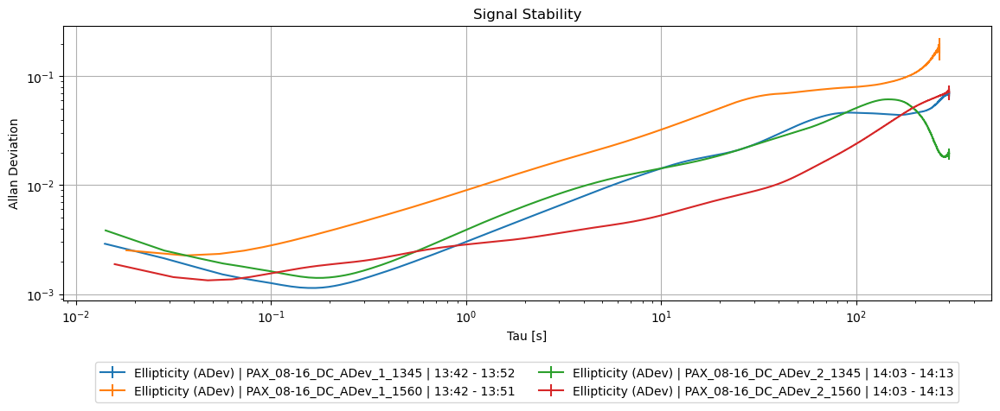

In [109]:
# Allan Dev for 08-16 runs
folder_path='Datasets/Whole_setup/08-16'
datasets = []; params_arr = []; i=0
print(BOLD_ON + '===== Datasets =====' + BOLD_OFF)
for file_name in os.listdir(folder_path):
    if file_name.endswith('.csv') and 'DC' in file_name:
        file_path = os.path.join(folder_path, file_name)
        ds = StationarySet(file_path)
        datasets.append(ds)
        print('{:d} | {:s} | bsr = {:.2f} | nom rate = {:.2f} | avg rate = {:.2f}'.format(i,ds.title,ds.basic_sample_rate,ds.nominal_sample_rate,ds.avg_sample_rate))
        arr = ds.adev(plot_param='Ellipticity',num_taus=5000)
        params_arr.append(arr)
        i+=1
print(BOLD_ON + '========================' + BOLD_OFF)
StationarySet.plot_adev(params_arr)

#### ADEV: stationary 30m 8-16

===== Datasets =====
0 | PAX_08-16_30m_ADev_1_1345 | bsr = 50.00 | nom rate = 25.00 | avg rate = 24.77
1 | PAX_08-16_30m_ADev_1_1560 | bsr = 50.00 | nom rate = 25.00 | avg rate = 25.60
2 | PAX_08-16_30m_ADev_2_1345 | bsr = 400.00 | nom rate = 200.00 | avg rate = 70.64
3 | PAX_08-16_30m_ADev_2_1560 | bsr = 400.00 | nom rate = 200.00 | avg rate = 54.85
4 | PAX_08-16_30m_ADev_3_1345 | bsr = 400.00 | nom rate = 100.00 | avg rate = 84.94
5 | PAX_08-16_30m_ADev_3_1560 | bsr = 400.00 | nom rate = 100.00 | avg rate = 59.33


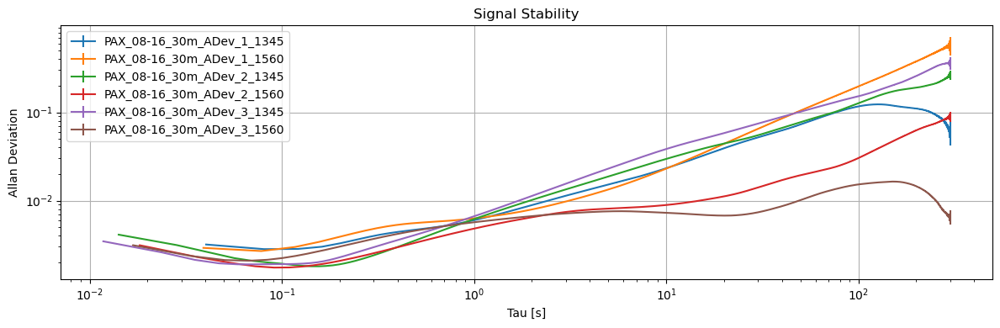

In [7]:
# Allan Dev for 08-16 runs
folder_path='Datasets/Whole_setup/08-16'
int_path='Datasets/Whole_setup/08-16'
datasets = []; params_arr = []; i=0
print(BOLD_ON + '===== Datasets =====' + BOLD_OFF)
for file_name in os.listdir(folder_path):
    if file_name.endswith('.csv') and '30m' in file_name:
        file_path = os.path.join(folder_path, file_name)
        ds = StationarySet(file_path)
        datasets.append(ds)
        print('{:d} | {:s} | bsr = {:.2f} | nom rate = {:.2f} | avg rate = {:.2f}'.format(i,ds.title,ds.basic_sample_rate,ds.nominal_sample_rate,ds.avg_sample_rate))
        taus2,ad,ade,ns = ds.adev(plot_param='Ellipticity',num_taus=5000)
        label = ds.title
        params_arr.append((taus2,ad,ade,ns,label))
        i+=1
print(BOLD_ON + '========================' + BOLD_OFF)
StationarySet.plot_adev(params_arr)

#### ADEV: stationary ARL 8-16

===== Datasets =====
0 | PAX_08-16_ARL_ADev_1_1345 | bsr = 400.00 | nom rate = 200.00 | avg rate = 33.37
1 | PAX_08-16_ARL_ADev_1_1560 | bsr = 200.00 | nom rate = 100.00 | avg rate = 63.42
2 | PAX_08-16_ARL_ADev_2_1345 | bsr = 400.00 | nom rate = 100.00 | avg rate = 85.05
3 | PAX_08-16_ARL_ADev_2_1560 | bsr = 400.00 | nom rate = 100.00 | avg rate = 59.59


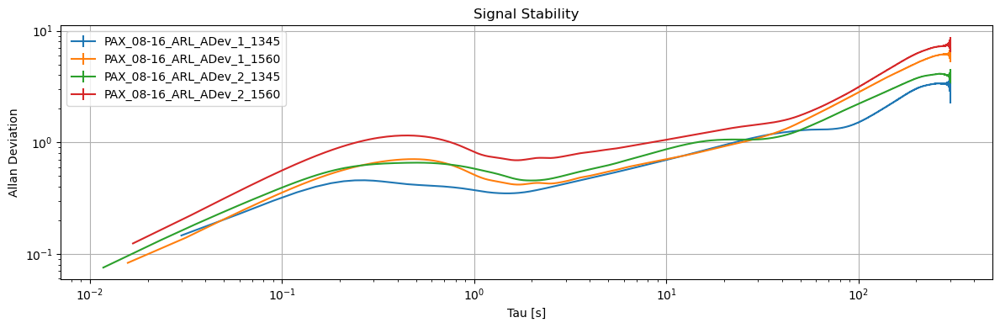

In [254]:
folder_path='Datasets/Whole_setup/New_WDM/Stationary/08-16'
datasets = []; params_arr = []; i=0
print(BOLD_ON + '===== Datasets =====' + BOLD_OFF)
for file_name in os.listdir(folder_path):
    if file_name.endswith('.csv') and 'ARL' in file_name:
        file_path = os.path.join(folder_path, file_name)
        ds = StationarySet(file_path)
        datasets.append(ds)
        print('{:d} | {:s} | bsr = {:.2f} | nom rate = {:.2f} | avg rate = {:.2f}'.format(i,ds.title,ds.basic_sample_rate,ds.nominal_sample_rate,ds.avg_sample_rate))
        taus2,ad,ade,ns = ds.adev(plot_param='Ellipticity',num_taus=5000)
        label = ds.title
        params_arr.append((taus2,ad,ade,ns,label))
        i+=1
print(BOLD_ON + '========================' + BOLD_OFF)
StationarySet.plot_adev(params_arr)

#### ADEV: Samples of DC, Connector, ARL

0 | PAX_08-16_ARL_ADev_1_1345 | bsr = 400.00 | nom rate = 200.00 | avg rate = 33.37
1 | PAX_08-16_ARL_ADev_2_1345 | bsr = 400.00 | nom rate = 100.00 | avg rate = 85.05
2 | PAX_08-16_30m_ADev_2_1345 | bsr = 400.00 | nom rate = 200.00 | avg rate = 70.64
3 | PAX_08-16_30m_ADev_3_1345 | bsr = 400.00 | nom rate = 100.00 | avg rate = 84.94
4 | PAX_08-16_DC_ADev_1_1345 | bsr = 400.00 | nom rate = 200.00 | avg rate = 71.11
5 | PAX_08-16_DC_ADev_2_1345 | bsr = 400.00 | nom rate = 200.00 | avg rate = 70.60


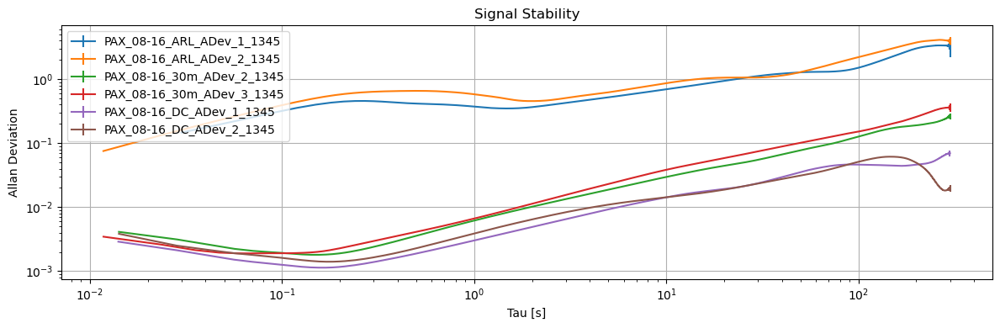

In [16]:
paths_2 = ['Datasets/Whole_setup/08-16/PAX_08-16_ARL_ADev_1_1345.csv',
           'Datasets/Whole_setup/08-16/PAX_08-16_ARL_ADev_2_1345.csv',
           'Datasets/Whole_setup/08-16/PAX_08-16_30m_ADev_2_1345.csv',
           'Datasets/Whole_setup/08-16/PAX_08-16_30m_ADev_3_1345.csv',
           'Datasets/Whole_setup/08-16/PAX_08-16_DC_ADev_1_1345.csv',
           'Datasets/Whole_setup/08-16/PAX_08-16_DC_ADev_2_1345.csv']
datasets = []; params_arr = []; i=0
for file_path in paths_2:
    ds = StationarySet(file_path)
    datasets.append(ds)
    print('{:d} | {:s} | bsr = {:.2f} | nom rate = {:.2f} | avg rate = {:.2f}'.format(i,ds.title,ds.basic_sample_rate,ds.nominal_sample_rate,ds.avg_sample_rate))
    taus2,ad,ade,ns = ds.adev(plot_param='Ellipticity',num_taus=5000)
    label = ds.title
    params_arr.append((taus2,ad,ade,ns,label))
    i += 1
StationarySet.plot_adev(params_arr)

#### ADEV: stationary ARL 8-15

===== Datasets =====
0 | PAX_08-15_ARL_ADev_1_1345 | bsr = 400.00 | nom rate = 200.00 | avg rate = 71.22
1 | PAX_08-15_ARL_ADev_1_1560 | bsr = 400.00 | nom rate = 200.00 | avg rate = 57.12
2 | PAX_08-15_ARL_ADev_2_1345 | bsr = 400.00 | nom rate = 100.00 | avg rate = 84.76
3 | PAX_08-15_ARL_ADev_2_1560 | bsr = 400.00 | nom rate = 100.00 | avg rate = 60.09
4 | PAX_08-15_ARL_ADev_3_1345 | bsr = 400.00 | nom rate = 100.00 | avg rate = 41.62
5 | PAX_08-15_ARL_ADev_3_1560 | bsr = 400.00 | nom rate = 100.00 | avg rate = 37.66


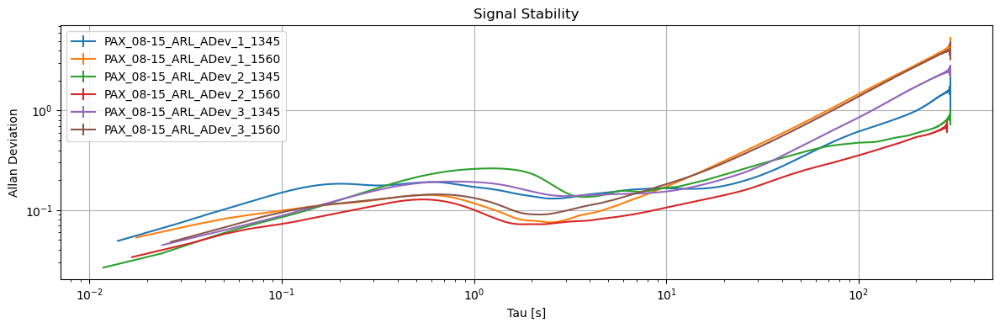

In [255]:
folder_path='Datasets/Whole_setup/New_WDM/Stationary/08-15'
datasets = []; params_arr = []; i=0
print(BOLD_ON + '===== Datasets =====' + BOLD_OFF)
for file_name in os.listdir(folder_path):
    if file_name.endswith('.csv') and 'ARL' in file_name:
        file_path = os.path.join(folder_path, file_name)
        ds = StationarySet(file_path)
        datasets.append(ds)
        print('{:d} | {:s} | bsr = {:.2f} | nom rate = {:.2f} | avg rate = {:.2f}'.format(i,ds.title,ds.basic_sample_rate,ds.nominal_sample_rate,ds.avg_sample_rate))
        taus2,ad,ade,ns = ds.adev(plot_param='Ellipticity',num_taus=5000)
        label = ds.title
        params_arr.append((taus2,ad,ade,ns,label))
        i+=1
print(BOLD_ON + '========================' + BOLD_OFF)
StationarySet.plot_adev(params_arr)

#### ADEV: stationary ARL Long

In [9]:
filepath_ARL_long='Datasets/Whole_setup/09-07_09-12/PAX_09-07_ARL_ADEV_2_1560.csv'
ds_ARL_long = StationarySet(filepath_ARL_long,set_range=(600,-600))

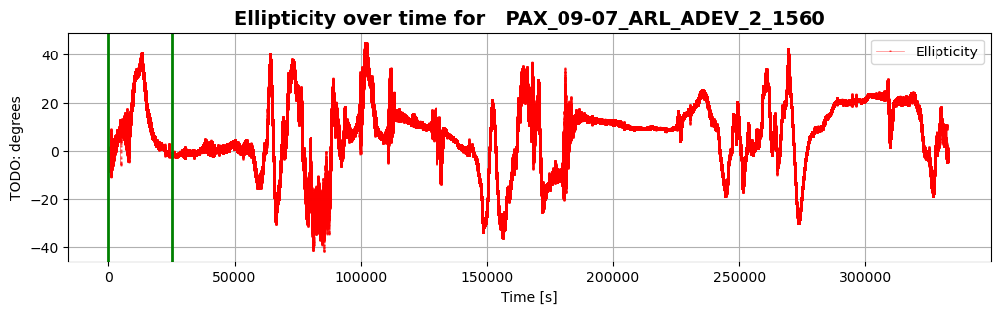

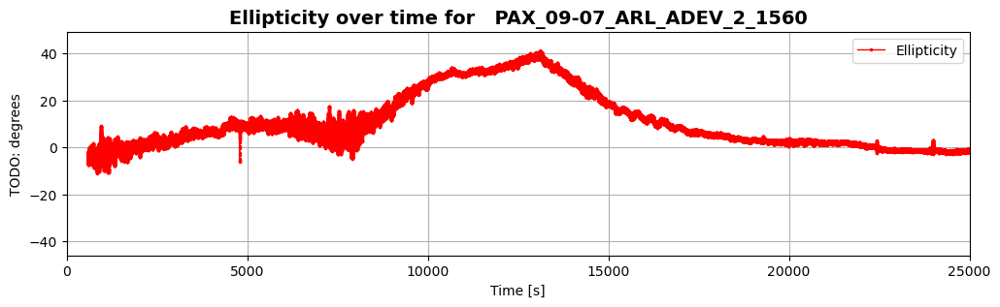

In [10]:
ds_ARL_long.plot_raw(sample_range=(0,25000),plot_param='Ellipticity')

In [211]:
filenames=['Datasets/Whole_setup/09-07_09-12/PAX_09-07_ARL_ADEV_2_1560.csv',
          'Datasets/Whole_setup/09-07_09-12/PAX_09-11_ARL_ADEV_2_1560_desktop.csv',
          'Datasets/Whole_setup/09-07_09-12/PAX_09-12_ARL_ADEV_1_1560_desktop.csv']
ranges=[[(None,0.1),(0.1,0.2),(0.2,0.3),(0.3,0.4),(0.4,0.5),(0.5,0.6),(0.6,0.7),(0.7,0.8),(0.8,0.9),(0.9,None)],
       [(None,0.25),(0.25,0.5),(0.5,0.75),(0.75,None)],
       [(None,0.25),(0.25,0.5),(0.5,0.75),(0.75,None)]]

In [201]:
filenames=['Datasets/Whole_setup/08-16/PAX_08-16_ARL_ADev_2_1345.csv',
          'Datasets/Whole_setup/08-16/PAX_08-16_ARL_ADev_2_1560.csv']
ranges=[[(None,0.1),(0.1,0.2),(0.2,0.3),(0.3,0.4),(0.4,0.5),(0.5,0.6),(0.6,0.7),(0.7,0.8),(0.8,0.9),(0.9,None)],
       [(None,0.25),(0.25,0.5),(0.5,0.75),(0.75,None)]]

In [212]:
start_time_total = time.time()
datasets = []; i=0
print(BOLD_ON + '===== Datasets =====' + BOLD_OFF)
for filename,range_list in zip(filenames,ranges):
    for set_range in range_list:
        start_time = time.time()
        ds = StationarySet(filename,set_range=set_range)
        end_time = time.time()
        datasets.append(ds)
        print('{:d} | {:s} | range = {} | elapsed time = {:.2f} minutes | avg rate = {:.2f}'.format(i,ds.title,set_range,(end_time-start_time)/60,ds.avg_sample_rate))
        i+=1
print(BOLD_ON + '========================' + BOLD_OFF)
end_time_total = time.time()
print("Elapsed time: {:.2f} minutes".format((end_time_total-start_time_total)/60))

===== Datasets =====
0 | PAX_09-07_ARL_ADEV_2_1560 | range = (None, 0.1) | elapsed time = 0.64 minutes | avg rate = 65.70
1 | PAX_09-07_ARL_ADEV_2_1560 | range = (0.1, 0.2) | elapsed time = 0.64 minutes | avg rate = 65.29
2 | PAX_09-07_ARL_ADEV_2_1560 | range = (0.2, 0.3) | elapsed time = 0.67 minutes | avg rate = 64.63
3 | PAX_09-07_ARL_ADEV_2_1560 | range = (0.3, 0.4) | elapsed time = 0.73 minutes | avg rate = 63.74
4 | PAX_09-07_ARL_ADEV_2_1560 | range = (0.4, 0.5) | elapsed time = 0.75 minutes | avg rate = 62.80
5 | PAX_09-07_ARL_ADEV_2_1560 | range = (0.5, 0.6) | elapsed time = 0.79 minutes | avg rate = 61.40
6 | PAX_09-07_ARL_ADEV_2_1560 | range = (0.6, 0.7) | elapsed time = 0.76 minutes | avg rate = 60.32
7 | PAX_09-07_ARL_ADEV_2_1560 | range = (0.7, 0.8) | elapsed time = 0.76 minutes | avg rate = 59.15
8 | PAX_09-07_ARL_ADEV_2_1560 | range = (0.8, 0.9) | elapsed time = 0.81 minutes | avg rate = 46.51
9 | PAX_09-07_ARL_ADEV_2_1560 | range = (0.9, None) | elapsed time = 0.85 minu

In [213]:
start_time_total = time.time()
params_arr = []; i=0
print(BOLD_ON + '===== Datasets =====' + BOLD_OFF)
for ds in datasets:
    start_time = time.time()
    taus2,ad,ade,ns = ds.adev(plot_param='Ellipticity',num_taus=5000)
    end_time = time.time()
    label = ds.title
    params_arr.append((taus2,ad,ade,ns,label))
    print('{:d} | {:s} | elapsed time = {:.2f} minutes'.format(i,ds.title,(end_time-start_time)/60))
    i+=1
print(BOLD_ON + '========================' + BOLD_OFF)
end_time_total = time.time()
print("Elapsed time: {:.2f} minutes".format((end_time_total-start_time_total)/60))

===== Datasets =====
0 | PAX_09-07_ARL_ADEV_2_1560 | elapsed time = 0.88 minutes
1 | PAX_09-07_ARL_ADEV_2_1560 | elapsed time = 0.91 minutes
2 | PAX_09-07_ARL_ADEV_2_1560 | elapsed time = 0.90 minutes
3 | PAX_09-07_ARL_ADEV_2_1560 | elapsed time = 0.90 minutes
4 | PAX_09-07_ARL_ADEV_2_1560 | elapsed time = 0.89 minutes
5 | PAX_09-07_ARL_ADEV_2_1560 | elapsed time = 0.90 minutes
6 | PAX_09-07_ARL_ADEV_2_1560 | elapsed time = 0.90 minutes
7 | PAX_09-07_ARL_ADEV_2_1560 | elapsed time = 0.89 minutes
8 | PAX_09-07_ARL_ADEV_2_1560 | elapsed time = 0.89 minutes
9 | PAX_09-07_ARL_ADEV_2_1560 | elapsed time = 0.91 minutes
10 | PAX_09-11_ARL_ADEV_2_1560_desktop | elapsed time = 0.94 minutes
11 | PAX_09-11_ARL_ADEV_2_1560_desktop | elapsed time = 0.92 minutes
12 | PAX_09-11_ARL_ADEV_2_1560_desktop | elapsed time = 0.93 minutes
13 | PAX_09-11_ARL_ADEV_2_1560_desktop | elapsed time = 0.92 minutes
14 | PAX_09-12_ARL_ADEV_1_1560_desktop | elapsed time = 0.82 minutes
15 | PAX_09-12_ARL_ADEV_1_1560_des

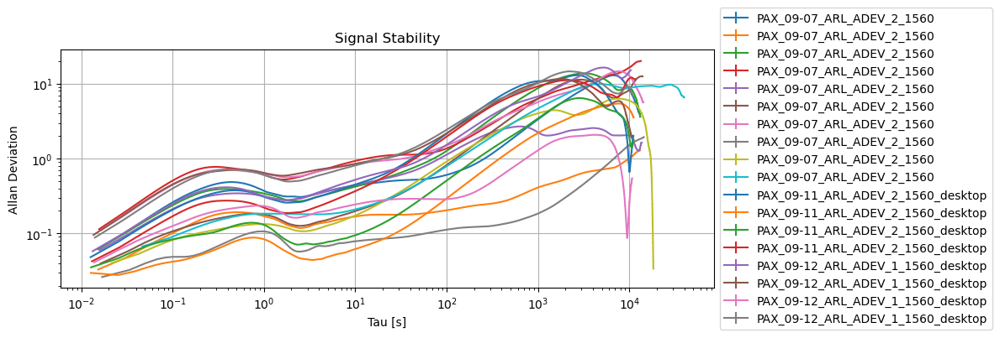

In [214]:
StationarySet.plot_adev(params_arr)

In [18]:
filename='Datasets/Whole_setup/09-07_09-12/PAX_09-07_ARL_ADEV_2_1560.csv'
range_list = [(0.0+i,0.025+i) for i in np.arange(0,1,0.025)]
range_list

[(0.0, 0.025),
 (0.025, 0.05),
 (0.05, 0.07500000000000001),
 (0.07500000000000001, 0.1),
 (0.1, 0.125),
 (0.125, 0.15),
 (0.15000000000000002, 0.17500000000000002),
 (0.17500000000000002, 0.2),
 (0.2, 0.225),
 (0.225, 0.25),
 (0.25, 0.275),
 (0.275, 0.30000000000000004),
 (0.30000000000000004, 0.32500000000000007),
 (0.325, 0.35000000000000003),
 (0.35000000000000003, 0.37500000000000006),
 (0.375, 0.4),
 (0.4, 0.42500000000000004),
 (0.42500000000000004, 0.45000000000000007),
 (0.45, 0.47500000000000003),
 (0.47500000000000003, 0.5),
 (0.5, 0.525),
 (0.525, 0.55),
 (0.55, 0.5750000000000001),
 (0.5750000000000001, 0.6000000000000001),
 (0.6000000000000001, 0.6250000000000001),
 (0.625, 0.65),
 (0.65, 0.675),
 (0.675, 0.7000000000000001),
 (0.7000000000000001, 0.7250000000000001),
 (0.7250000000000001, 0.7500000000000001),
 (0.75, 0.775),
 (0.775, 0.8),
 (0.8, 0.8250000000000001),
 (0.8250000000000001, 0.8500000000000001),
 (0.8500000000000001, 0.8750000000000001),
 (0.875, 0.9),
 (0.

In [22]:
plt.ioff()

===== Datasets =====
Number of taus used: 2820


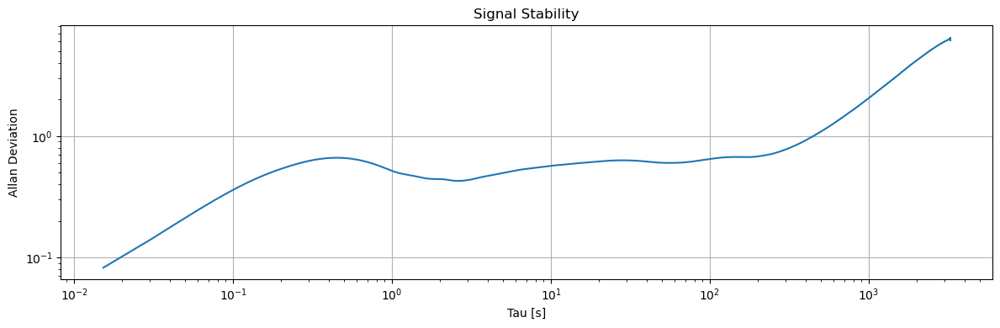

0 | PAX_09-07_ARL_ADEV_2_1560 | range = (0.0, 0.025) | elapsed time = 0.59 minutes | avg rate = 65.54
Number of taus used: 2820


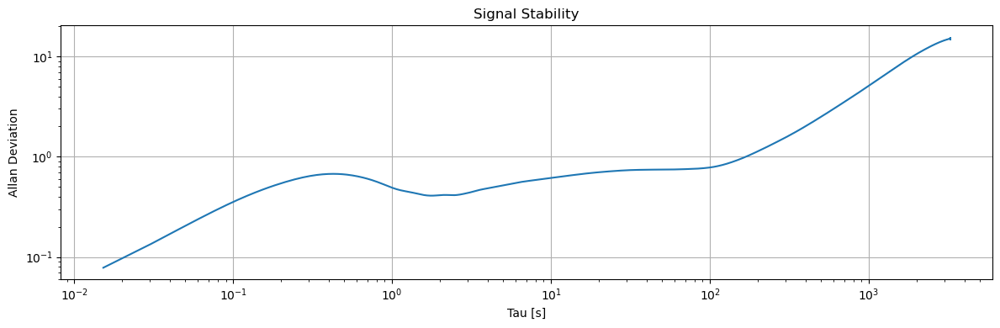

1 | PAX_09-07_ARL_ADEV_2_1560 | range = (0.025, 0.05) | elapsed time = 0.58 minutes | avg rate = 65.58
Number of taus used: 2820


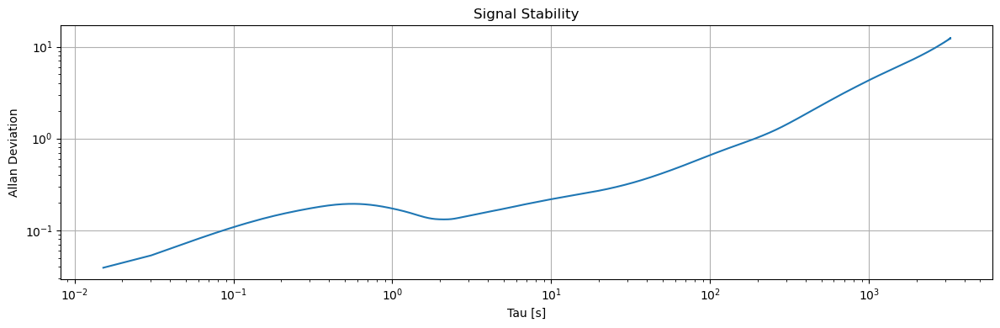

2 | PAX_09-07_ARL_ADEV_2_1560 | range = (0.05, 0.07500000000000001) | elapsed time = 0.59 minutes | avg rate = 65.88
Number of taus used: 2820


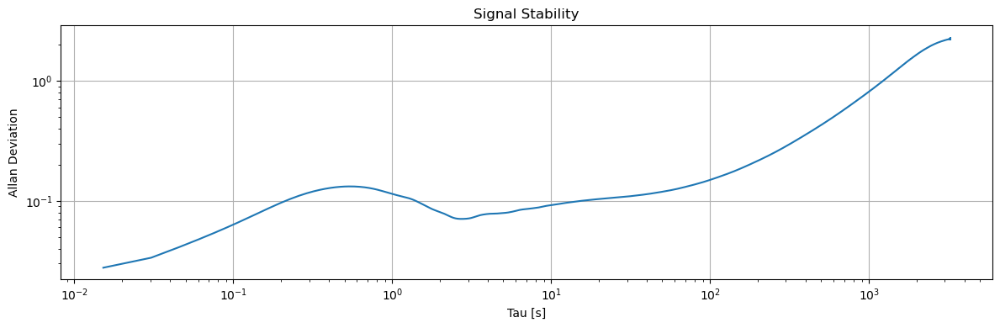

3 | PAX_09-07_ARL_ADEV_2_1560 | range = (0.07500000000000001, 0.1) | elapsed time = 0.61 minutes | avg rate = 65.80
Number of taus used: 2820


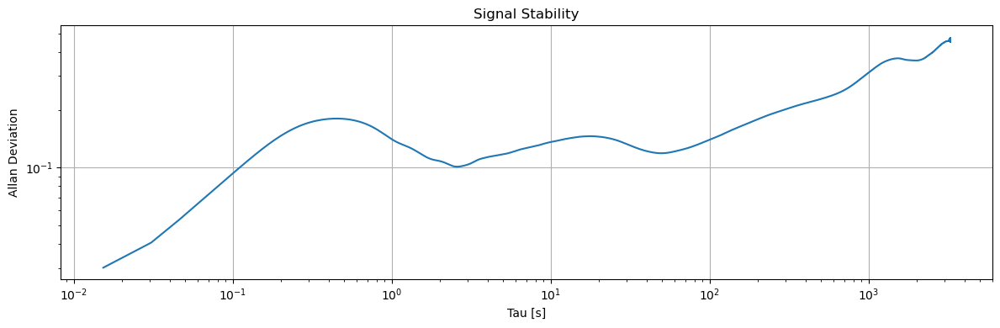

4 | PAX_09-07_ARL_ADEV_2_1560 | range = (0.1, 0.125) | elapsed time = 0.61 minutes | avg rate = 65.42
Number of taus used: 2820


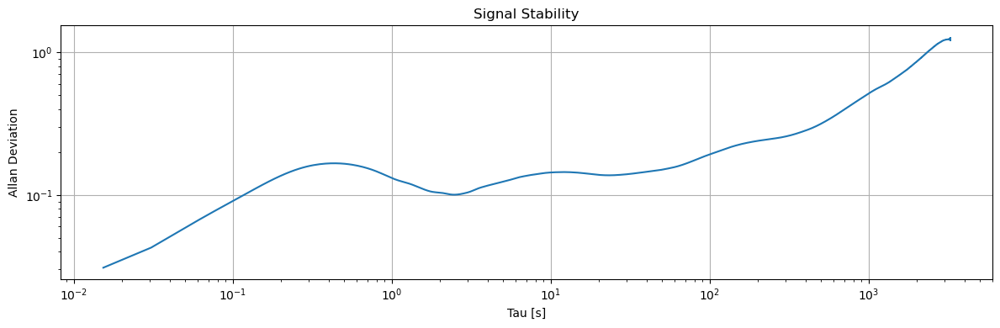

5 | PAX_09-07_ARL_ADEV_2_1560 | range = (0.125, 0.15) | elapsed time = 0.61 minutes | avg rate = 65.42
Number of taus used: 2820


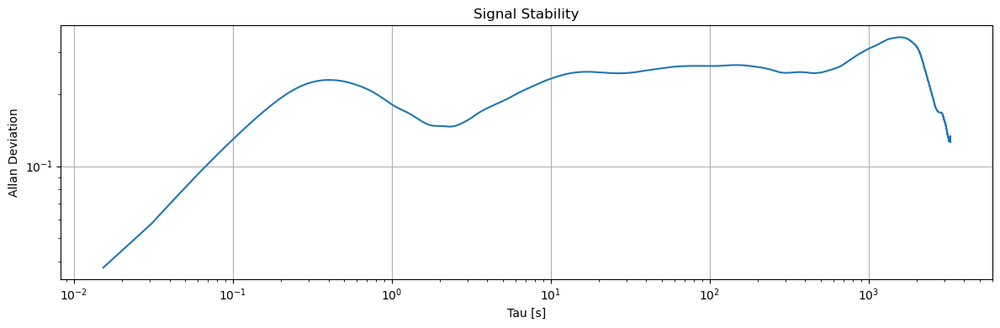

6 | PAX_09-07_ARL_ADEV_2_1560 | range = (0.15000000000000002, 0.17500000000000002) | elapsed time = 0.61 minutes | avg rate = 65.26
Number of taus used: 2820


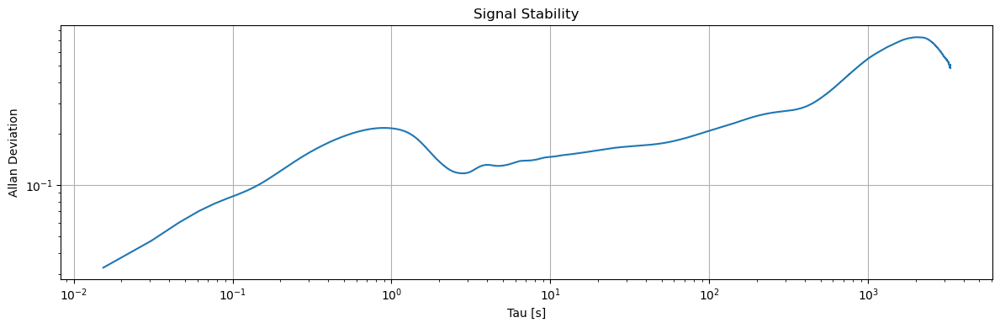

7 | PAX_09-07_ARL_ADEV_2_1560 | range = (0.17500000000000002, 0.2) | elapsed time = 0.63 minutes | avg rate = 65.07
Number of taus used: 2820


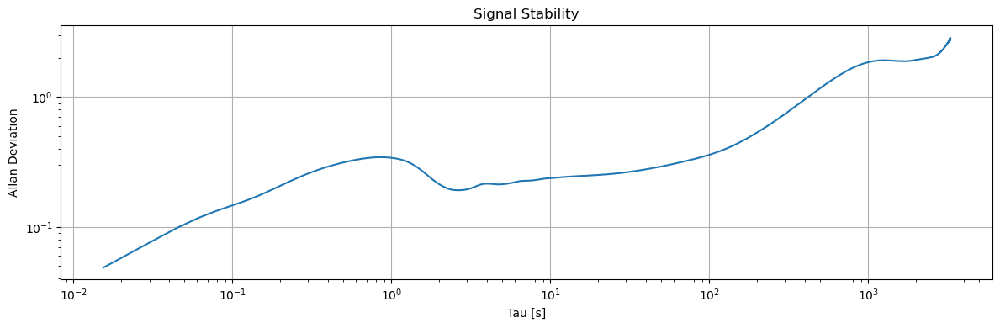

8 | PAX_09-07_ARL_ADEV_2_1560 | range = (0.2, 0.225) | elapsed time = 0.66 minutes | avg rate = 64.91
Number of taus used: 2820


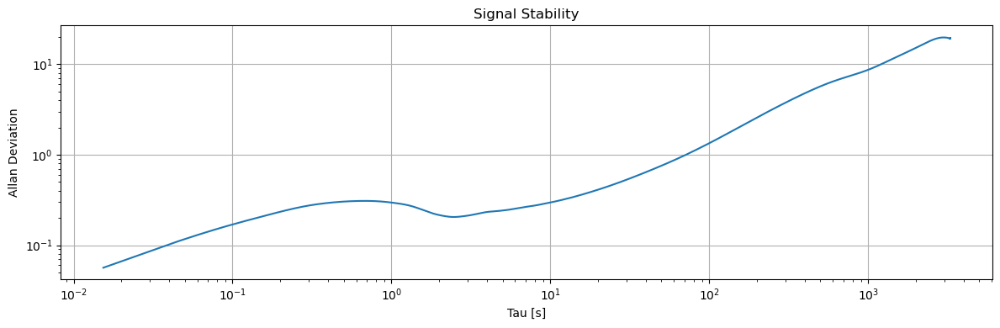

9 | PAX_09-07_ARL_ADEV_2_1560 | range = (0.225, 0.25) | elapsed time = 0.64 minutes | avg rate = 65.04
Number of taus used: 2820


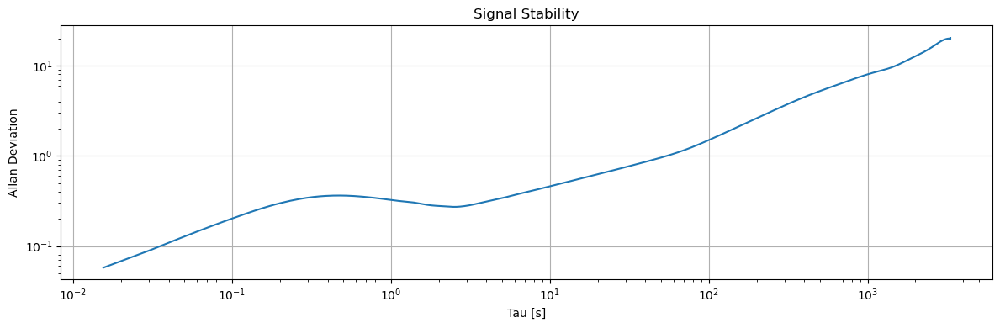

10 | PAX_09-07_ARL_ADEV_2_1560 | range = (0.25, 0.275) | elapsed time = 0.65 minutes | avg rate = 64.45
Number of taus used: 2820


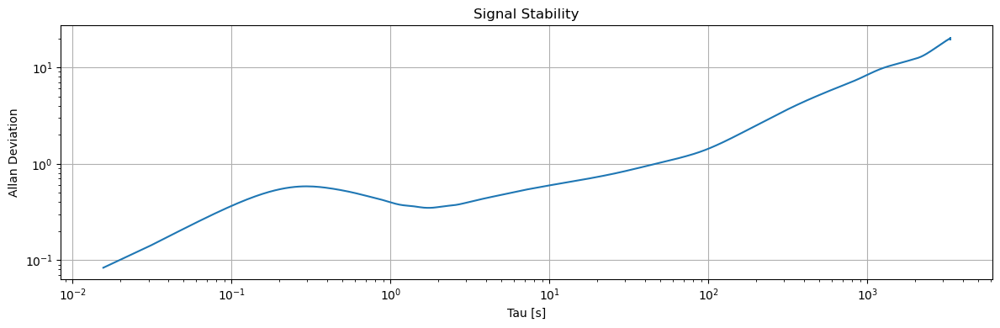

11 | PAX_09-07_ARL_ADEV_2_1560 | range = (0.275, 0.30000000000000004) | elapsed time = 0.65 minutes | avg rate = 64.13
Number of taus used: 2820


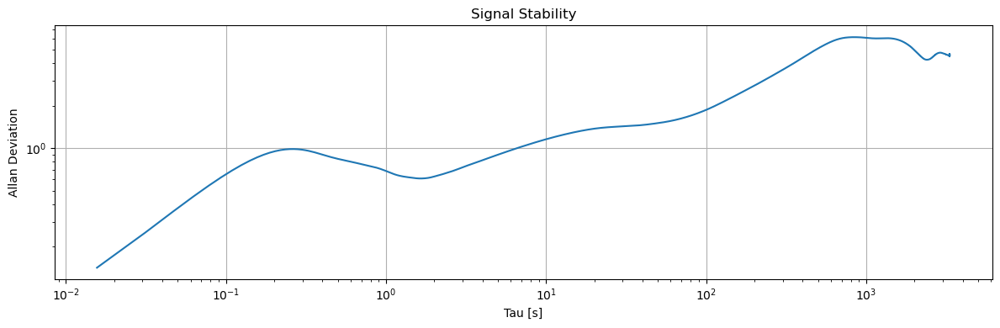

12 | PAX_09-07_ARL_ADEV_2_1560 | range = (0.30000000000000004, 0.32500000000000007) | elapsed time = 0.65 minutes | avg rate = 64.04
Number of taus used: 2820


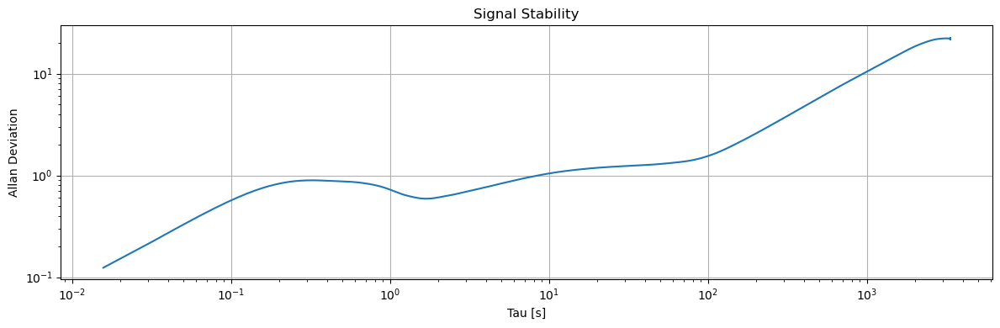

13 | PAX_09-07_ARL_ADEV_2_1560 | range = (0.325, 0.35000000000000003) | elapsed time = 0.66 minutes | avg rate = 63.88
Number of taus used: 2820


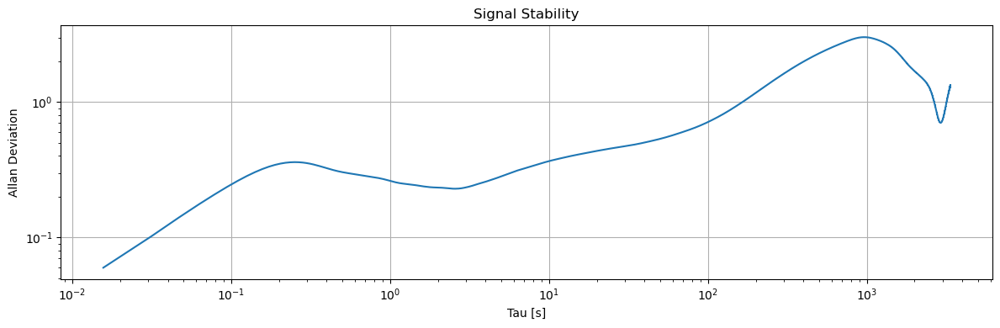

14 | PAX_09-07_ARL_ADEV_2_1560 | range = (0.35000000000000003, 0.37500000000000006) | elapsed time = 0.68 minutes | avg rate = 63.66
Number of taus used: 2820


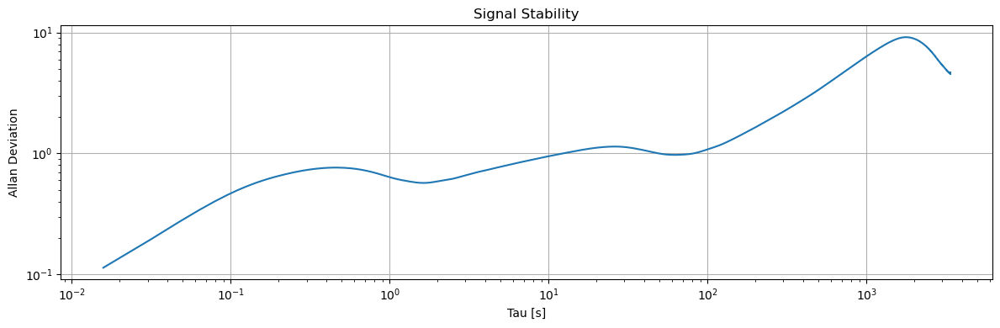

15 | PAX_09-07_ARL_ADEV_2_1560 | range = (0.375, 0.4) | elapsed time = 0.76 minutes | avg rate = 63.38
Number of taus used: 2820


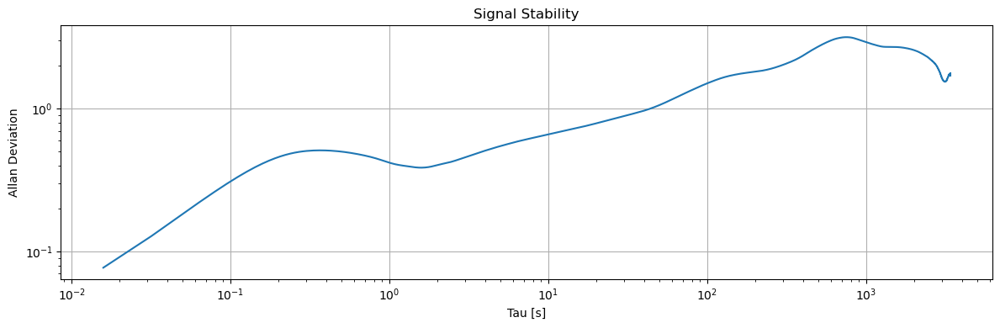

16 | PAX_09-07_ARL_ADEV_2_1560 | range = (0.4, 0.42500000000000004) | elapsed time = 0.70 minutes | avg rate = 63.15
Number of taus used: 2820


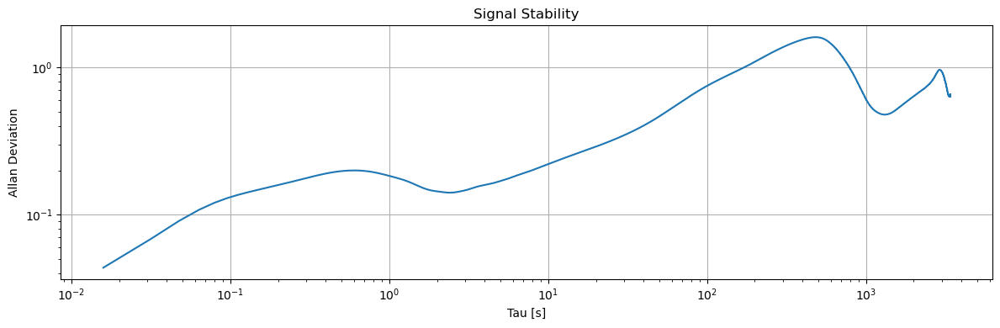

17 | PAX_09-07_ARL_ADEV_2_1560 | range = (0.42500000000000004, 0.45000000000000007) | elapsed time = 0.69 minutes | avg rate = 62.87
Number of taus used: 2820


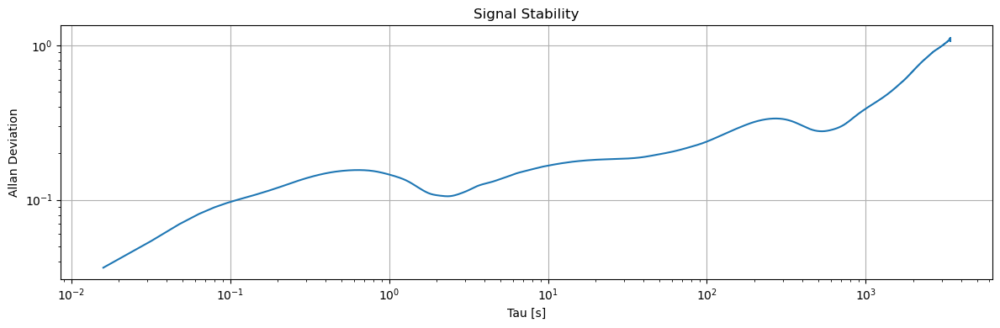

18 | PAX_09-07_ARL_ADEV_2_1560 | range = (0.45, 0.47500000000000003) | elapsed time = 0.72 minutes | avg rate = 62.78
Number of taus used: 2820


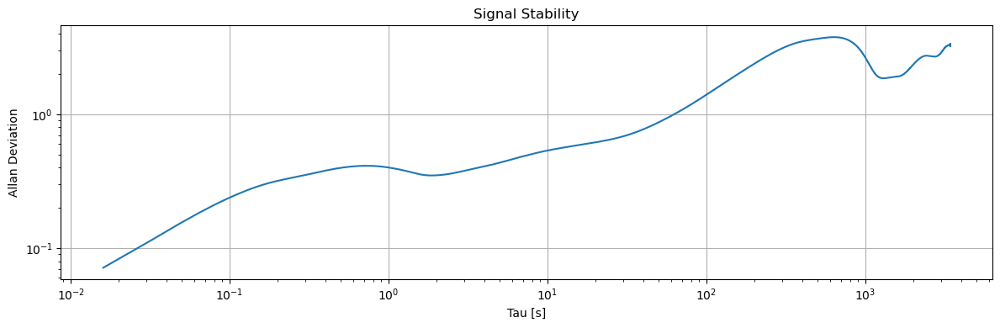

19 | PAX_09-07_ARL_ADEV_2_1560 | range = (0.47500000000000003, 0.5) | elapsed time = 0.71 minutes | avg rate = 62.39
Number of taus used: 2820


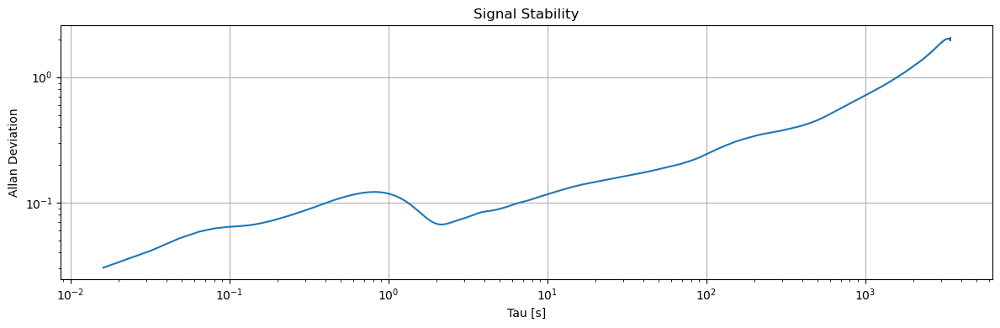

20 | PAX_09-07_ARL_ADEV_2_1560 | range = (0.5, 0.525) | elapsed time = 0.77 minutes | avg rate = 62.28
Number of taus used: 2820


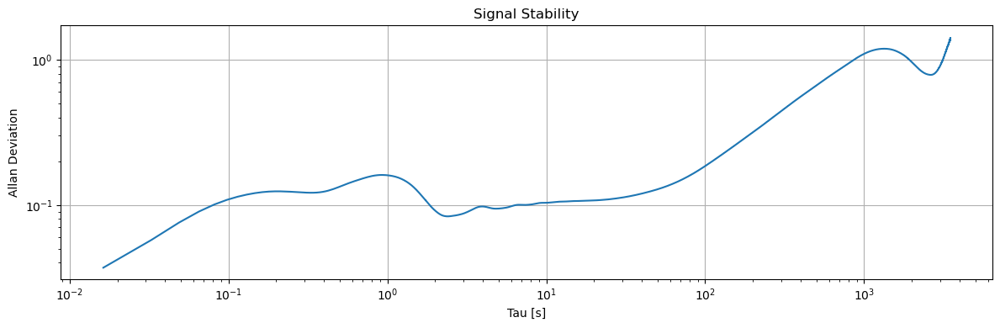

21 | PAX_09-07_ARL_ADEV_2_1560 | range = (0.525, 0.55) | elapsed time = 0.73 minutes | avg rate = 61.28
Number of taus used: 2820


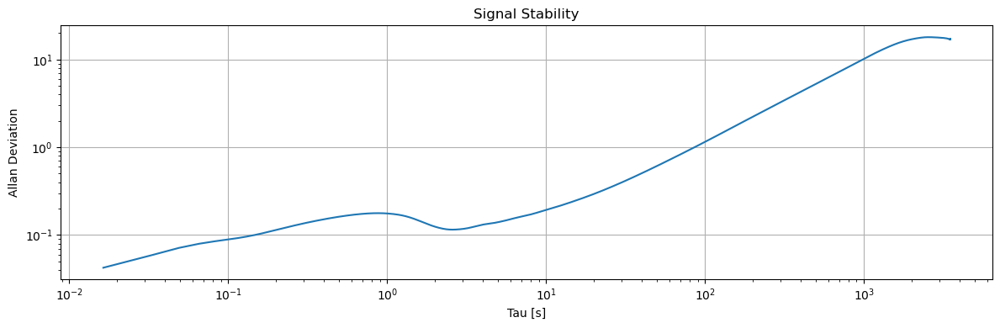

22 | PAX_09-07_ARL_ADEV_2_1560 | range = (0.55, 0.5750000000000001) | elapsed time = 0.77 minutes | avg rate = 61.03
Number of taus used: 2820


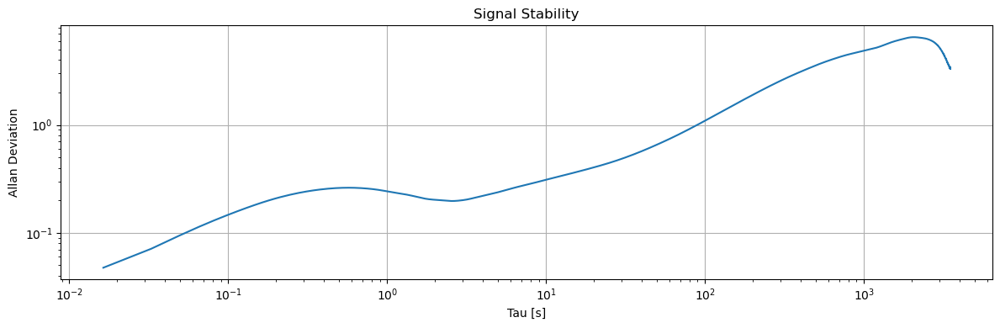

23 | PAX_09-07_ARL_ADEV_2_1560 | range = (0.5750000000000001, 0.6000000000000001) | elapsed time = 0.75 minutes | avg rate = 61.02
Number of taus used: 2820


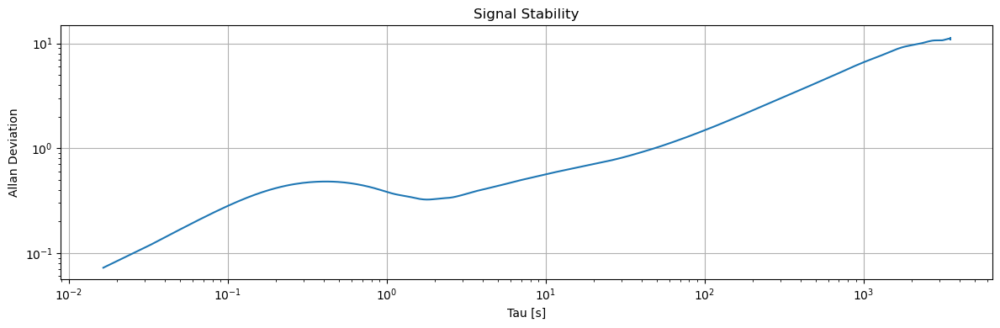

24 | PAX_09-07_ARL_ADEV_2_1560 | range = (0.6000000000000001, 0.6250000000000001) | elapsed time = 0.75 minutes | avg rate = 60.75
Number of taus used: 2820


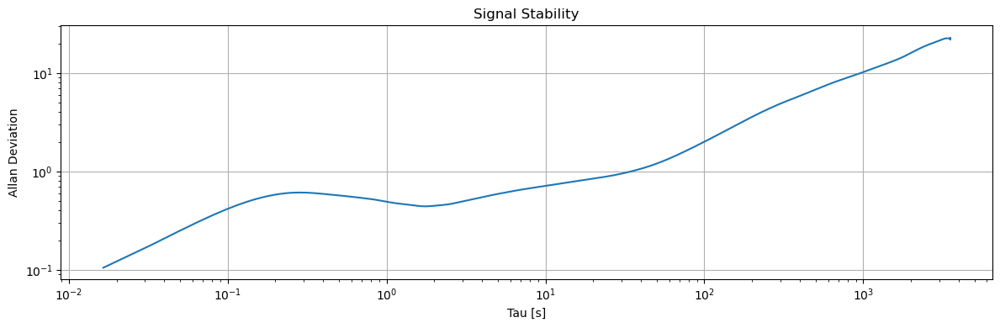

25 | PAX_09-07_ARL_ADEV_2_1560 | range = (0.625, 0.65) | elapsed time = 0.74 minutes | avg rate = 60.53
Number of taus used: 2820


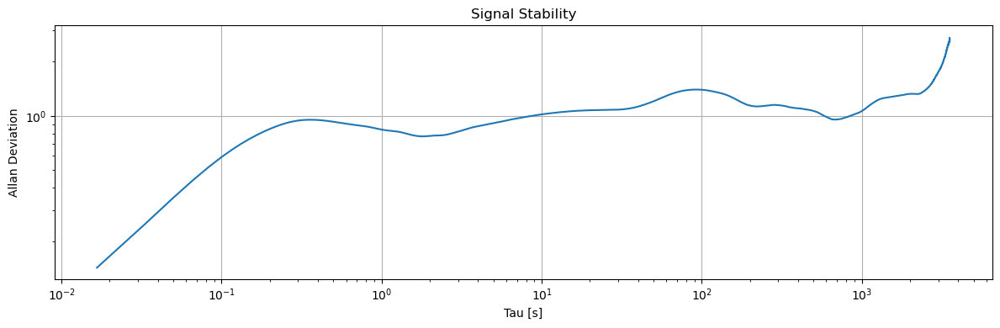

26 | PAX_09-07_ARL_ADEV_2_1560 | range = (0.65, 0.675) | elapsed time = 0.75 minutes | avg rate = 60.06
Number of taus used: 2820


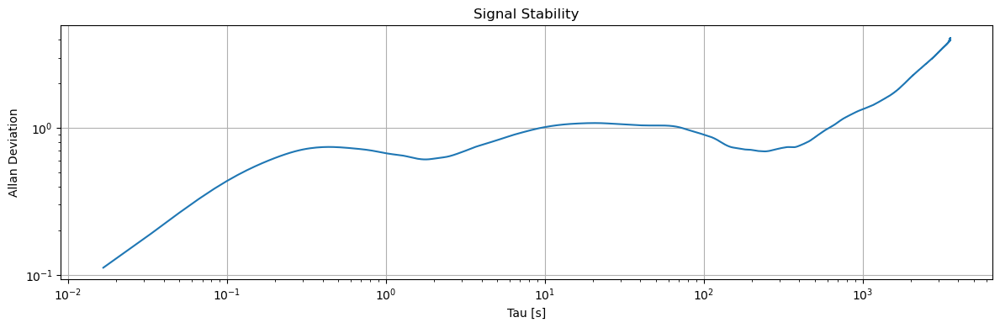

27 | PAX_09-07_ARL_ADEV_2_1560 | range = (0.675, 0.7000000000000001) | elapsed time = 0.79 minutes | avg rate = 59.94
Number of taus used: 2820


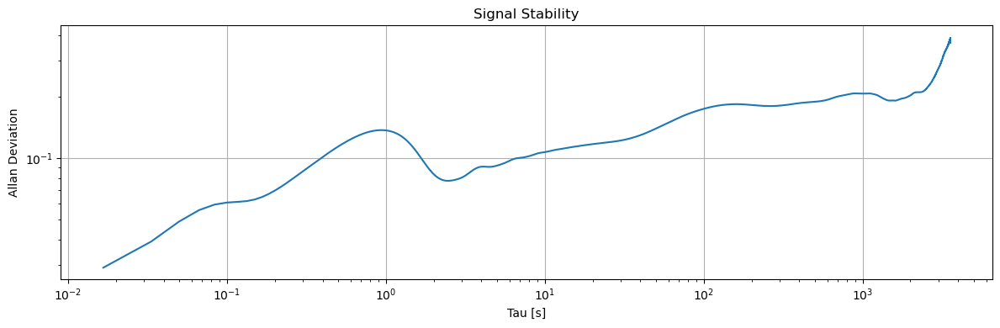

28 | PAX_09-07_ARL_ADEV_2_1560 | range = (0.7000000000000001, 0.7250000000000001) | elapsed time = 0.76 minutes | avg rate = 59.91
Number of taus used: 2820


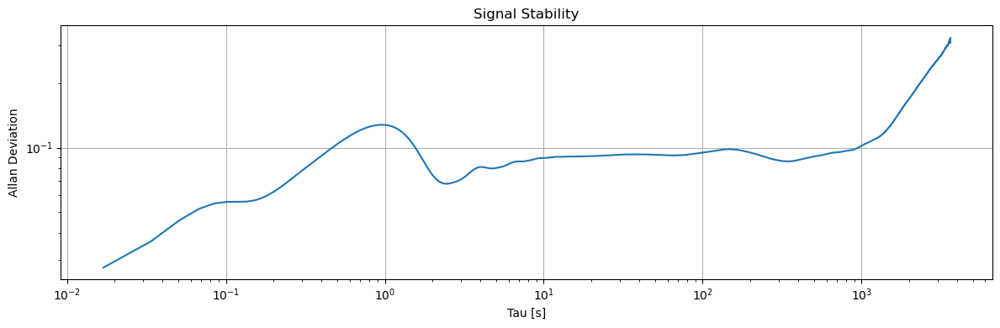

29 | PAX_09-07_ARL_ADEV_2_1560 | range = (0.7250000000000001, 0.7500000000000001) | elapsed time = 0.76 minutes | avg rate = 59.06
Number of taus used: 2820


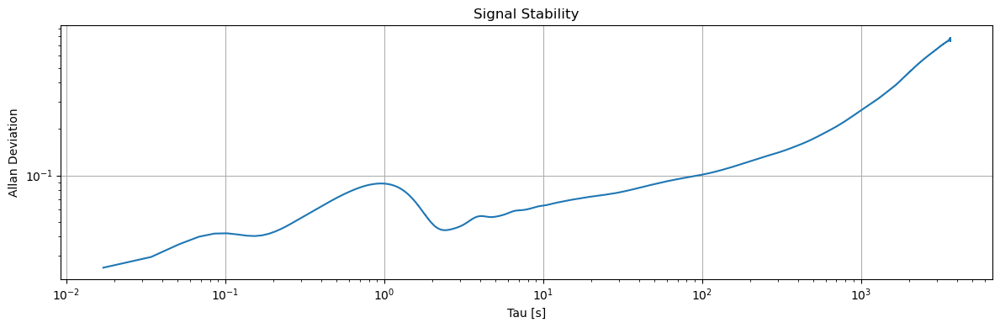

30 | PAX_09-07_ARL_ADEV_2_1560 | range = (0.75, 0.775) | elapsed time = 0.78 minutes | avg rate = 58.59
Number of taus used: 2820


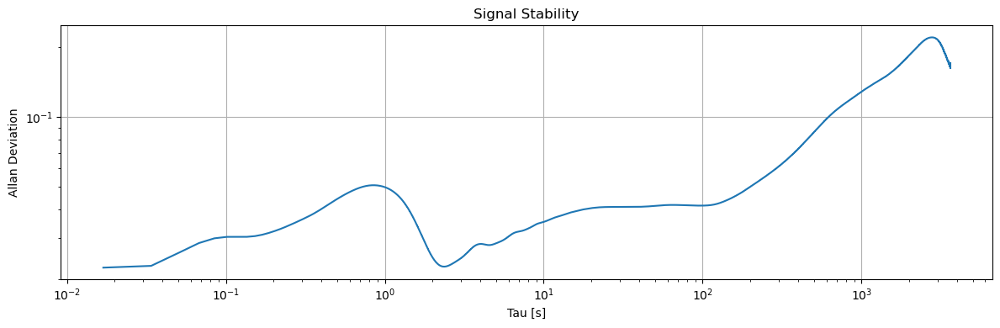

31 | PAX_09-07_ARL_ADEV_2_1560 | range = (0.775, 0.8) | elapsed time = 0.79 minutes | avg rate = 59.05
Number of taus used: 2820


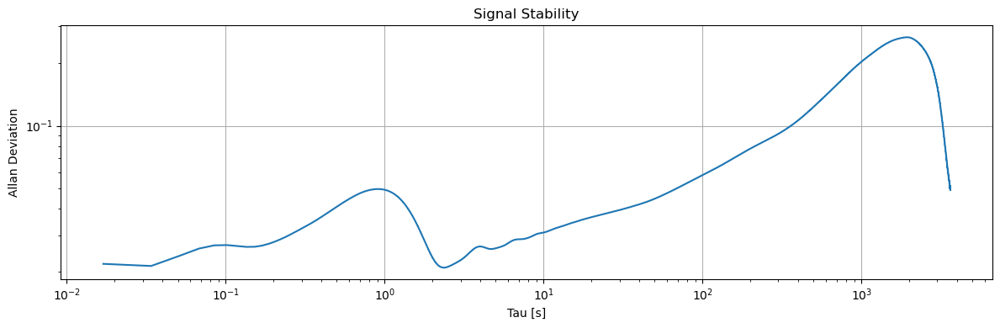

32 | PAX_09-07_ARL_ADEV_2_1560 | range = (0.8, 0.8250000000000001) | elapsed time = 0.80 minutes | avg rate = 58.96
Number of taus used: 2820


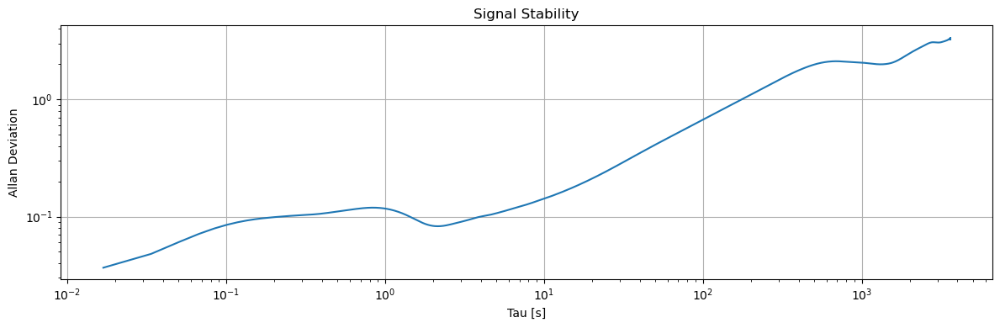

33 | PAX_09-07_ARL_ADEV_2_1560 | range = (0.8250000000000001, 0.8500000000000001) | elapsed time = 0.80 minutes | avg rate = 59.26
Number of taus used: 2820


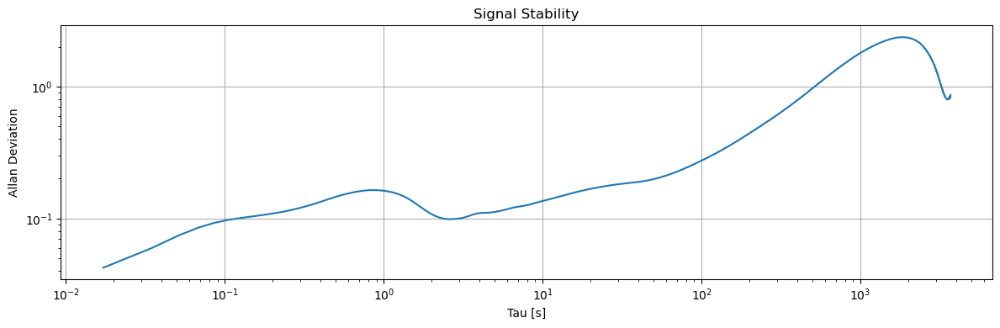

34 | PAX_09-07_ARL_ADEV_2_1560 | range = (0.8500000000000001, 0.8750000000000001) | elapsed time = 0.81 minutes | avg rate = 58.10
Number of taus used: 2820


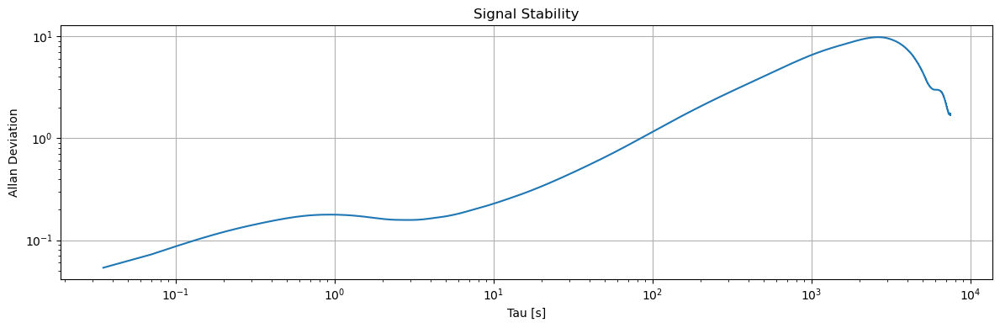

35 | PAX_09-07_ARL_ADEV_2_1560 | range = (0.875, 0.9) | elapsed time = 0.82 minutes | avg rate = 28.60
Number of taus used: 2820


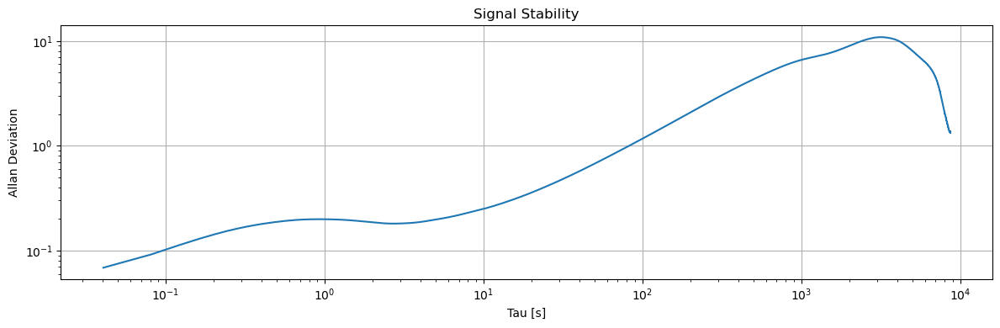

36 | PAX_09-07_ARL_ADEV_2_1560 | range = (0.9, 0.925) | elapsed time = 0.84 minutes | avg rate = 24.65
Number of taus used: 2820


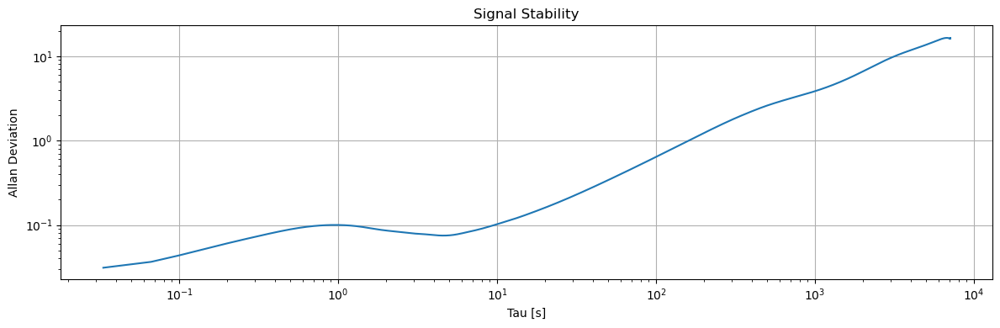

37 | PAX_09-07_ARL_ADEV_2_1560 | range = (0.925, 0.9500000000000001) | elapsed time = 0.86 minutes | avg rate = 30.06
Number of taus used: 2820


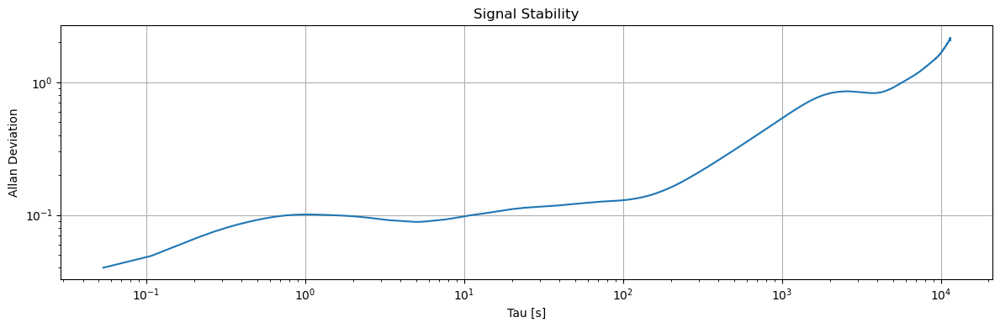

38 | PAX_09-07_ARL_ADEV_2_1560 | range = (0.9500000000000001, 0.9750000000000001) | elapsed time = 0.85 minutes | avg rate = 18.59
Number of taus used: 2820


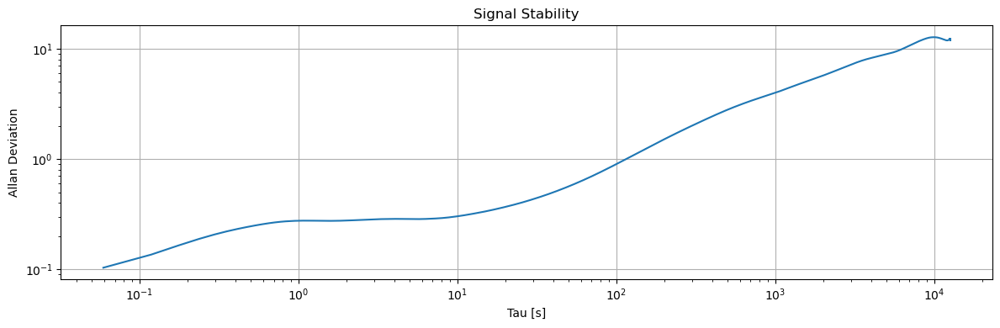

39 | PAX_09-07_ARL_ADEV_2_1560 | range = (0.9750000000000001, 1.0) | elapsed time = 0.87 minutes | avg rate = 16.88
Elapsed time: 28.76 minutes


In [23]:
start_time_total = time.time()
datasets = []; params_arr = []; i=0
print(BOLD_ON + '===== Datasets =====' + BOLD_OFF)
for set_range in range_list:
    start_time = time.time()
    ds = StationarySet(filename,set_range=set_range)
    taus2,ad,ade,ns = ds.adev(plot_param='Ellipticity',num_taus=5000,plot_adev=True)
    end_time = time.time()
    datasets.append(ds)
    label = ds.title + ' i'
    params_arr.append((taus2,ad,ade,ns,label))
    print('{:d} | {:s} | range = {} | elapsed time = {:.2f} minutes | avg rate = {:.2f}'.format(i,ds.title,set_range,(end_time-start_time)/60,ds.avg_sample_rate))
    i+=1
print(BOLD_ON + '========================' + BOLD_OFF)
end_time_total = time.time()
print("Elapsed time: {:.2f} minutes".format((end_time_total-start_time_total)/60))

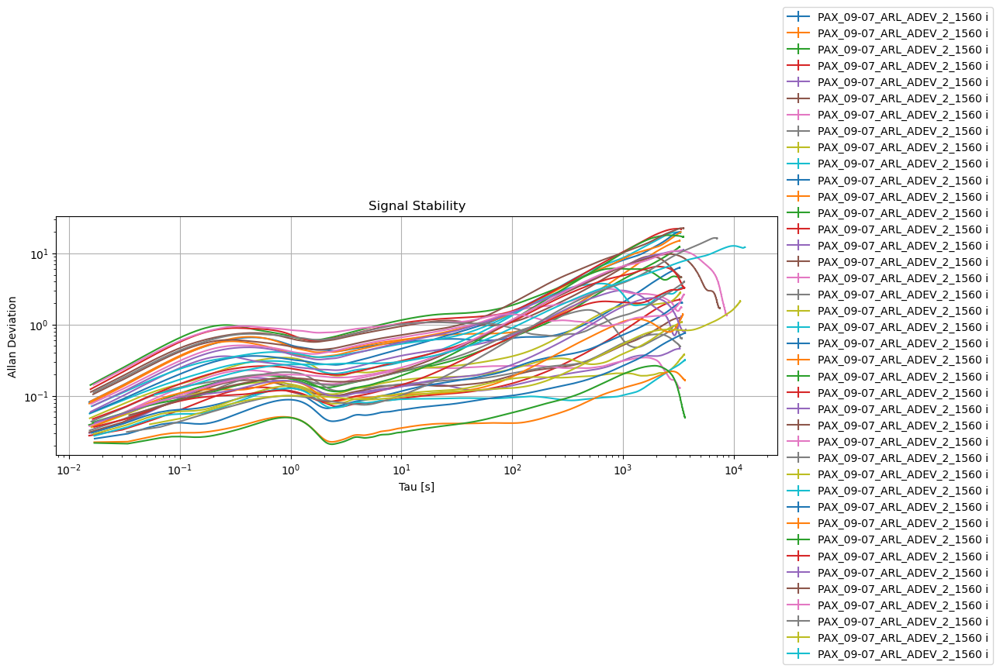

In [24]:
StationarySet.plot_adev(params_arr)

In [ ]:
filepath_11_short='Datasets/Whole_setup/09-07_09-12/PAX_09-11_ARL_ADEV_1_1560_desktop.csv'
ds_11_short = StationarySet(filepath_11_short)
ds_11_short.plot_raw(plot_param='Ellipticity')

In [ ]:
taus2,ad,ade,ns = ds_11_short.adev(plot_param='Ellipticity',num_taus=5000,plot_adev=True)
label = ds_11_short.title
params_arr.append((taus2,ad,ade,ns,label))

In [ ]:
filepath_11='Datasets/Whole_setup/09-07_09-12/PAX_09-11_ARL_ADEV_2_1560_desktop.csv'
ds_11 = StationarySet(filepath_11)
ds_11.plot_raw(plot_param='Ellipticity')

In [ ]:
taus2,ad,ade,ns = ds_11.adev(plot_param='Ellipticity',num_taus=5000,plot_adev=True)
label = ds_11.title
params_arr.append((taus2,ad,ade,ns,label))

#### Testing

In [10]:
plt.ioff();

In [12]:
filepath_ARL_long='Datasets/Whole_setup/09-07_09-12/PAX_09-07_ARL_ADEV_2_1560.csv'
ds_temp = StationarySet(filepath_ARL_long,set_range=(0.2,0.3))

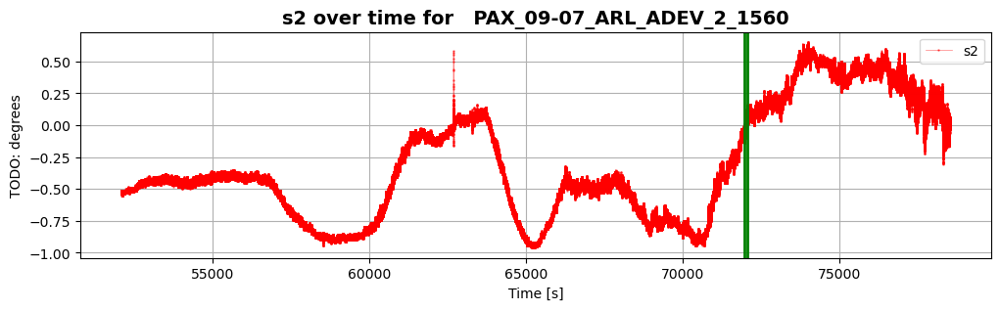

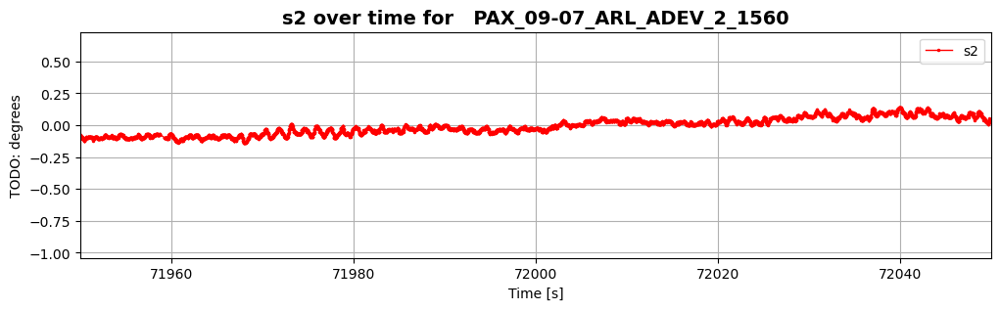

In [21]:
ds_temp.plot_raw(plot_param='s2', sample_range=(71950,72050))

Number of taus used: 3066


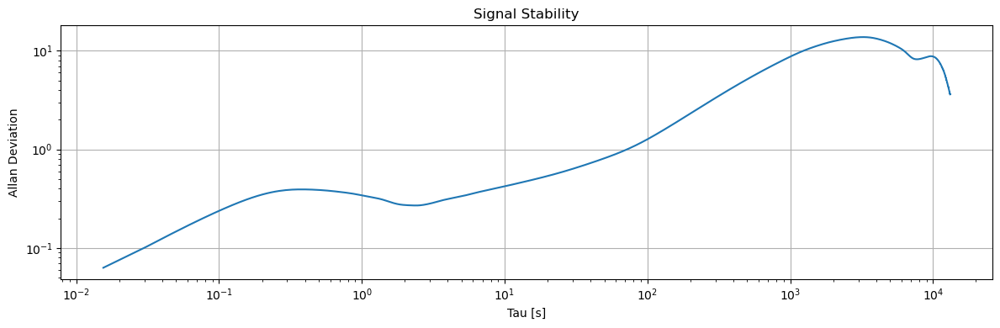

In [22]:
taus2,ad,ade,ns = ds_temp.adev(plot_param='Ellipticity',num_taus=5000,plot_adev=True)

### Adev (switching)

#### Init

In [7]:
folder_path='Datasets/Whole_setup/08-17'
datasets = []; params_arr = []; i=0
print(BOLD_ON + '===== Datasets =====' + BOLD_OFF)
for file_name in os.listdir(folder_path):
    if file_name.endswith('.csv') and 'ARL' in file_name:
        file_path = os.path.join(folder_path, file_name)
        ds = StationarySet(file_path)
        datasets.append(ds)
        print('{:d} | {:s} | bsr = {:.2f} | nom rate = {:.2f} | avg rate = {:.2f}'.format(i,ds.title,ds.basic_sample_rate,ds.nominal_sample_rate,ds.avg_sample_rate))
        taus2,ad,ade,ns = ds.adev(plot_param='Ellipticity',num_taus=5000)
        label = ds.title
        params_arr.append((taus2,ad,ade,ns,label))
        i+=1
print(BOLD_ON + '========================' + BOLD_OFF)
for ds in datasets:
    ds.adev(plot_param='Ellipticity',num_taus=5000,plot_adev=True)
#StationarySet.plot_adev(params_arr)

===== Datasets =====
0 | PAX_08-17_ARL_Orth_1_1345 | bsr = 400.00 | nom rate = 200.00 | avg rate = 66.74


KeyboardInterrupt: 

#### Debugging (implementing change_point_range_2)

##### Test 1

In [159]:
#TODO: drop averaged points with high STD

In [160]:
plt.ioff();

In [166]:
filepath_ARL_1_1560='Datasets/Whole_setup/08-17/PAX_08-17_ARL_Orth_1_1560.csv'
ds_3 = SwitchSet(filepath_ARL_1_1560,set_range=(0.05,0.15))

Time range: min=2225.277, max=6618.217


=== performing change point detection ===
cp range: (2300.0, 2400.0)
using 5729 data entries
skipping 4275 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (5729,)
computing range... ---> range = (1.14,1.20)
displaying jump_fig for switch parameter = s1



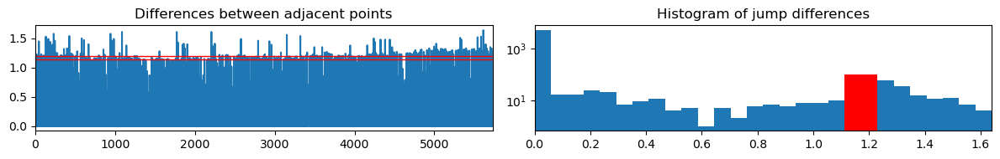



found width of 0.059 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (5729,)
computing range... ---> range = (1.41,1.47)
displaying jump_fig for switch parameter = s2



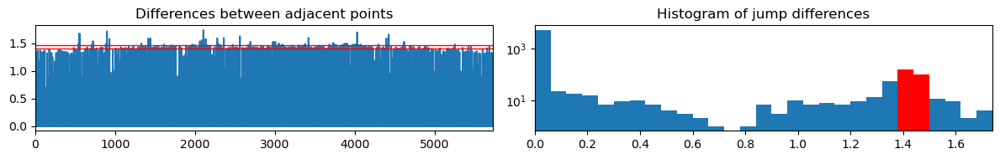



found width of 0.060 for s2
greater than prev width of 0.059 for s1
--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (5729,)
computing range... ---> range = (0.71,0.77)
displaying jump_fig for switch parameter = s3



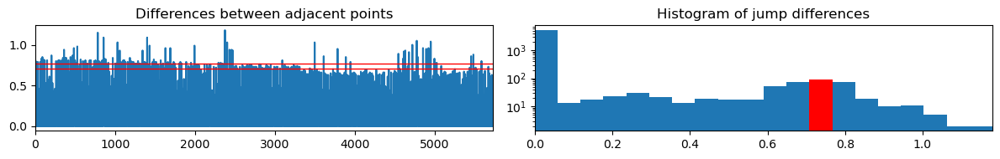



--- end of switch param: s3 ---

---> switch parameter found: s2 <---
finding differences within range = (1.41,1.47)
Jump points detected: 183
out of total: ~400.0

computing offset...


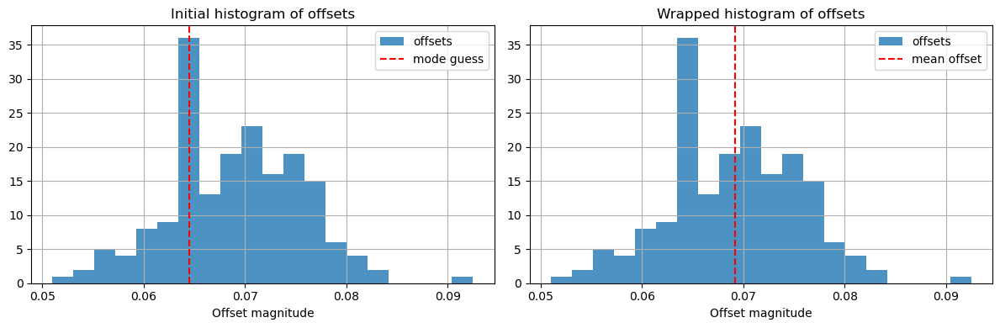



offset = 0.069 seconds
=== end change point detection ===
=== performing change point detection ===
cp range: (3000.0, 3100.0)
using 5719 data entries
skipping 44436 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (5719,)
computing range... ---> range = (1.16,1.22)
displaying jump_fig for switch parameter = s1



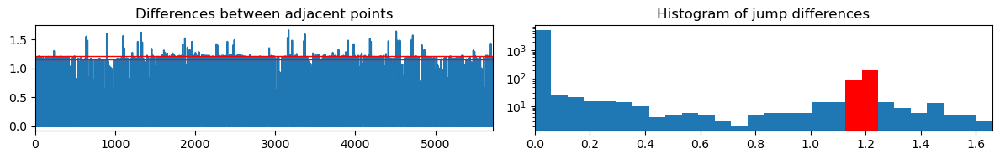



found width of 0.059 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (5719,)
computing range... ---> range = (1.39,1.45)
displaying jump_fig for switch parameter = s2



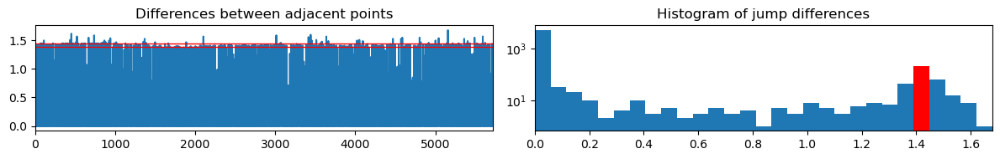



--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (5719,)
computing range... ---> range = (0.70,0.75)
displaying jump_fig for switch parameter = s3



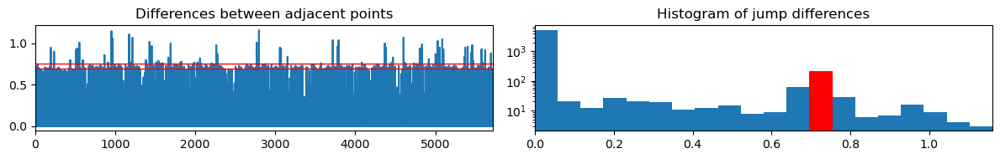



--- end of switch param: s3 ---

---> switch parameter found: s1 <---
finding differences within range = (1.16,1.22)
Jump points detected: 209
out of total: ~399.9

computing offset...


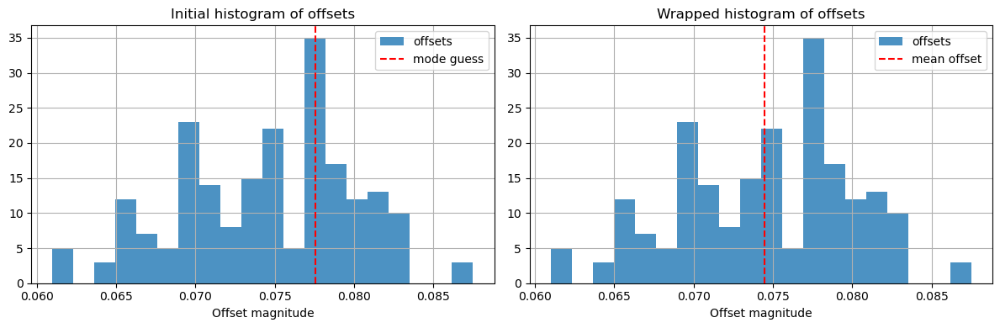



offset = 0.074 seconds
=== end change point detection ===
Nominal Switch Time = 0.2500000
Offset change of 0.005 seconds over 2800.0 switches
Corrected Switch Time = 0.2500019


In [167]:
ds_3.find_switches(nominal_switch_rate=2, change_point_range_1=(2300,2400), change_point_range_2=(3000,3100),print_process=True)

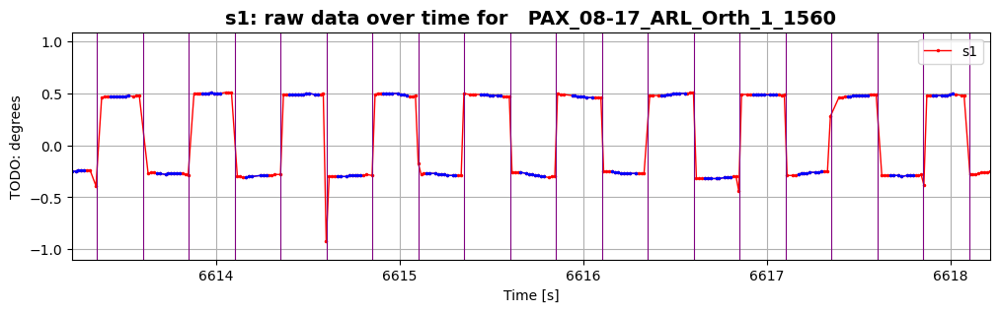

In [168]:
ds_3.plot_raw(birds_eye=False,sample_range=(-5,None),plot_switch=True,plot_valid=True,plot_avg=True)

In [133]:
off = ds_3.switch_offset
time = ds_3.switch_time
print(off)
print(time)
num*time+off

0.24159464350695803
0.2500021196640941


3051.2674630241113

In [9]:
1/.25000211/2

1.999983120142466

##### Test 2

In [42]:
filepath_ARL_1_1560='Datasets/Whole_setup/08-17/PAX_08-17_ARL_Orth_1_1560.csv'
ds_1_new = SwitchSet(filepath_ARL_1_1560,set_range=(600,-600))

In [43]:
ds_1_new.find_switches(nominal_switch_rate=2, change_point_range_1=(650,750), change_point_range_2=(3000,3100),print_process=False)

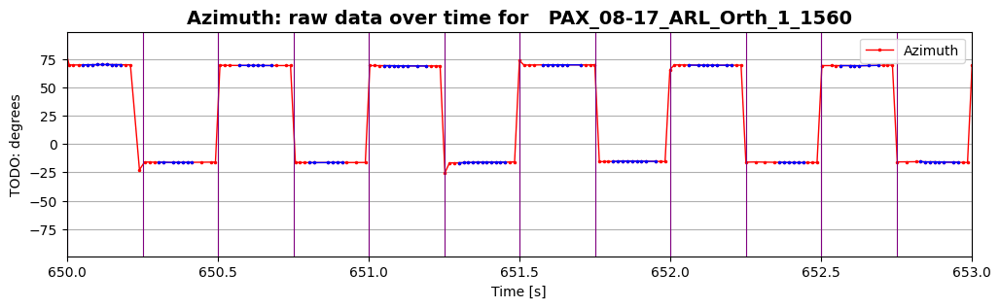

In [44]:
ds_1_new.plot_raw(birds_eye=False,sample_range=(650,653),plot_switch=True,plot_valid=True,plot_avg=True)

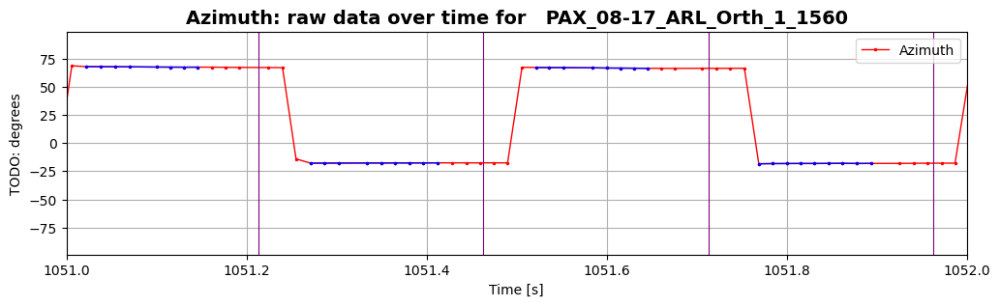

In [129]:
ds_1_new.plot_raw(birds_eye=False,sample_range=(1051,1052),plot_switch=True,plot_valid=True,plot_avg=True)

In [134]:
off = ds_1_new.switch_offset
time = ds_1_new.switch_time
print(off)
print(time)
num*time+off

0.3160627286132845
0.24997552391941325


3051.0173566411327

In [10]:
1/.2499755/2

2.0001960192098824

##### Test 3

In [66]:
filepath_ARL_1_1560='Datasets/Whole_setup/08-17/PAX_08-17_ARL_Orth_1_1560.csv'
ds_2_new = SwitchSet(filepath_ARL_1_1560,set_range=(600,-600))

In [67]:
ds_2_new.find_switches(nominal_switch_rate=2, change_point_range_1=(650,750), change_point_range_2=None,print_process=False)

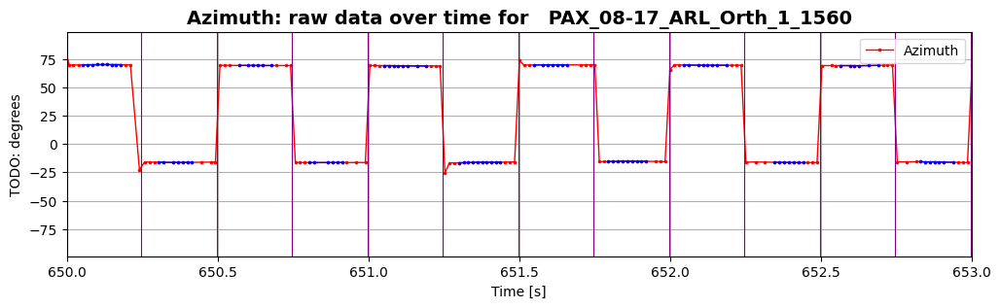

In [68]:
ds_2_new.plot_raw(birds_eye=False,sample_range=(650,653),plot_switch=True,plot_valid=True,plot_avg=True)

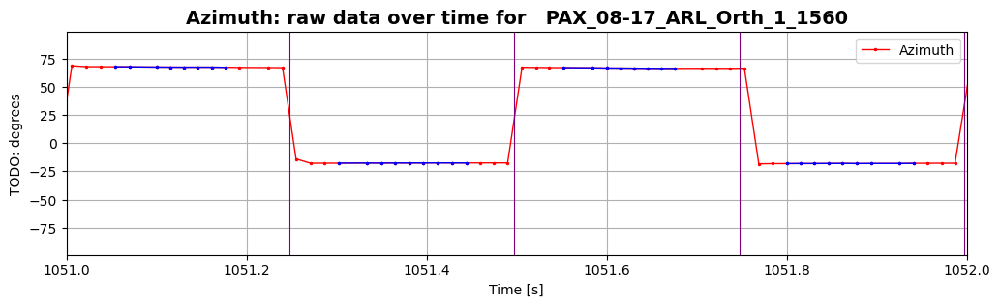

In [138]:
ds_2_new.plot_raw(birds_eye=False,sample_range=(1051,1052),plot_switch=True,plot_valid=True,plot_avg=True)

In [120]:
off = ds_2_new.switch_offset
time = ds_2_new.switch_time
print(off)
print(time)
num = np.ceil(3051/time)
print(num)
num*time+off

0.2475297029703318
0.25
12204.0


3051.2475297029705

##### Test 4

In [152]:
filepath_ARL_1_1560='Datasets/Whole_setup/08-17/PAX_08-17_ARL_Orth_1_1560.csv'
ds_4 = SwitchSet(filepath_ARL_1_1560,set_range=(600,-600))

In [153]:
ds_4.find_switches(nominal_switch_rate=2, change_point_range_1=(650,750), change_point_range_2=(3000,3100),print_process=False)

In [154]:
ds_4.average_data(print_process=True)

=== starting average_data ===
averaging data... Done
Dropped 1 observations with <4 points (out of total 172275 observations)

--- interpolating data ---
length before: 86138
length after: 86138
0 total added
--- end interpolating data ---

--- interpolating data ---
length before: 86136
length after: 86137
1 total added
--- end interpolating data ---
Signal 1 size=86137	Signal 1 range: t=(600.62,43668.99)
Signal 2 size=86138	Signal 2 range: t=(600.37,43669.24)
=== end average_data ===


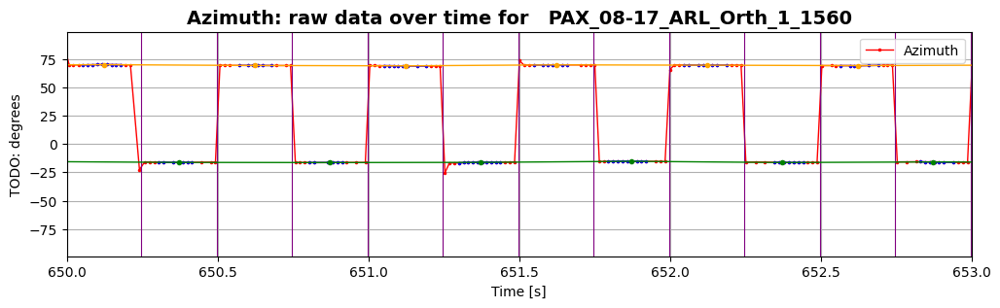

In [155]:
ds_4.plot_raw(birds_eye=False,sample_range=(650,653),plot_switch=True,plot_valid=True,plot_avg=True)

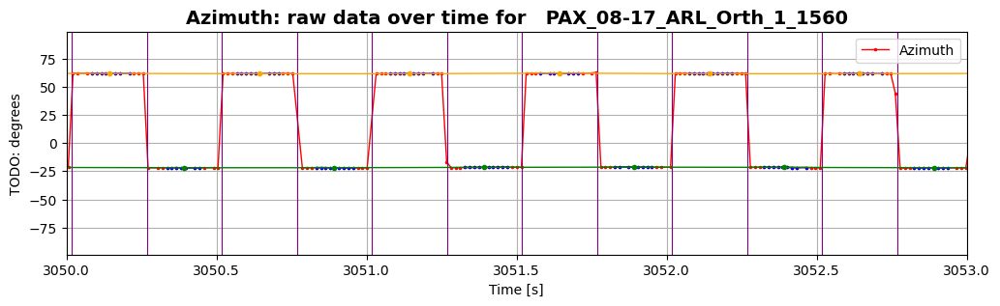

In [157]:
ds_4.plot_raw(birds_eye=False,sample_range=(3050,3053),plot_switch=True,plot_valid=True,plot_avg=True)

##### Test 5

In [170]:
filepath_DC_1_1345='Datasets/Whole_setup/08-17/PAX_08-17_DC_Orth_1_1345.csv'
ds_DC_1_1345 = SwitchSet(filepath_DC_1_1345,set_range=(0.05,0.15))

Time range: min=2439.848, max=7306.779


In [ ]:
ds_DC_1_1345.find_switches(nominal_switch_rate=2, change_point_range_1=(2500,2600), print_process=True)

Discontinued test; not needed

#### ADEV: ARL

In [13]:
plt.ioff();

In [14]:
filepath_ARL_1_1345='Datasets/Whole_setup/08-17/PAX_08-17_ARL_Orth_1_1345.csv'
filepath_ARL_1_1560='Datasets/Whole_setup/08-17/PAX_08-17_ARL_Orth_1_1560.csv'
filepath_ARL_list = [filepath_ARL_1_1345,filepath_ARL_1_1560]

In [15]:
arr=[(1,2)]
arr_1=[(2,3),(3,4)]
arr+arr_1

[(1, 2), (2, 3), (3, 4)]

===== Datasets =====
Time range: min=2236.844, max=6617.273
Determining change point ranges automatically...
Using change_point_range_1=(2236.844, 2336.844)
Using change_point_range_2=(5236.844, 5336.844)
=== performing change point detection ===
cp range: (2236.844, 2336.844)
using 6767 data entries
skipping 0 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (6767,)
computing range... ---> range = (0.44,0.50)
displaying jump_fig for switch parameter = s1



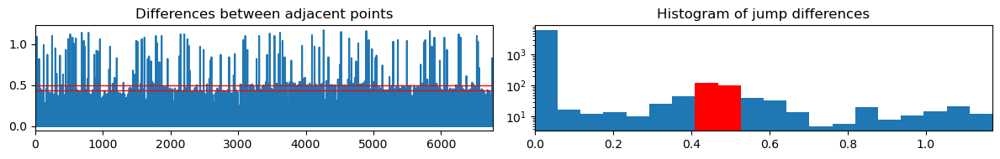



found width of 0.058 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (6767,)
computing range... ---> range = (0.14,0.20)
displaying jump_fig for switch parameter = s2



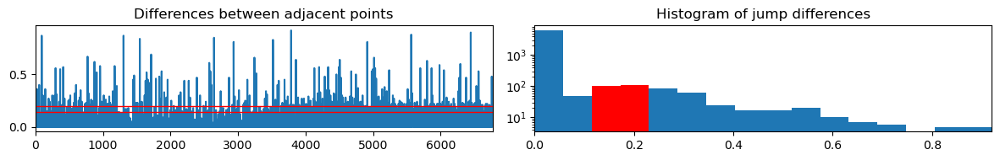



--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (6767,)
computing range... ---> range = (1.88,1.94)
displaying jump_fig for switch parameter = s3



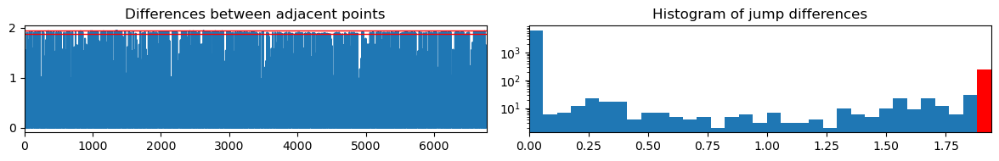



found width of 0.059 for s3
greater than prev width of 0.058 for s1
--- end of switch param: s3 ---

---> switch parameter found: s3 <---
finding differences within range = (1.88,1.94)
Jump points detected: 243
out of total: ~400.0

computing offset...


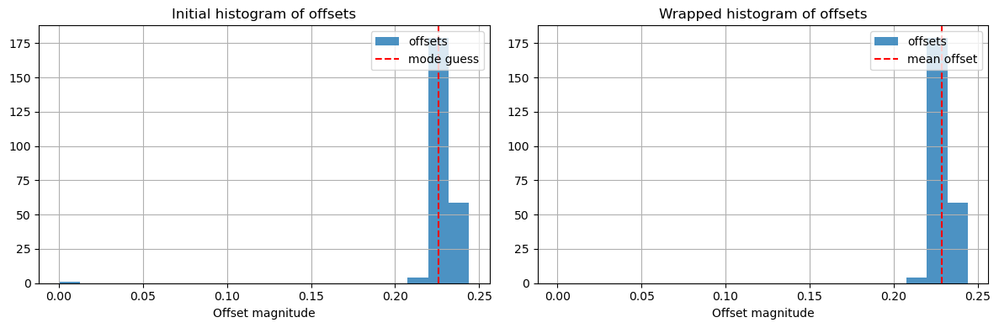



offset = 0.229 seconds
=== end change point detection ===
=== performing change point detection ===
cp range: (5236.844, 5336.844)
using 6783 data entries
skipping 202409 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (6783,)
computing range... ---> range = (0.06,0.11)
displaying jump_fig for switch parameter = s1



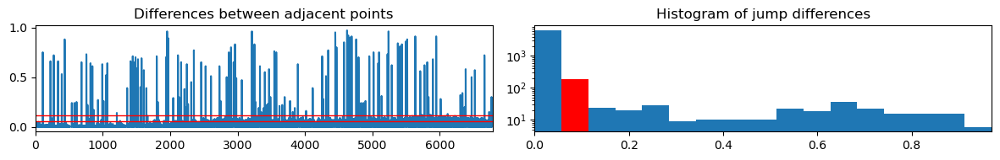



found width of 0.057 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (6783,)
computing range... ---> range = (0.09,0.14)
displaying jump_fig for switch parameter = s2



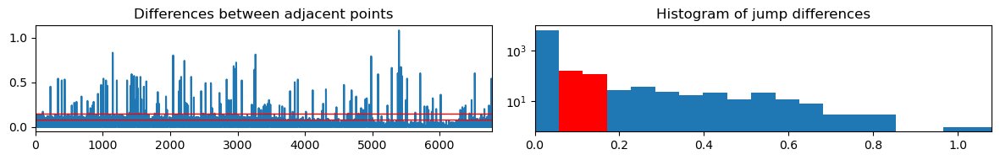



--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (6783,)
computing range... ---> range = (1.92,1.98)
displaying jump_fig for switch parameter = s3



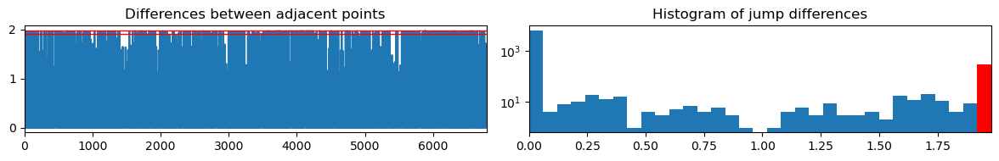



found width of 0.060 for s3
greater than prev width of 0.057 for s1
--- end of switch param: s3 ---

---> switch parameter found: s3 <---
finding differences within range = (1.92,1.98)
Jump points detected: 289
out of total: ~399.9

computing offset...


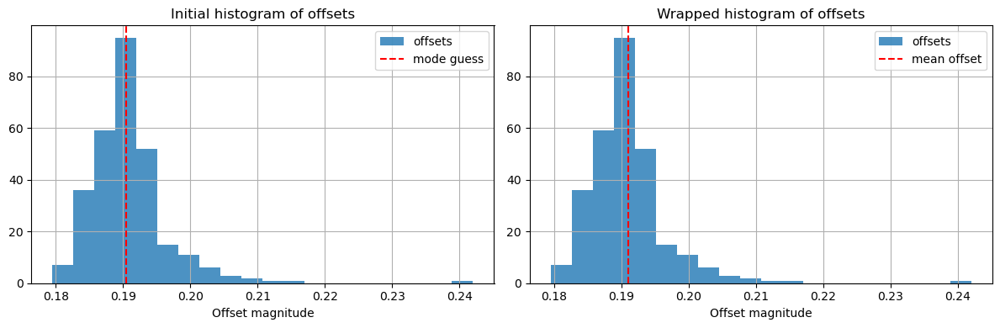



offset = 0.191 seconds
=== end change point detection ===
Nominal Switch Time = 0.2500000
Offset change of -0.038 seconds over 12000.0 switches
Corrected Switch Time = 0.2499969
=== starting average_data ===
averaging data... Done
Dropped 11 observations with <4 points (out of total 17423 observations)

--- interpolating data ---
length before: 8709
length after: 8761
52 total added
--- end interpolating data ---

--- interpolating data ---
length before: 8703
length after: 8760
57 total added
--- end interpolating data ---
Signal 1 size=8760	Signal 1 range: t=(2237.35,6616.80)
Signal 2 size=8761	Signal 2 range: t=(2237.10,6617.05)
=== end average_data ===


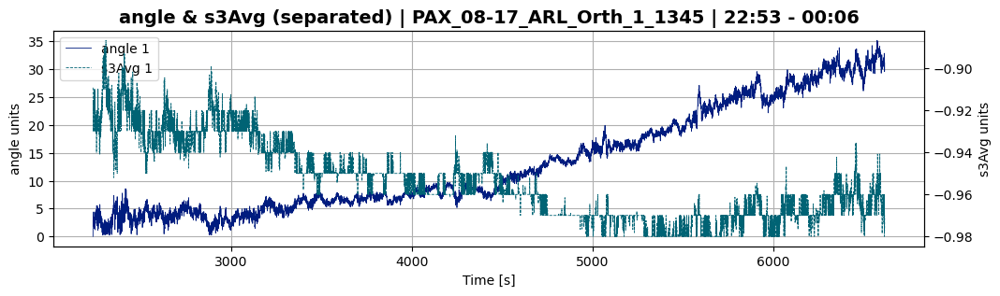

Number of taus used for signal 1: 1692
Number of taus used for signal 2: 1692


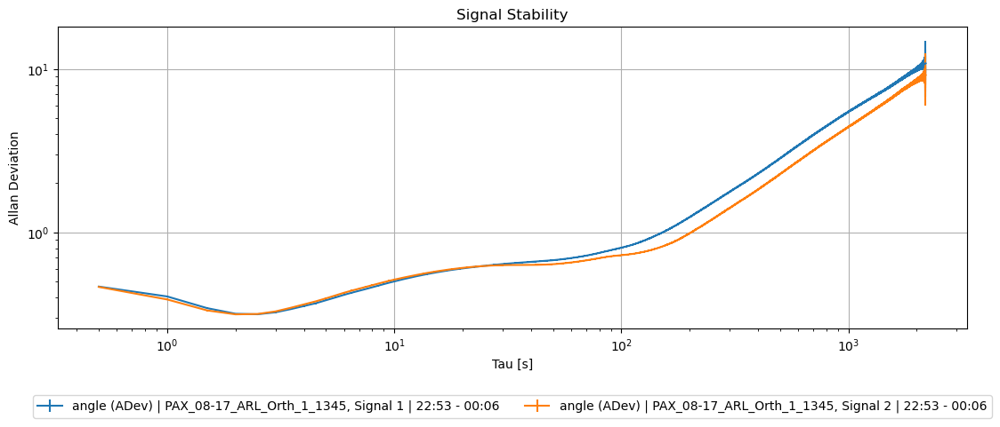

0 | PAX_08-17_ARL_Orth_1_1345 | bsr = 400.00 | nom rate = 200.00 | avg rate = 67.44
Time range: min=2225.277, max=6618.217
Determining change point ranges automatically...
Using change_point_range_1=(2225.277, 2325.277)
Using change_point_range_2=(5225.277, 5325.277)
=== performing change point detection ===
cp range: (2225.277, 2325.277)
using 5717 data entries
skipping 0 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (5717,)
computing range... ---> range = (1.17,1.23)
displaying jump_fig for switch parameter = s1



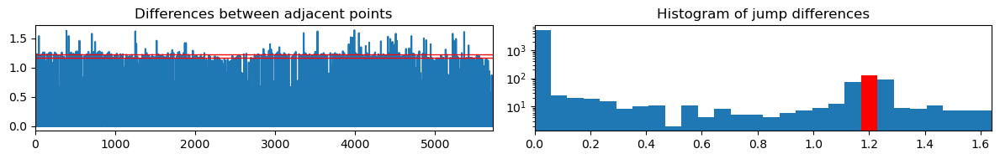



found width of 0.059 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (5717,)
computing range... ---> range = (1.39,1.45)
displaying jump_fig for switch parameter = s2



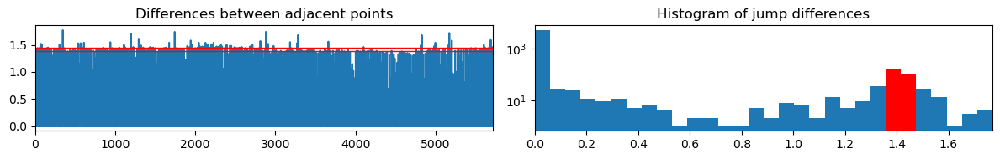



found width of 0.059 for s2
greater than prev width of 0.059 for s1
--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (5717,)
computing range... ---> range = (0.70,0.75)
displaying jump_fig for switch parameter = s3



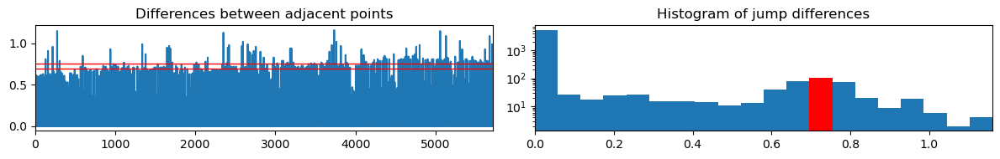



--- end of switch param: s3 ---

---> switch parameter found: s2 <---
finding differences within range = (1.39,1.45)
Jump points detected: 179
out of total: ~399.9

computing offset...


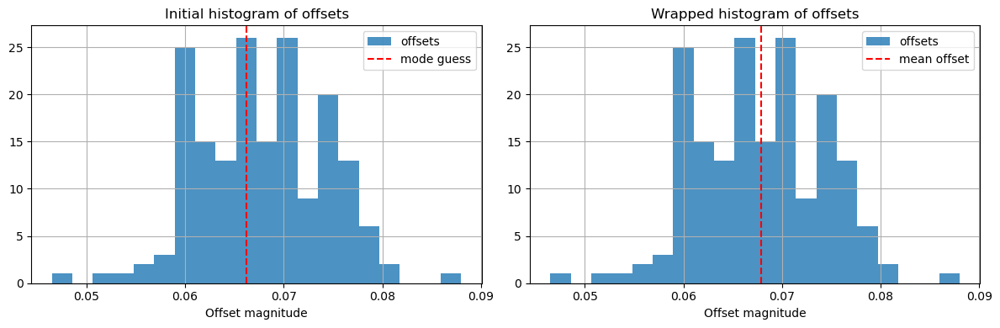



offset = 0.068 seconds
=== end change point detection ===
=== performing change point detection ===
cp range: (5225.277, 5325.277)
using 5767 data entries
skipping 171957 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (5767,)
computing range... ---> range = (0.87,0.93)
displaying jump_fig for switch parameter = s1



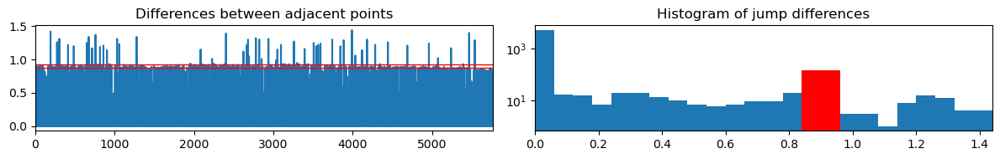



found width of 0.060 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (5767,)
computing range... ---> range = (1.53,1.59)
displaying jump_fig for switch parameter = s2



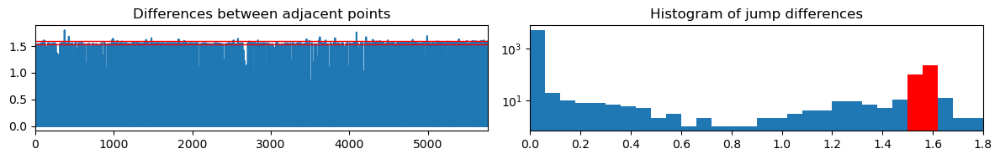



--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (5767,)
computing range... ---> range = (0.81,0.86)
displaying jump_fig for switch parameter = s3



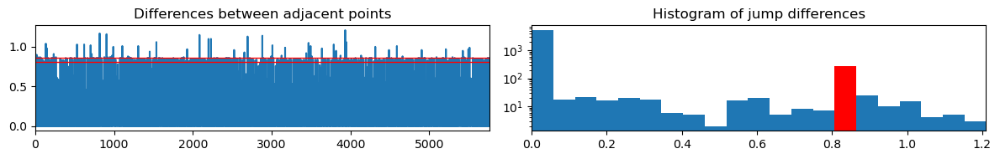



--- end of switch param: s3 ---

---> switch parameter found: s1 <---
finding differences within range = (0.87,0.93)
Jump points detected: 252
out of total: ~400.0

computing offset...


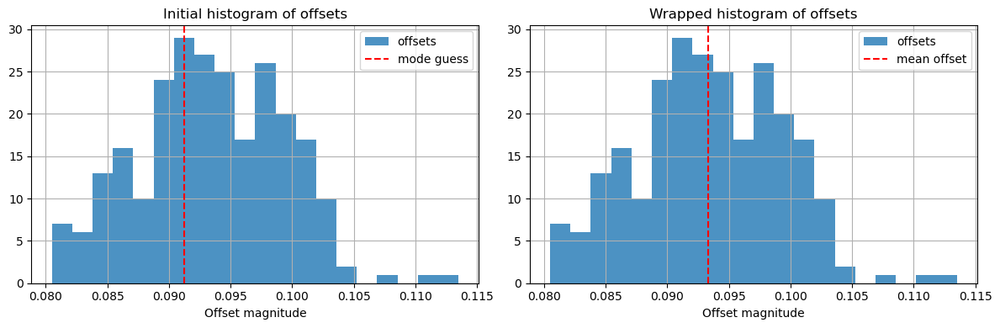



offset = 0.093 seconds
=== end change point detection ===
Nominal Switch Time = 0.2500000
Offset change of 0.025 seconds over 12000.0 switches
Corrected Switch Time = 0.2500021
=== starting average_data ===
averaging data... Done
Dropped 0 observations with <4 points (out of total 17570 observations)

--- interpolating data ---
length before: 8785
length after: 8785
0 total added
--- end interpolating data ---

--- interpolating data ---
length before: 8785
length after: 8785
0 total added
--- end interpolating data ---
Signal 1 size=8785	Signal 1 range: t=(2225.94,6617.98)
Signal 2 size=8785	Signal 2 range: t=(2225.69,6617.73)
=== end average_data ===


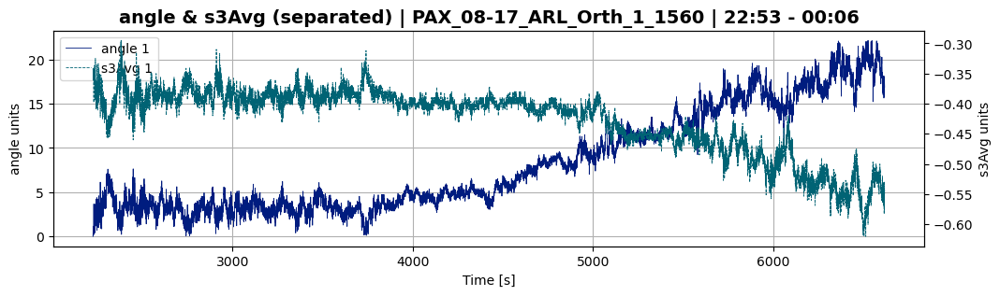

Number of taus used for signal 1: 1693
Number of taus used for signal 2: 1693


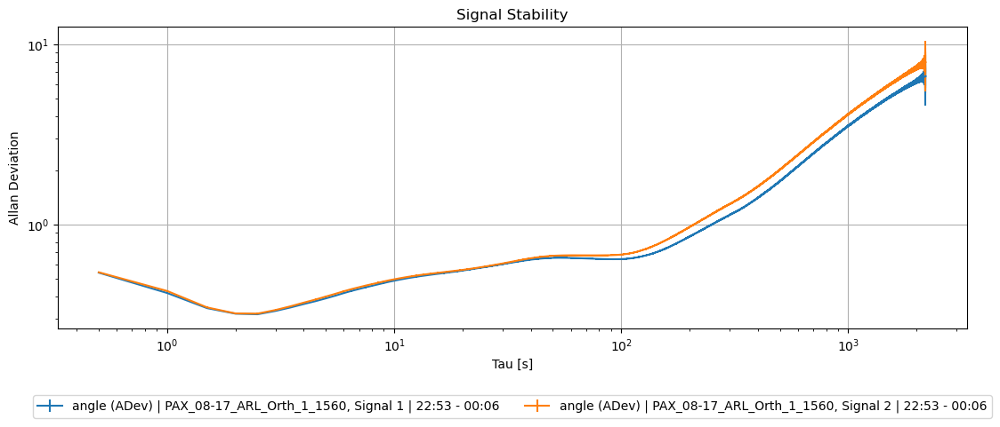

1 | PAX_08-17_ARL_Orth_1_1560 | bsr = 400.00 | nom rate = 200.00 | avg rate = 57.41


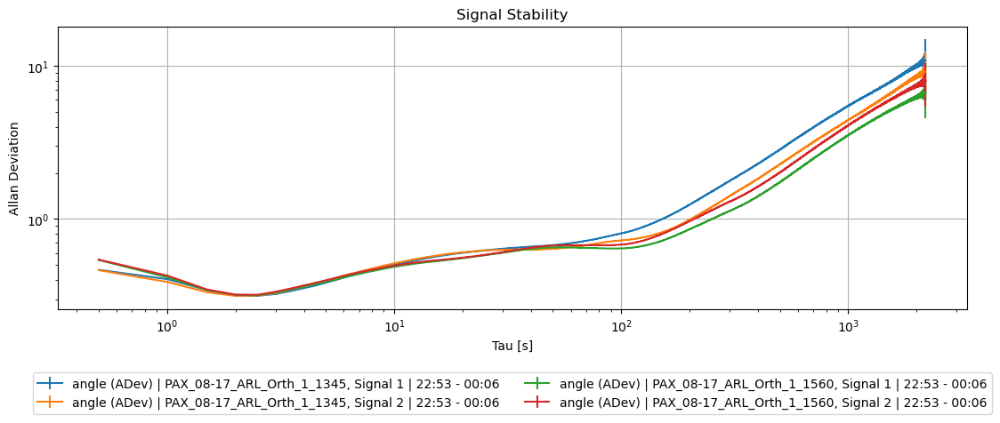

In [127]:
ARL_datasets = []; ARL_params_arr = []; i=0
print(BOLD_ON + '===== Datasets =====' + BOLD_OFF)
for file_path in filepath_ARL_list:
    ds = SwitchSet(file_path,set_range=(0.05,0.15))
    ds.find_switches(nominal_switch_rate=2, print_process=True)
    ds.average_data(print_process=True)
    ds.calc_similarity(input_stokes='first')
    ds.plot_separated(plot_param='angle', plot_param_2='s3Avg', plot_signal=1)
    arr = ds.adev(plot_param='angle',num_taus=5000,plot_adev=True)
    ARL_datasets.append(ds)
    ARL_params_arr = ARL_params_arr + arr
    print('{:d} | {:s} | bsr = {:.2f} | nom rate = {:.2f} | avg rate = {:.2f}'.format(i,ds.title,ds.basic_sample_rate,ds.nominal_sample_rate,ds.avg_sample_rate))
    i+=1
print(BOLD_ON + '========================' + BOLD_OFF)
StationarySet.plot_adev(ARL_params_arr)

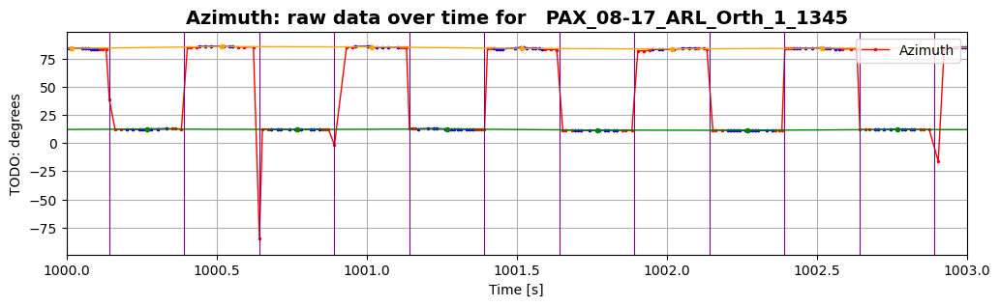

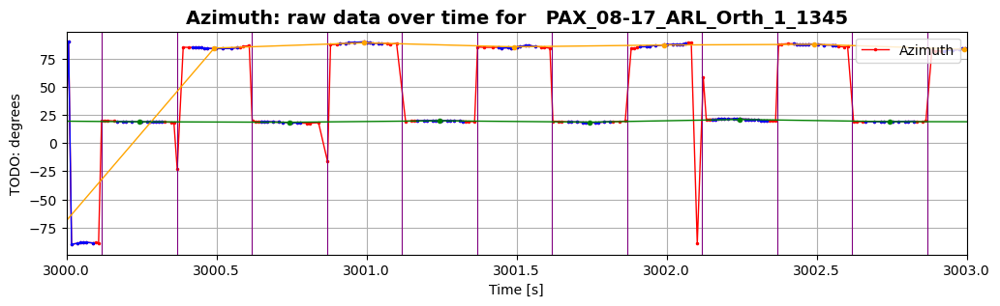

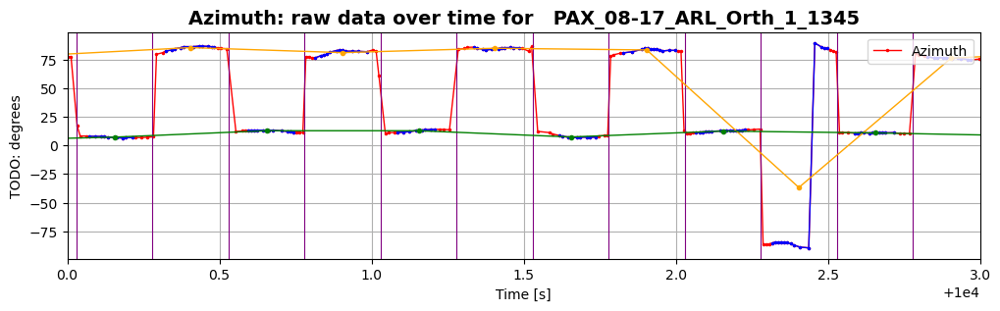

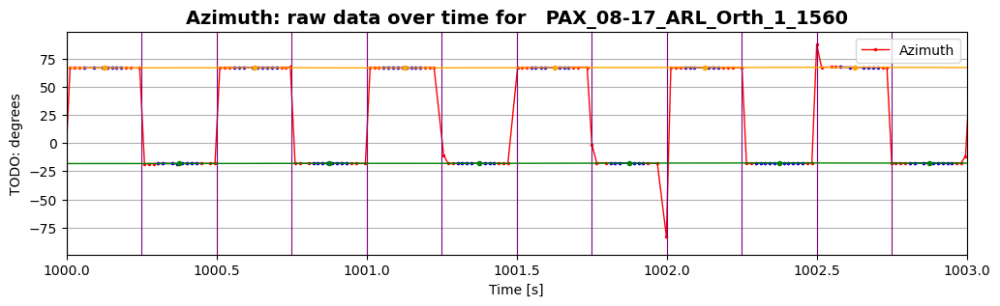

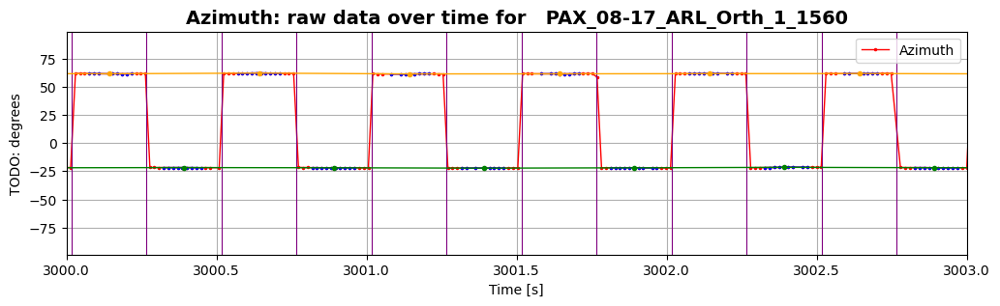

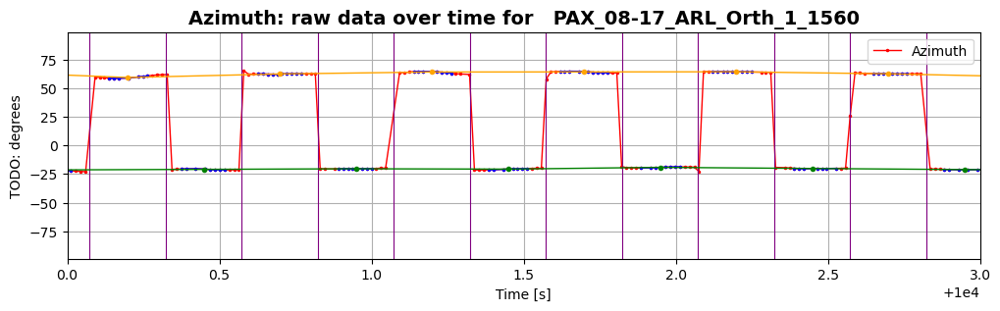

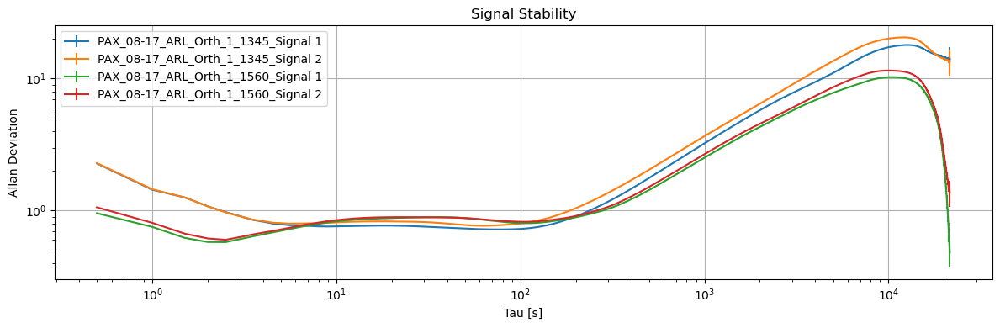

In [207]:
ARL_params_arr = []
for ds in ARL_datasets:
    ds.plot_raw(birds_eye=False,sample_range=(1000,1003),plot_switch=True,plot_valid=True,plot_avg=True)
    ds.plot_raw(birds_eye=False,sample_range=(3000,3003),plot_switch=True,plot_valid=True,plot_avg=True)
    ds.plot_raw(birds_eye=False,sample_range=(10000,10003),plot_switch=True,plot_valid=True,plot_avg=True)
    taus2_1,ad_1,ade_1,ns_1,taus2_2,ad_2,ade_2,ns_2 = ds.adev(plot_param='Ellipticity',num_taus=5000,plot_adev=False)
    label = ds.title
    ARL_params_arr.append((taus2_1,ad_1,ade_1,ns_1,label+'_Signal 1'))
    ARL_params_arr.append((taus2_2,ad_2,ade_2,ns_2,label+'_Signal 2'))
StationarySet.plot_adev(ARL_params_arr)

#### ADEV: 30m

In [ ]:
filepath_con_1_1345='Datasets/Whole_setup/08-17/PAX_08-17_Connector_Orth_1_1345.csv'
filepath_con_1_1560='Datasets/Whole_setup/08-17/PAX_08-17_Connector_Orth_1_1560.csv'
filepath_con_list = [filepath_con_1_1345,filepath_con_1_1560]

In [ ]:
con_datasets = []; i=0
print(BOLD_ON + '===== Datasets =====' + BOLD_OFF)
for file_path in filepath_con_list:
    ds = SwitchSet(file_path,set_range=(600,-600))
    ds.find_switches(nominal_switch_rate=2, change_point_range_1=(600,800), change_point_range_2=(3000,3200),print_process=False)
    ds.average_data(print_process=False)
    con_datasets.append(ds)
    print('{:d} | {:s} | bsr = {:.2f} | nom rate = {:.2f} | avg rate = {:.2f}'.format(i,ds.title,ds.basic_sample_rate,ds.nominal_sample_rate,ds.avg_sample_rate))
    i+=1
print(BOLD_ON + '========================' + BOLD_OFF)

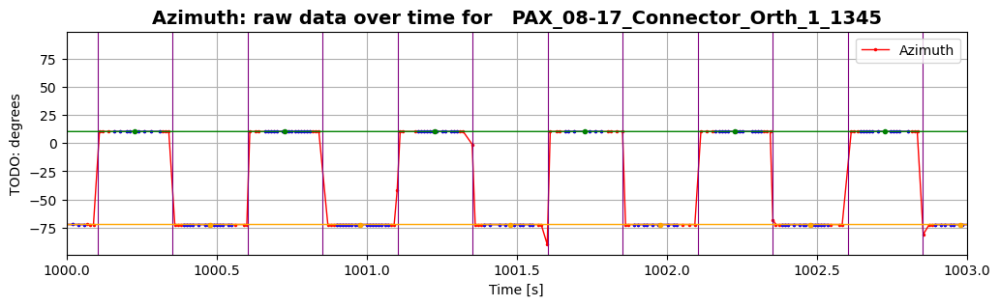

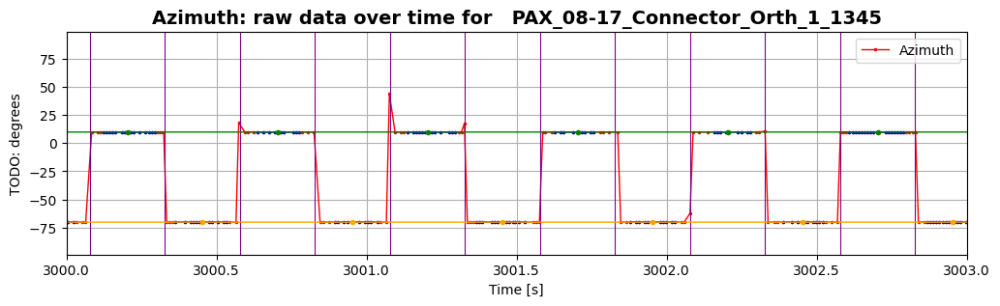

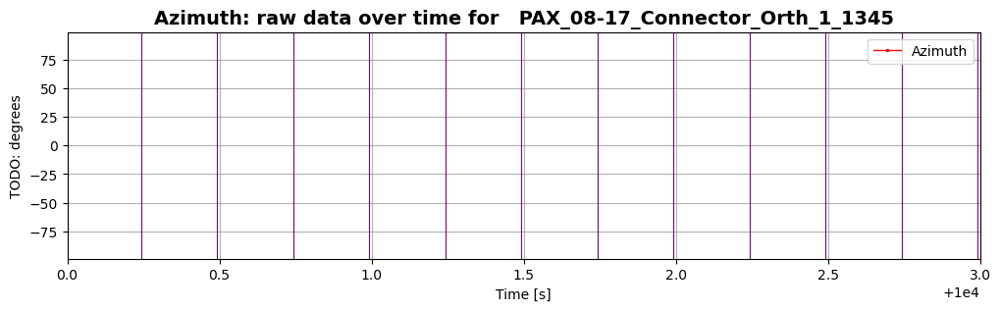

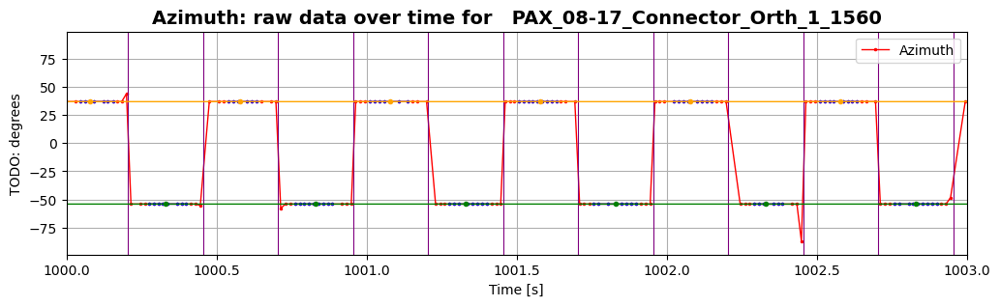

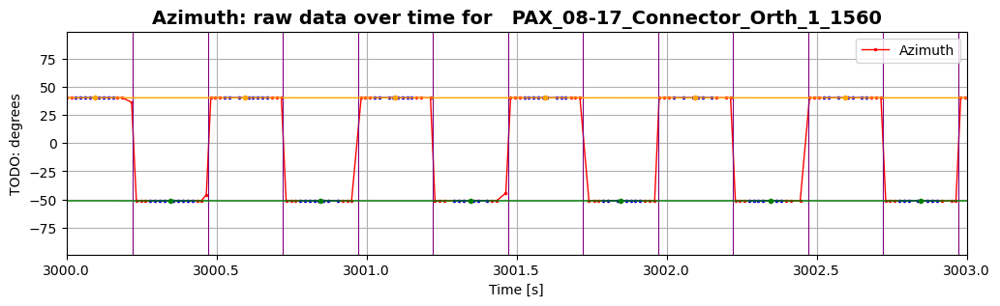

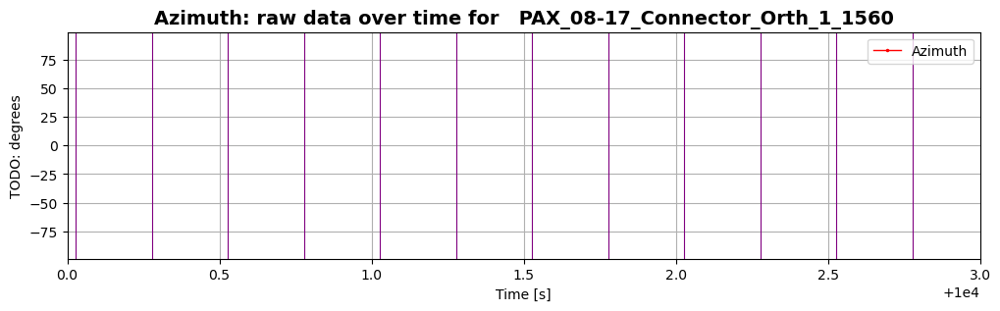

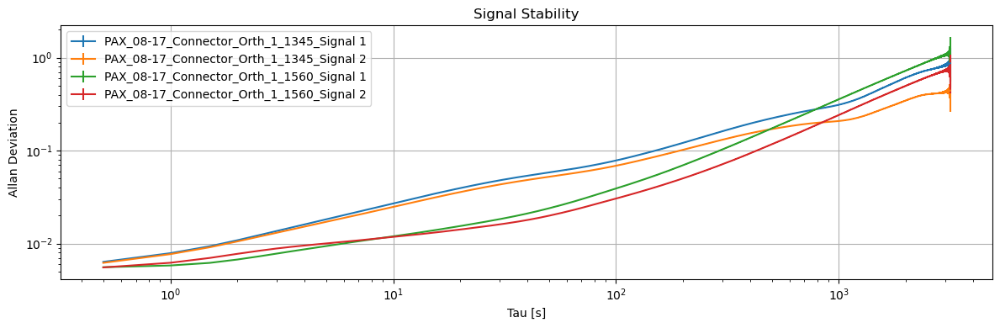

In [209]:
Connector_params_arr = []
for ds in Connector_datasets:
    ds.plot_raw(birds_eye=False,sample_range=(1000,1003),plot_switch=True,plot_valid=True,plot_avg=True)
    ds.plot_raw(birds_eye=False,sample_range=(3000,3003),plot_switch=True,plot_valid=True,plot_avg=True)
    ds.plot_raw(birds_eye=False,sample_range=(10000,10003),plot_switch=True,plot_valid=True,plot_avg=True)
    taus2_1,ad_1,ade_1,ns_1,taus2_2,ad_2,ade_2,ns_2 = ds.adev(plot_param='Ellipticity',num_taus=5000,plot_adev=False)
    label = ds.title
    Connector_params_arr.append((taus2_1,ad_1,ade_1,ns_1,label+'_Signal 1'))
    Connector_params_arr.append((taus2_2,ad_2,ade_2,ns_2,label+'_Signal 2'))
StationarySet.plot_adev(Connector_params_arr)

#### ADEV: DC

In [59]:
filepath_DC_1_1345='Datasets/Whole_setup/08-17/PAX_08-17_DC_Orth_1_1345.csv'
filepath_DC_1_1560='Datasets/Whole_setup/08-17/PAX_08-17_DC_Orth_1_1560.csv'
filepath_DC_list = [filepath_DC_1_1345,filepath_DC_1_1560]

In [60]:
DC_datasets = []; i=0
print(BOLD_ON + '===== Datasets =====' + BOLD_OFF)
for file_path in filepath_DC_list:
    ds = SwitchSet(file_path,set_range=(600,-600))
    ds.find_switches(nominal_switch_rate=2, change_point_range_1=(600,800), change_point_range_2=(3000,3200),print_process=False)
    ds.average_data(print_process=False)
    ds.calc_transfer(input_stokes='first')
    DC_datasets.append(ds)
    print('{:d} | {:s} | bsr = {:.2f} | nom rate = {:.2f} | avg rate = {:.2f}'.format(i,ds.title,ds.basic_sample_rate,ds.nominal_sample_rate,ds.avg_sample_rate))
    i+=1
print(BOLD_ON + '========================' + BOLD_OFF)

===== Datasets =====
Time range: min=600.005, max=48479.705


TypeError: can only concatenate str (not "float") to str

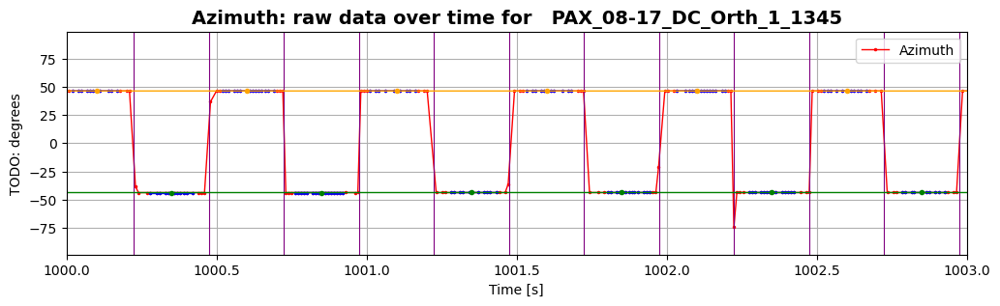

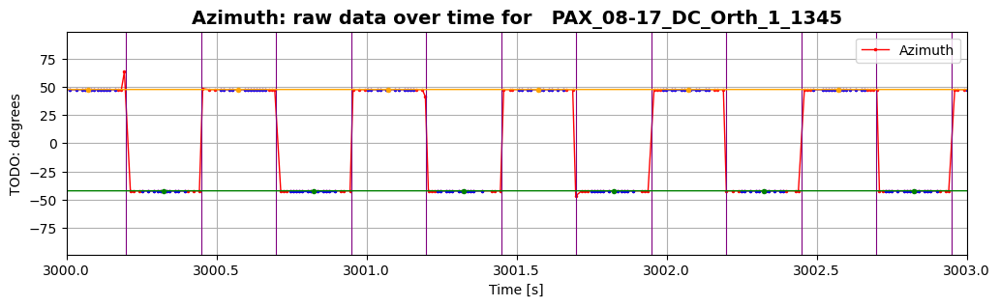

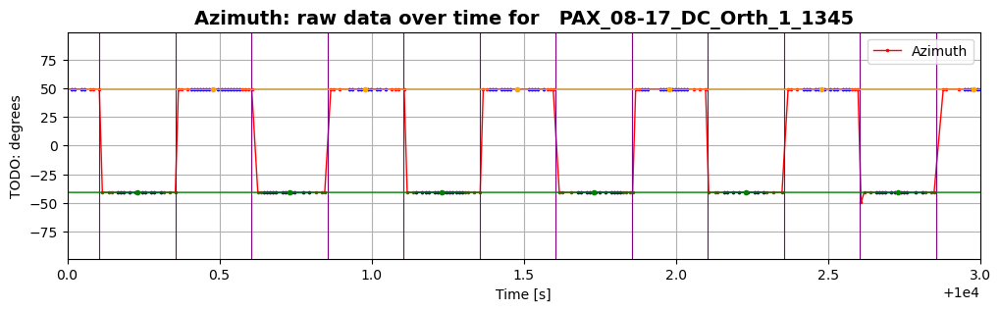

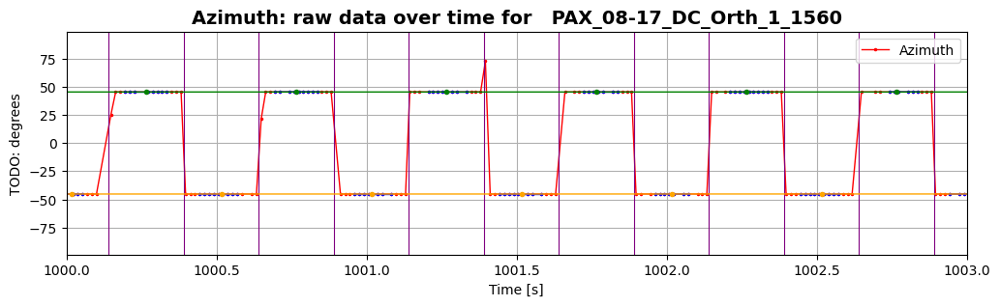

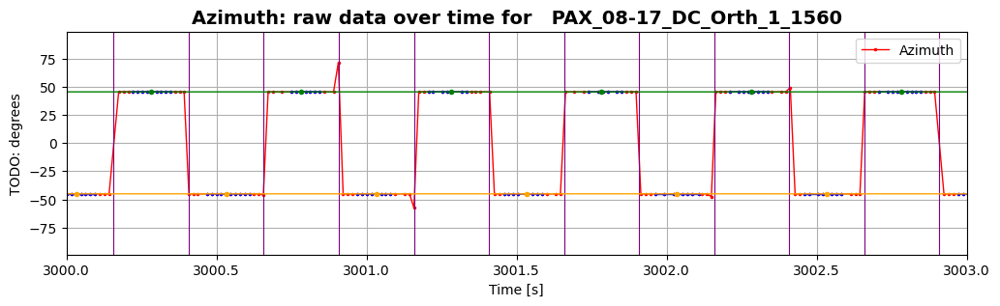

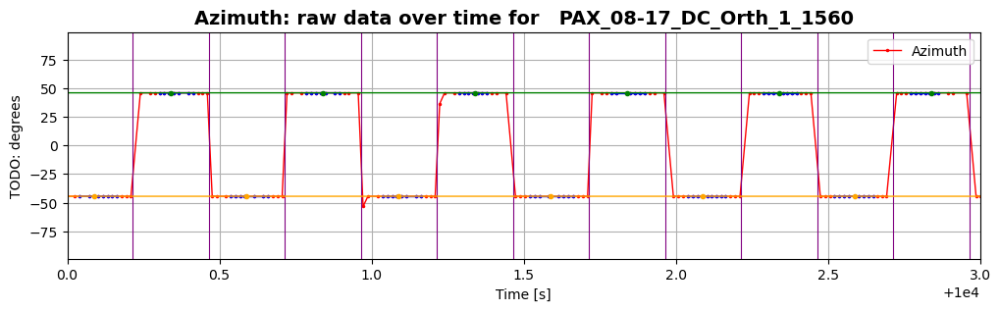

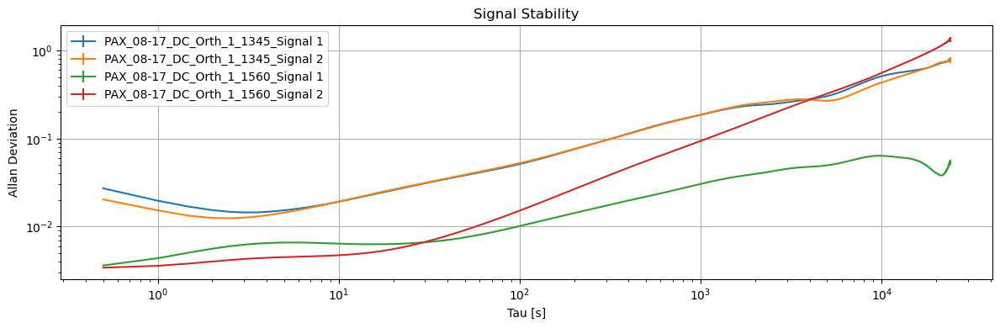

In [211]:
DC_params_arr = []
for ds in DC_datasets:
    ds.plot_raw(birds_eye=False,plot_param='dot',sample_range=(1000,1003),plot_switch=True,plot_valid=True,plot_avg=True)
    ds.plot_raw(birds_eye=False,plot_param='dot',sample_range=(3000,3003),plot_switch=True,plot_valid=True,plot_avg=True)
    ds.plot_raw(birds_eye=False,plot_param='dot',sample_range=(10000,10003),plot_switch=True,plot_valid=True,plot_avg=True)
    taus2_1,ad_1,ade_1,ns_1,taus2_2,ad_2,ade_2,ns_2 = ds.adev(plot_param='dot',num_taus=5000,plot_adev=False)
    label = ds.title
    DC_params_arr.append((taus2_1,ad_1,ade_1,ns_1,label+'_Signal 1'))
    DC_params_arr.append((taus2_2,ad_2,ade_2,ns_2,label+'_Signal 2'))
StationarySet.plot_adev(DC_params_arr)

#### debugging

In [175]:
filepath_DC_1_1345='Datasets/Whole_setup/08-17/PAX_08-17_DC_Orth_1_1345.csv'
ds_1 = SwitchSet(filepath_DC_1_1345,set_range=(600,-600))

In [176]:
ds_1.find_switches(nominal_switch_rate=2, change_point_range_1=(600,700), change_point_range_2=(3000,3100),print_process=False)

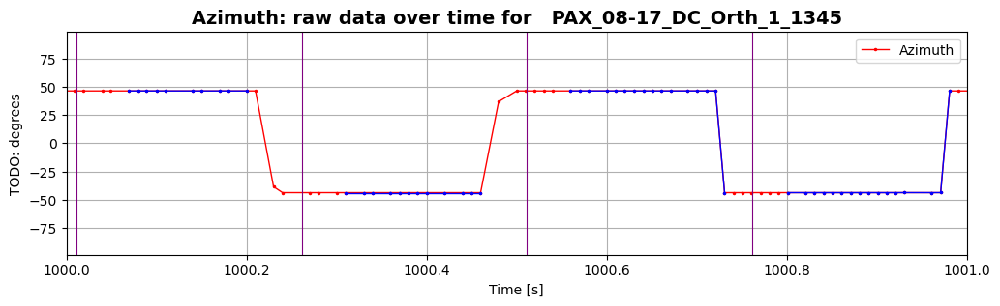

In [189]:
ds_1.plot_raw(birds_eye=False,sample_range=(1000,1001),plot_switch=True,plot_valid=True)

In [187]:
off = ds_1.switch_offset
time = ds_1.switch_time
print(off)
print(time)
num*time+off

0.17026419250584857
0.25002281928735265


3000.4440956407375

In [178]:
ds_2 = SwitchSet(filepath_DC_1_1345,set_range=(600,-600))

In [179]:
ds_2.find_switches(nominal_switch_rate=2, change_point_range_1=(600,700), change_point_range_2=None,print_process=False)

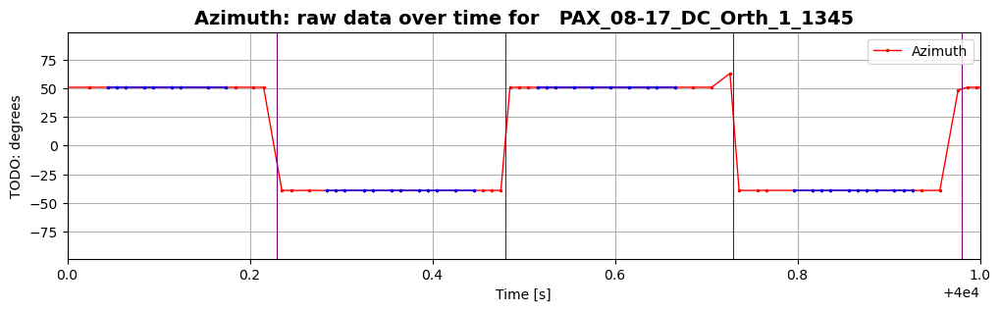

In [194]:
ds_2.plot_raw(birds_eye=False,sample_range=(40000,40001),plot_switch=True,plot_valid=True)

In [191]:
filepath_DC_1_1345='Datasets/Whole_setup/08-17/PAX_08-17_DC_Orth_1_1345.csv'
ds_3 = SwitchSet(filepath_DC_1_1345,set_range=(600,-600))

In [192]:
ds_3.find_switches(nominal_switch_rate=2, change_point_range_1=(600,700), change_point_range_2=(3000,3100),print_process=False)

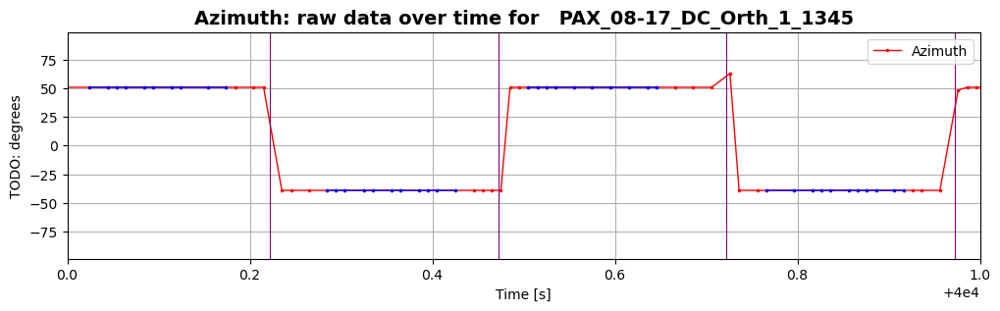

In [201]:
ds_3.plot_raw(birds_eye=False,sample_range=(40000,40001),plot_switch=True,plot_valid=True)

In [183]:
off = ds_2.switch_offset
time = ds_2.switch_time
print(off)
print(time)
num = np.ceil(3000/time)
print(num)
num*time+off

0.22959433962268216
0.25
12000.0


3000.2295943396225

#### Other stuff

In [ ]:
datasets = []; i=0
print(BOLD_ON + '===== Datasets =====' + BOLD_OFF)
for file_path in filepath_connector_list:
    ds = SwitchSet(file_path,set_range=(500,None))
    ds.find_switches(nominal_switch_rate=2, change_point_range_1=(550,650), change_point_range_2=(3000,3050),print_process=False)
    ds.average_data(print_process=False)
    datasets.append(ds)
    print('{:d} | {:s} | bsr = {:.2f} | nom rate = {:.2f} | avg rate = {:.2f}'.format(i,ds.title,ds.basic_sample_rate,ds.nominal_sample_rate,ds.avg_sample_rate))
    i+=1
print(BOLD_ON + '========================' + BOLD_OFF)

In [66]:
filepath='Datasets/Whole_setup/08-17/PAX_08-17_DC_Orth_1_1560.csv'
ds = SwitchSet(filepath,set_range=(500,None))
#ds.plot_raw()

#ds.find_switches(nominal_switch_rate=2, change_point_range_1=(550,650), change_point_range_2=(3000,3050))
#ds.average_data()
#ds.adev(plot_adev=True);

In [69]:
ds.find_switches(nominal_switch_rate=2, change_point_range_1=(550,650), change_point_range_2=(3000,3050),print_process=True)

Error in Second Tolerance: difference=0.14 < tolerance=0.50
Likely cause: FPCs moved during setup OR high variability in dataset
Error in Second Tolerance: difference=0.23 < tolerance=0.50
Likely cause: FPCs moved during setup OR high variability in dataset


In [85]:
ds.average_data(print_process=True)

Dropped 16 observations with <4 points (out of total 194346 observations)
adding 16 total
length before: 194330

Marked ind=1116: Imputing single gap at t=779.5 of length 0.530 seconds (vs nominal switch time of 0.250 seconds)
Marked ind=1117: Imputing single gap at t=780.0 of length 0.502 seconds (vs nominal switch time of 0.250 seconds)


TypeError: can only concatenate str (not "float") to str

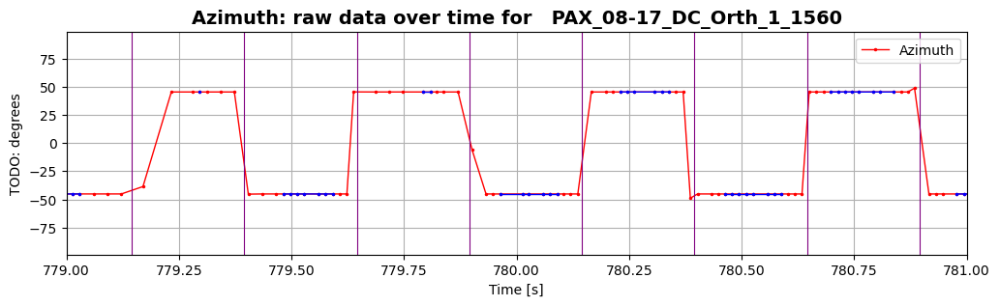

In [86]:
ds.plot_raw(birds_eye=False,sample_range=(779,781),plot_switch=True,plot_valid=True)

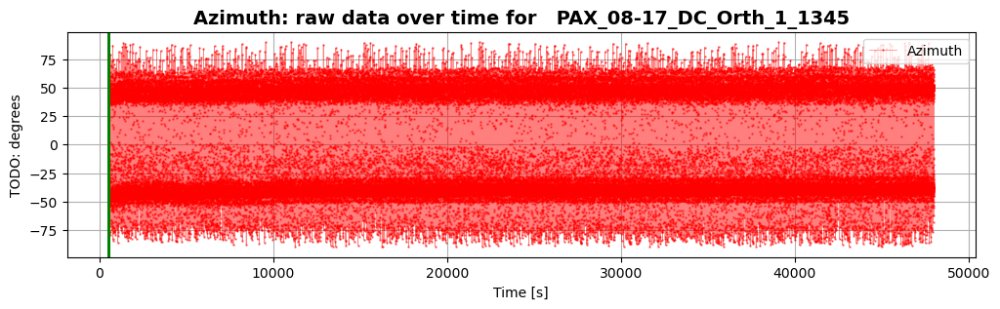

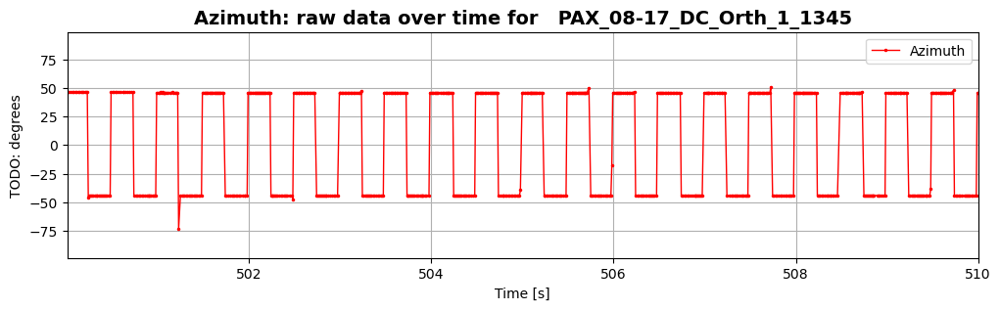

In [112]:
filepath_DC_1_1345='Datasets/Whole_setup/08-17/PAX_08-17_DC_Orth_1_1345.csv'
ds_DC_1_1345 = SwitchSet(filepath_DC_1_1345,set_range=(500,48000))
ds_DC_1_1345.plot_raw(sample_range=(None,510))

noise_tolerance = 0.0
first_tolerance = 1.0
second_tolerance = 0.5

Error in Second Tolerance: difference=0.24 < tolerance=0.50
Likely cause: FPCs moved during setup OR high variability in dataset
jump_fig for: switch parameter = s1



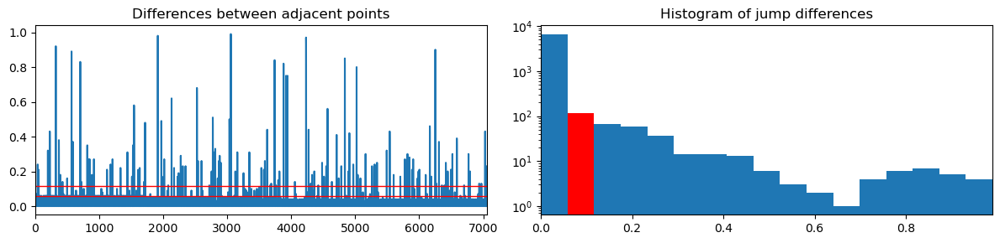



jump_fig for: switch parameter = s2



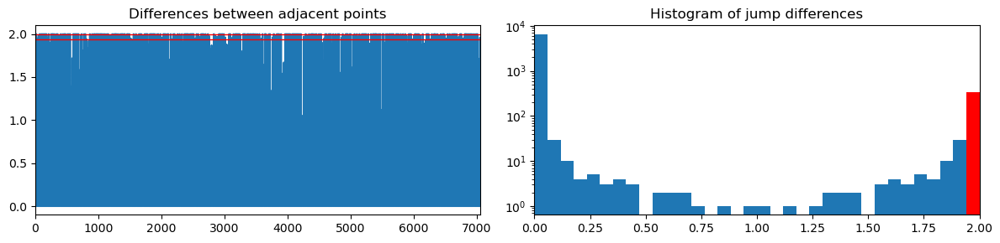



Error in (adjusted) Second Tolerance: difference=0.02 < tolerance=0.20
Likely cause: FPCs moved during setup OR high variability in dataset
jump_fig for: switch parameter = s3



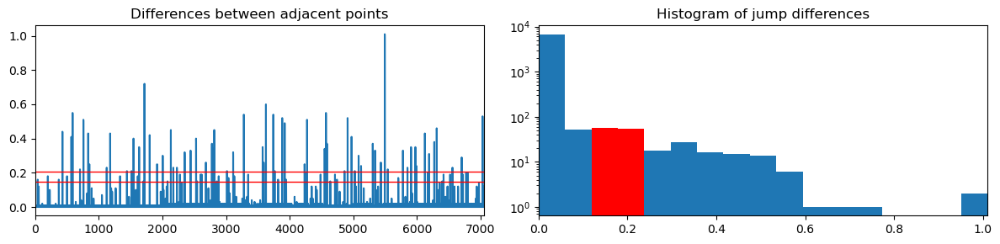



switch parameter = s3

Jump points detected: 64
out of total: ~400.0



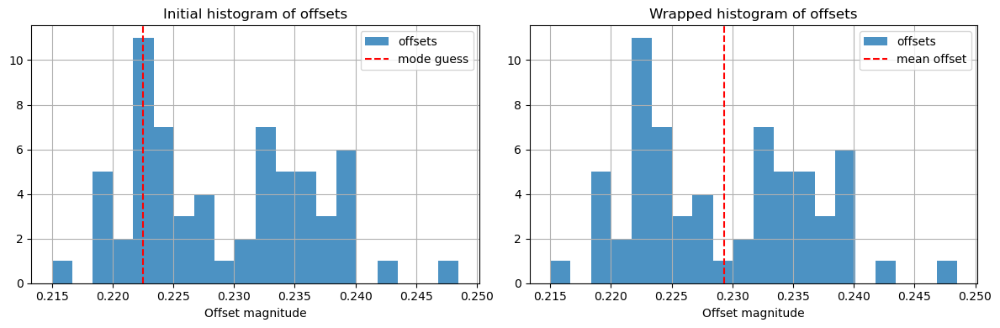



noise_tolerance = 0.0
first_tolerance = 1.0
second_tolerance = 0.5

jump_fig for: switch parameter = s1



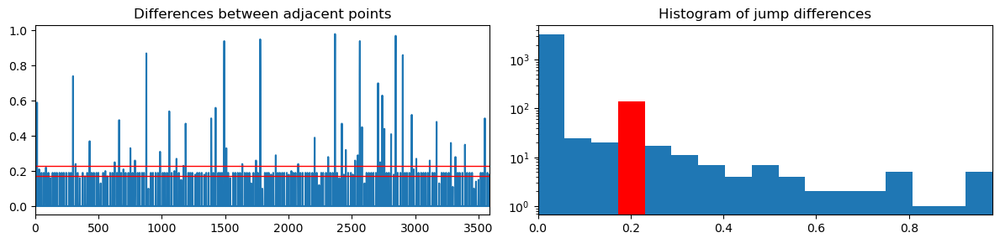



jump_fig for: switch parameter = s2



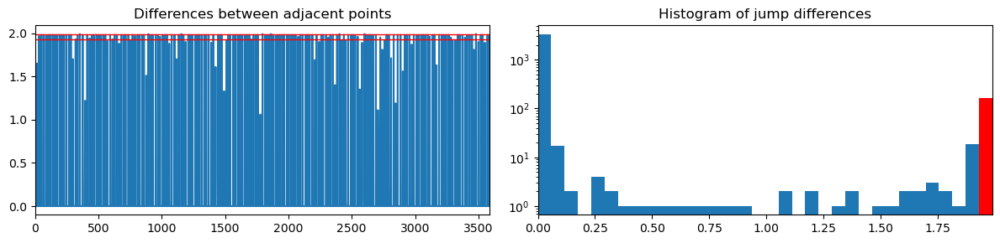



Error in (adjusted) Second Tolerance: difference=0.05 < tolerance=0.20
Likely cause: FPCs moved during setup OR high variability in dataset
jump_fig for: switch parameter = s3



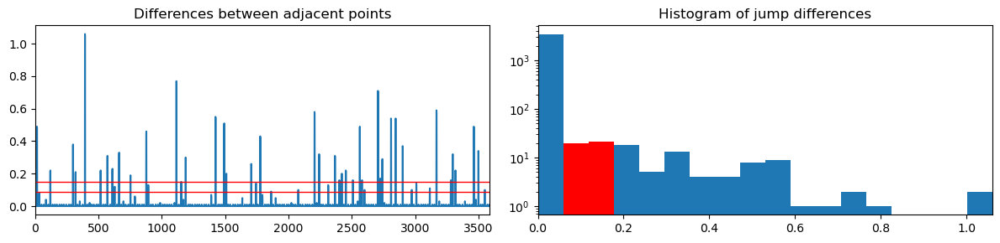



switch parameter = s3

Jump points detected: 22
out of total: ~199.9



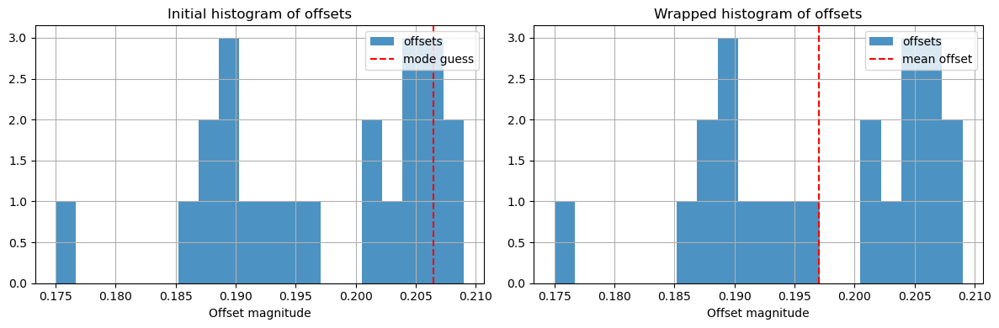



Nominal Switch Time = 0.2500000
Offset change of -0.032 seconds over 9700.0 switches
Corrected Switch Time = 0.2499967


In [113]:
ds_DC_1_1345.find_switches(nominal_switch_rate=2, change_point_range_1=(550,650), change_point_range_2=(3000,3050),print_process=True)

In [114]:
ds_DC_1_1345.average_data(print_process=True)

Dropped 136 observations with <4 points (out of total 189801 observations)
adding 336 total
length before: 189665

Marked ind=1026: Imputing single gap at t=757.1 of length 0.512 seconds (vs nominal switch time of 0.250 seconds)
Marked ind=1053: Imputing single gap at t=764.1 of length 0.527 seconds (vs nominal switch time of 0.250 seconds)
Marked ind=1055: Imputing single gap at t=764.8 of length 0.529 seconds (vs nominal switch time of 0.250 seconds)
Marked ind=31708: Imputing single gap at t=8428.2 of length 0.498 seconds (vs nominal switch time of 0.250 seconds)
Marked ind=33251: Imputing single gap at t=8814.2 of length 0.491 seconds (vs nominal switch time of 0.250 seconds)
Marked ind=34388: Imputing single gap at t=9098.7 of length 0.479 seconds (vs nominal switch time of 0.250 seconds)
Marked ind=34616: Imputing single gap at t=9156.0 of length 0.492 seconds (vs nominal switch time of 0.250 seconds)
Marked ind=34845: Imputing single gap at t=9213.5 of length 0.536 seconds (vs n

Marked ind=68052: Imputing single gap at t=17528.6 of length 0.535 seconds (vs nominal switch time of 0.250 seconds)
Marked ind=68442: Imputing single gap at t=17626.4 of length 0.498 seconds (vs nominal switch time of 0.250 seconds)
Marked ind=68833: Imputing single gap at t=17724.4 of length 0.503 seconds (vs nominal switch time of 0.250 seconds)
Marked ind=69225: Imputing single gap at t=17822.6 of length 0.517 seconds (vs nominal switch time of 0.250 seconds)
Marked ind=69623: Imputing single gap at t=17922.4 of length 0.500 seconds (vs nominal switch time of 0.250 seconds)
Marked ind=75631: Imputing single gap at t=19424.6 of length 0.524 seconds (vs nominal switch time of 0.250 seconds)
Marked ind=76832: Imputing single gap at t=19725.1 of length 0.518 seconds (vs nominal switch time of 0.250 seconds)
Marked ind=79635: Imputing single gap at t=20426.1 of length 0.508 seconds (vs nominal switch time of 0.250 seconds)
Marked ind=80435: Imputing single gap at t=20626.3 of length 0.5

Marked ind=115631: Imputing single gap at t=29440.0 of length 0.528 seconds (vs nominal switch time of 0.250 seconds)
Marked ind=116431: Imputing single gap at t=29640.2 of length 0.498 seconds (vs nominal switch time of 0.250 seconds)
Marked ind=116830: Imputing single gap at t=29740.2 of length 0.502 seconds (vs nominal switch time of 0.250 seconds)
Marked ind=117229: Imputing single gap at t=29840.2 of length 0.523 seconds (vs nominal switch time of 0.250 seconds)
Marked ind=118028: Imputing single gap at t=30040.2 of length 0.550 seconds (vs nominal switch time of 0.250 seconds)
Marked ind=118428: Imputing single gap at t=30140.5 of length 0.502 seconds (vs nominal switch time of 0.250 seconds)
Marked ind=119629: Imputing single gap at t=30440.9 of length 0.520 seconds (vs nominal switch time of 0.250 seconds)
Marked ind=120428: Imputing single gap at t=30640.9 of length 0.535 seconds (vs nominal switch time of 0.250 seconds)
Marked ind=120828: Imputing single gap at t=30741.2 of l

Marked ind=146400: Imputing single gap at t=37150.6 of length 0.492 seconds (vs nominal switch time of 0.250 seconds)
Marked ind=147198: Imputing single gap at t=37350.9 of length 0.543 seconds (vs nominal switch time of 0.250 seconds)
Marked ind=147598: Imputing single gap at t=37451.1 of length 0.535 seconds (vs nominal switch time of 0.250 seconds)
Marked ind=147998: Imputing single gap at t=37551.4 of length 0.466 seconds (vs nominal switch time of 0.250 seconds)
Marked ind=148796: Imputing single gap at t=37751.6 of length 0.510 seconds (vs nominal switch time of 0.250 seconds)
Marked ind=149195: Imputing single gap at t=37851.6 of length 0.507 seconds (vs nominal switch time of 0.250 seconds)
Marked ind=149594: Imputing single gap at t=37951.6 of length 0.549 seconds (vs nominal switch time of 0.250 seconds)
Marked ind=149994: Imputing single gap at t=38051.8 of length 0.515 seconds (vs nominal switch time of 0.250 seconds)
Marked ind=150393: Imputing single gap at t=38151.8 of l

Marked ind=175157: Imputing single gap at t=44361.3 of length 0.584 seconds (vs nominal switch time of 0.250 seconds)
Marked ind=175955: Imputing single gap at t=44561.5 of length 0.552 seconds (vs nominal switch time of 0.250 seconds)
Marked ind=176355: Imputing single gap at t=44661.8 of length 0.501 seconds (vs nominal switch time of 0.250 seconds)
Marked ind=177552: Imputing single gap at t=44962.3 of length 0.521 seconds (vs nominal switch time of 0.250 seconds)
Marked ind=178750: Imputing single gap at t=45263.0 of length 0.561 seconds (vs nominal switch time of 0.250 seconds)
Marked ind=179149: Imputing single gap at t=45363.0 of length 0.550 seconds (vs nominal switch time of 0.250 seconds)
Marked ind=179948: Imputing single gap at t=45563.5 of length 0.520 seconds (vs nominal switch time of 0.250 seconds)
Marked ind=180347: Imputing single gap at t=45663.5 of length 0.535 seconds (vs nominal switch time of 0.250 seconds)
Marked ind=180747: Imputing single gap at t=45763.7 of l

Marked ind=185540: Imputing double gap at t=46965.7 of length 0.741 seconds (vs nominal switch time of 0.250 seconds)
Marked ind=187536: Imputing double gap at t=47466.2 of length 0.753 seconds (vs nominal switch time of 0.250 seconds)
Marked ind=188335: Imputing double gap at t=47666.7 of length 0.759 seconds (vs nominal switch time of 0.250 seconds)



length after: 190001
336 total added
Signal 1 size=95000	Signal 1 range: t=(500.60,47999.47)
Signal 2 size=95001	Signal 2 range: t=(500.35,47999.72)


Number of taus used for signal 1: 2481
Number of taus used for signal 2: 2481


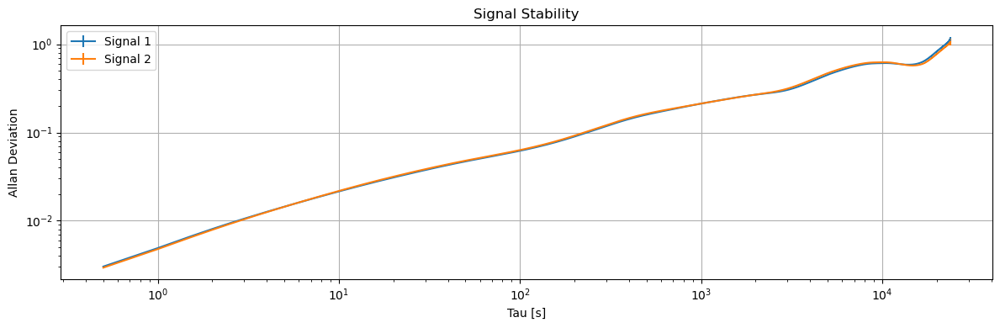

In [115]:
ds_DC_1_1345.adev(plot_adev=True);

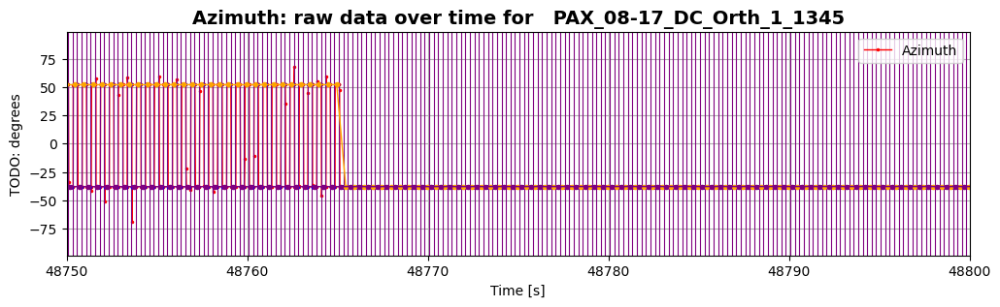

In [111]:
ds_DC_1_1345.plot_raw(birds_eye=False,sample_range=(48750,48800),plot_switch=True,plot_valid=True,plot_avg=True)

In [ ]:
filepath_ARL_1_1345='Datasets/Whole_setup/08-17/PAX_08-17_ARL_Orth_1_1345.csv'
ds_ARL_1_1345 = SwitchSet(filepath_ARL_1_1345,set_range=(500,None))
ds_ARL_1_1345.find_switches(nominal_switch_rate=2, change_point_range_1=(550,650), change_point_range_2=(3000,3050),print_process=True)
ds_ARL_1_1345.average_data(print_process=True)
ds_ARL_1_1345.adev(plot_adev=True);